# Plotting Notebook
Please use this is a guide to the type plots that you can create, as examples of the `hist`, `mplhep`, and other packages, as well as the use of the various functions that we have written in `plot_utils.py`. <br>
Use the the Table of Contents in Jupyter to view the different sections of the notebook to help navigating it.

In [27]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [28]:
%autoreload 1

In [29]:
import os, sys, glob, random
import pickle
import math
import multiprocessing
import itertools
import warnings
import json
import time
import numpy as np
from typing import Dict, List
from rich import print
from rich.pretty import pprint
from rich.console import Console
from rich.table import Table
from rich.progress import Progress, track
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import matplotlib.ticker as ticker
from cycler import cycler
import hist
from hist import Hist
import mplhep as hep
from tabulate import tabulate
import scipy
from scipy.special import binom
import uproot
import ROOT
from iminuit import Minuit
from iminuit.cost import LeastSquares
from jacobi import propagate

parent_dir = os.path.dirname(os.path.abspath(""))
sys.path.append(parent_dir)

%aimport plot_utils
%aimport plot_utils_extras

In [30]:
warnings.filterwarnings("ignore")
mpl.rcParams.update({"figure.max_open_warning": 0})
mpl.rcParams["figure.facecolor"] = "white"
hep.style.use("CMS")
np.set_printoptions(suppress=True)

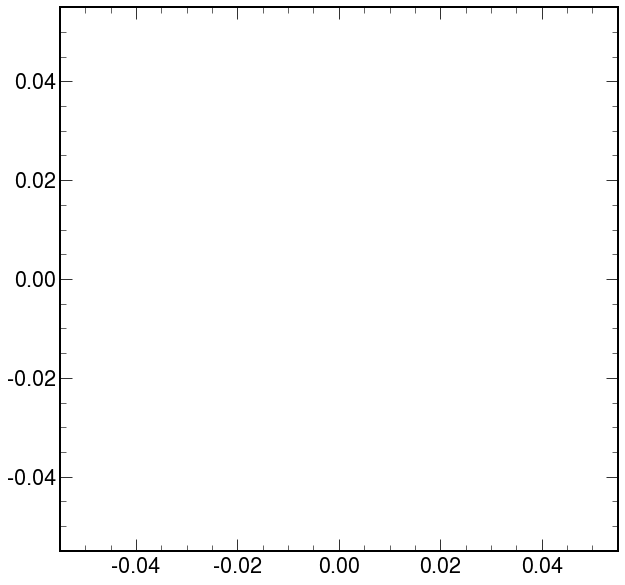

In [31]:
plt.plot()
hep.style.use(hep.style.CMS)
mpl.rcParams["figure.facecolor"] = "white"

In [32]:
print("The following output directories are available:")
!ls ../../processor_output_files | grep output_histograms

The following output directories are available:

CR_cb_34mu_output_histograms
CR_cb_combine_output_histograms
CR_cb_output_histograms
CR_cb_postDYstudy_output_histograms
CR_light_postDYstudy_output_histograms
CR_prompt_34mu_leading_output_histograms
CR_prompt_34mu_output_histograms
CR_prompt_combine_output_histograms
CR_prompt_dimuon_output_histograms
CR_prompt_dystudy_output_histograms
CR_prompt_leading_output_histograms
CR_prompt_output_histograms
CR_prompt_postDYstudy_output_histograms
DYstudy_2_output_histograms
DYstudy_3_output_histograms
DYstudy_4_output_histograms
DYstudy_5_output_histograms
DYstudy_output_histograms
DYstudy_trigger_match_double_output_histograms
DYstudy_trigger_match_triple_output_histograms
DYstudy_trigger_one_path_output_histograms
fake_rate_output_histograms
full_analysis_Nov2024_CR_output_histograms
full_analysis_Nov2024_SR_high_temp_output_histograms
full_analysis_Nov2024_SR_low_temp_output_histograms
full_analysis_Nov2024_VR_output_histograms
gen_bug_comparisons_output_histograms
high_temp_output_histog

## Load plots

In [33]:
plots_CR = plot_utils.loader(
    tag="full_analysis_Nov2024_CR"
)  # , custom_lumi=559.322, load_data=True)
plots_VR = plot_utils.loader(
    tag="full_analysis_Nov2024_VR"
)  # , custom_lumi=559.322, load_data=True)
plots_SR_low_temp = plot_utils.loader(
    tag="full_analysis_Nov2024_SR_low_temp"
)  # , custom_lumi=559.322, load_data=True)
plots_SR_high_temp = plot_utils.loader(
    tag="full_analysis_Nov2024_SR_high_temp"
)  # , custom_lumi=559.322, load_data=True)
plots = {}
for dataset in plots_CR:
    # Note: need to fix this to be mergable even when data for SR is missing! (blinded...)
    # This merges two dicts!
    plots[dataset] = (
        plots_CR[dataset]
        | plots_VR[dataset]
        | plots_SR_low_temp[dataset]
        | plots_SR_high_temp[dataset]
    )

In [34]:
for mS in [125, 200, 300, 400, 500, 600, 800, 1000]:
    sample = f"GluGluToSUEP_mS{mS}.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018"
    print(sample, round(plots[sample]["SR_high_temp_tight"][7j::sum].value / 5000, 5))

GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 3.57196

GluGluToSUEP_mS200.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 5.07467

GluGluToSUEP_mS300.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 5.31798

GluGluToSUEP_mS400.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 5.09795

GluGluToSUEP_mS500.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 4.41232

GluGluToSUEP_mS600.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 3.53082

GluGluToSUEP_mS800.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 2.26107

GluGluToSUEP_mS1000.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018 1.31624

In [35]:
for mS in [125, 200, 300, 400, 500, 600, 800, 1000]:
    sample = f"GluGluToSUEP_mS{mS}.000_mPhi8.000_T32.000_modehadronic_13TeV_2018"
    print(sample, round(plots[sample]["SR_high_temp_tight"][7j::sum].value / 200, 5))

GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 1.3455

GluGluToSUEP_mS200.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 1.55899

GluGluToSUEP_mS300.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 3.12709

GluGluToSUEP_mS400.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 4.22541

GluGluToSUEP_mS500.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 4.36681

GluGluToSUEP_mS600.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 3.3111

GluGluToSUEP_mS800.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 2.91901

GluGluToSUEP_mS1000.000_mPhi8.000_T32.000_modehadronic_13TeV_2018 2.33729

Fit results for SR_low_temp:
┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 70.84 (χ²/ndof = 17.7)     │              Nfcn = 66               │
│ EDM = 2.36e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬────────┬───────────┬───────────┬────────────┬────────

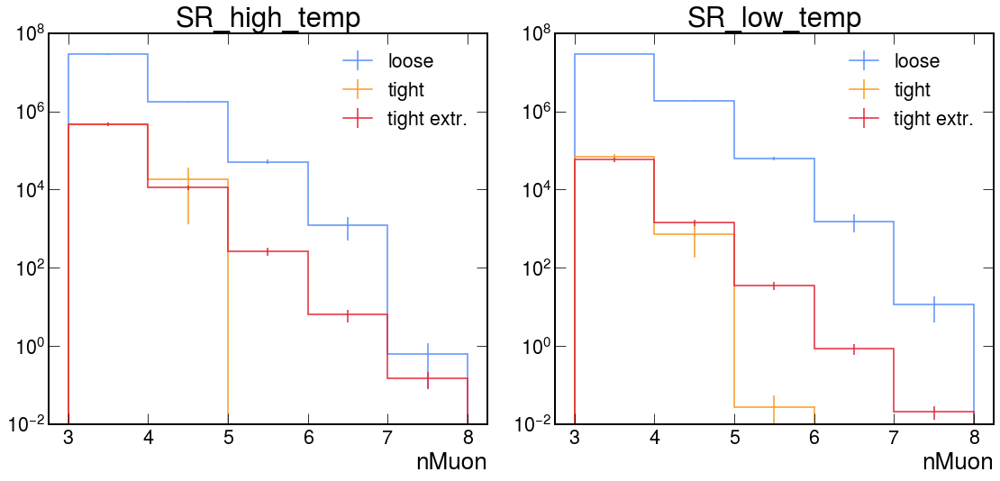

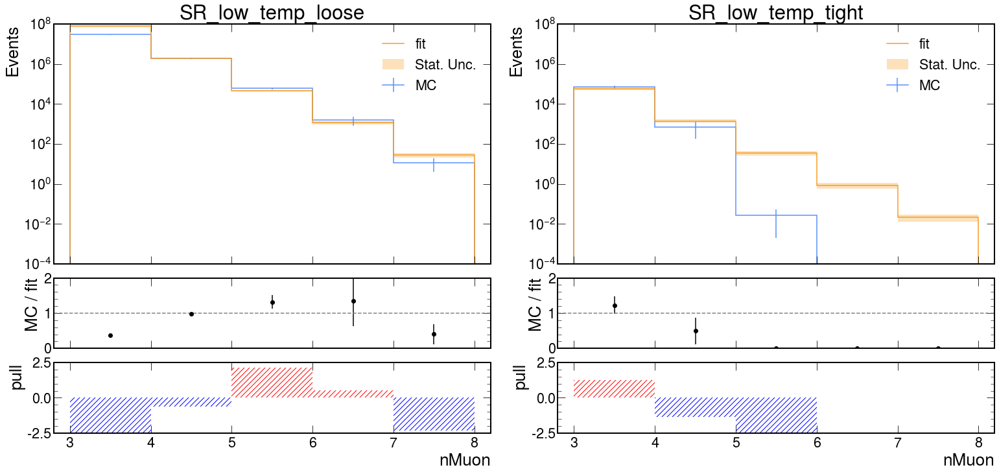

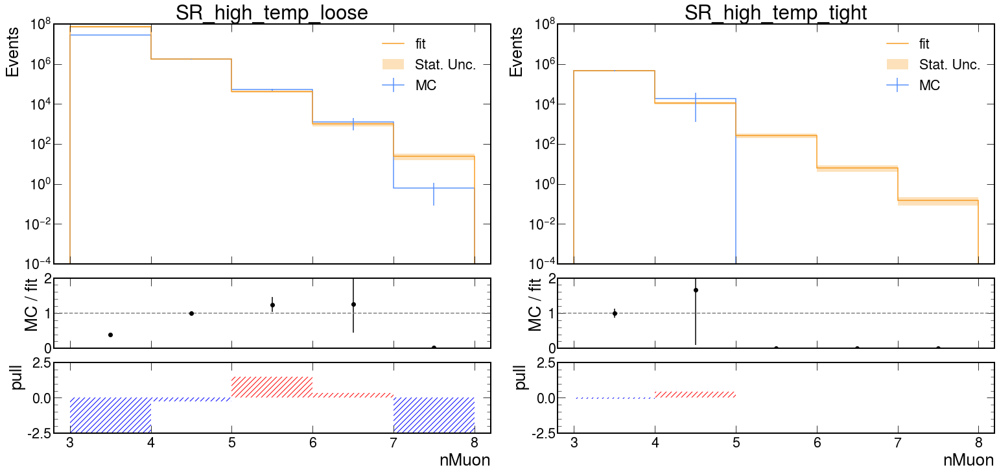

In [36]:
slice_hists = {
    "SR_low_temp_loose": slice(4j, None),
    "SR_low_temp_tight": slice(3j, None),
    "SR_high_temp_loose": slice(4j, None),
    "SR_high_temp_tight": slice(3j, None),
}

qcd_extrapolation = plot_utils.Extrapolation(plots["QCD_Pt_MuEnrichedPt5_2018"])
qcd_extrapolation.extrapolate(slice_hists=slice_hists, verbose=True)
qcd_extrapolation.plot_overlay()
qcd_extrapolation.plot_fit("SR_low_temp")
qcd_extrapolation.plot_fit("SR_high_temp")

Fit results for SR_low_temp:
┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.064 (χ²/ndof = 0.7)      │              Nfcn = 71               │
│ EDM = 1.43e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬────────┬───────────┬───────────┬────────────┬────────

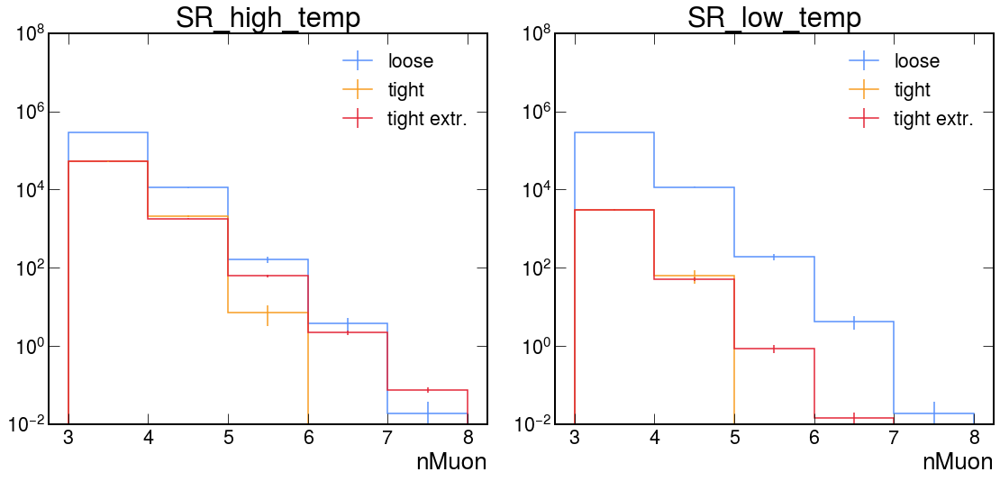

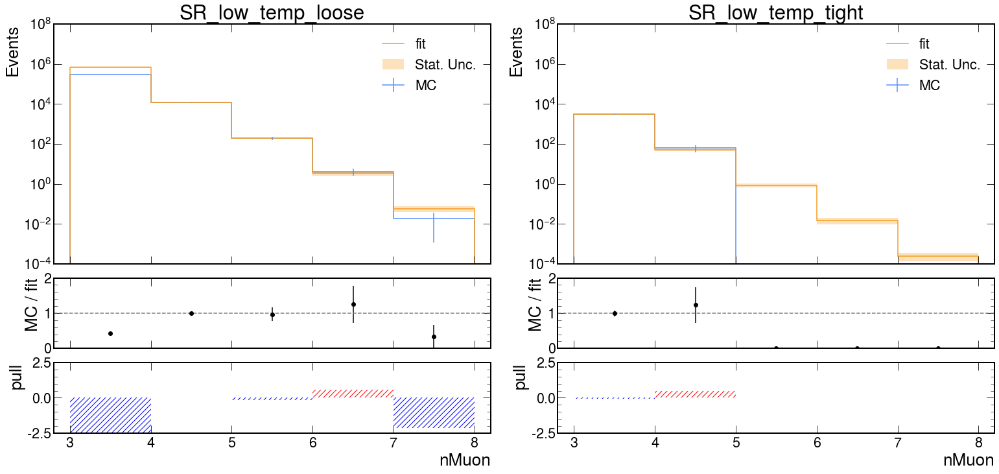

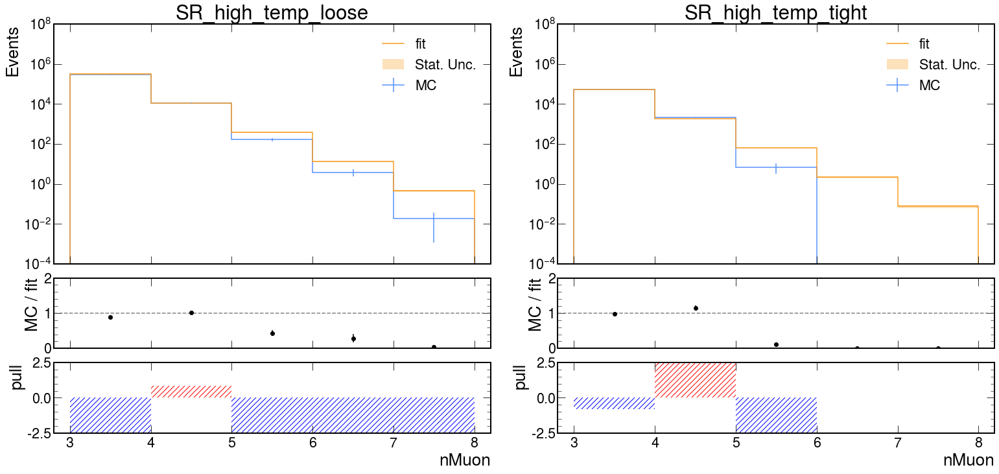

In [37]:
slice_hists = {
    "SR_low_temp_loose": slice(4j, None),
    "SR_low_temp_tight": slice(3j, None),
    "SR_high_temp_loose": slice(4j, None),
    "SR_high_temp_tight": slice(3j, None),
}
dy_extrapolation = plot_utils.Extrapolation(plots["DY_2018"])
dy_extrapolation.extrapolate(slice_hists=slice_hists, verbose=True)
dy_extrapolation.plot_overlay()
dy_extrapolation.plot_fit("SR_low_temp")
dy_extrapolation.plot_fit("SR_high_temp")

These are all the samples loaded.

In [39]:
pprint(list(plots.keys()))

[
│   'GluGluToSUEP_mS200.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS300.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS600.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS300.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS300.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS800.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi6.000_T12.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS800.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS600.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi6.000_T12.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS600.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS800.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS200.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS600.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS600.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS800.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS300.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS600.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi4.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS300.000_mPhi8.000_T16.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS500.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS300.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS800.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS1000.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS400.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS800.000_mPhi8.000_T

In [40]:
pprint(list(plots["DY_NJets_LO_2018"].keys()))

[
│   'CR_prompt',
│   'CR_light',
│   'CR_cb',
│   'VR',
│   'SR_low_temp_tight',
│   'SR_low_temp_loose',
│   'SR_high_temp_tight',
│   'SR_high_temp_loose'
]

In [41]:
pprint(plots)

{
│   'GluGluToSUEP_mS200.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': {
│   │   'CR_prompt': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'CR_light': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=23.3328, variance=544.421),
│   │   'CR_cb': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'VR': Hist(Regular(10, 0, 10, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=92.4965, variance=2139.01),
│   │   'SR_high_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_high_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0)
│   },
│   'GluGluToSUEP_mS125.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': {
│   │   'CR_prompt': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'CR_light': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=134.051, variance=5994.22),
│   │   'CR_cb': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=43.3392, variance=1878.28),
│   │   'VR': Hist(Regular(10, 0, 10, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=553.126, variance=23610),
│   │   'SR_high_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_high_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=43.0114, variance=1849.98)
│   },
│   'GluGluToSUEP_mS1000.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': {
│   │   'CR_prompt': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'CR_light': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'CR_cb': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0.793027, variance=0.628892),
│   │   'VR': Hist(Regular(10, 0, 10, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_high_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_high_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0)
│   },
│   'GluGluToSUEP_mS400.000_mPhi1.400_T0.350_modehadronic_13TeV_2018': {
│   │   'CR_prompt': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'CR_light': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=15.0154, variance=112.859),
│   │   'CR_cb': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=15.0154, variance=112.859),
│   │   'VR': Hist(Regular(10, 0, 10, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=0, variance=0),
│   │   'SR_low_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=30.9514

## Plot stack of bkgs for nMuon distribution

In [42]:
from cycler import cycler

cmap_petroff_6 = ["#5790fc", "#f89c20", "#e42536", "#964a8b", "#9c9ca1", "#7a21dd"]
cmap_petroff_10 = [
    "#3f90da",
    "#ffa90e",
    "#bd1f01",
    "#94a4a2",
    "#832db6",
    "#a96b59",
    "#e76300",
    "#b9ac70",
    "#717581",
    "#92dadd",
]

CMS = {"axes.prop_cycle": cycler("color", cmap_petroff_10)}
plt.style.use(CMS)
# np.set_printoptions(precision=3)

## Let's write a function that will create the QCD extrapolation
We need to:
1. Fit the histograms and get the parameters.
2. Produce the extrapolated histogram for QCD in SR_tight.
3. Export histograms to a root file. The QCD is going to be the extrapolated histogram.

In [43]:
pprint(plots["QCD_Pt_MuEnrichedPt5_2018"])

{
│   'CR_prompt': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=213130, variance=1.48573e+08),
│   'CR_light': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=2.22242e+07, variance=3.9518e+10),
│   'CR_cb': Hist(Regular(4, 1, 5, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=2.89203e+07, variance=6.63823e+10),
│   'VR': Hist(Regular(10, 0, 10, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=106787, variance=4.87019e+07),
│   'SR_low_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=71589.8, variance=1.07767e+08),
│   'SR_low_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=3.14942e+07, variance=7.73875e+10),
│   'SR_high_temp_tight': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=486120, variance=1.99151e+09),
│   'SR_high_temp_loose': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=3.05892e+07, variance=7.7248e+10),
│   'SR_low_temp_loose_extrapolation': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=8.02158e+07, variance=6.65763e+13),
│   'SR_low_temp_tight_extrapolation': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=59222.4, variance=6.74016e+07),
│   'SR_high_temp_loose_extrapolation': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=7.58623e+07, variance=8.61714e+13),
│   'SR_high_temp_tight_extrapolation': Hist(Regular(5, 3, 8, name='nMuon'), storage=Weight()) # Sum: WeightedSum(value=481082, variance=1.69471e+09)
}

## This is to explore which datasets are the best

CR_prompt

DY_2018

173908.129 ± 811.016

211759.817 ± 662.627

227.130 ± 16.854

5.703 ± 1.462

TT_powheg_2018

173862.478 ± 81.756

46780.962 ± 39.512

85.226 ± 1.701

0.548 ± 0.133

TTV_2018

601.434 ± 3.395

336.245 ± 1.744

91.423 ± 0.244

3.164 ± 0.042

ST_NLO_2018

9312.014 ± 21.687

2612.991 ± 14.180

4.809 ± 0.612

-0.096 ± 0.068

WJets_2018

15789.346 ± 1040.795

202.323 ± 13.673

22.899 ± 4.551

0.000 ± 0.000

VV+VVV_2018

4911.335 ± 18.894

5367.670 ± 18.943

2115.469 ± 14.736

154.629 ± 0.347

Higgs_2018

80.384 ± 0.296

50.112 ± 0.128

12.575 ± 0.060

1.570 ± 0.019

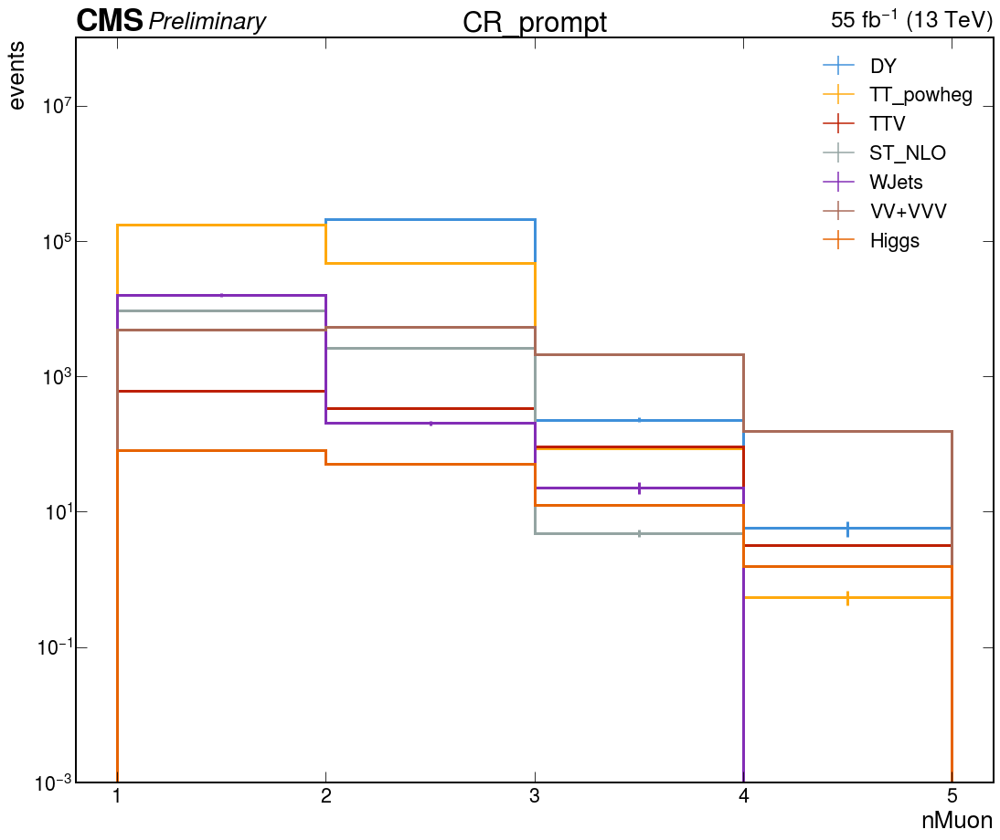

CR_light

DY_2018

192470.268 ± 972.083

7977.567 ± 208.737

297.094 ± 48.670

1.598 ± 1.022

TT_powheg_2018

136967.271 ± 74.930

44569.629 ± 44.855

5718.677 ± 17.167

203.806 ± 3.339

TTV_2018

547.864 ± 3.191

173.793 ± 2.005

26.495 ± 0.821

1.406 ± 0.212

ST_NLO_2018

7189.586 ± 18.951

2219.441 ± 9.963

261.698 ± 3.413

7.866 ± 0.595

WJets_2018

8273.507 ± 713.056

4976.695 ± 326.211

257.133 ± 12.036

4.208 ± 1.302

VV+VVV_2018

2585.749 ± 11.877

286.384 ± 5.972

13.835 ± 1.352

0.015 ± 0.034

Higgs_2018

32.906 ± 0.214

8.014 ± 0.114

0.396 ± 0.025

0.004 ± 0.002

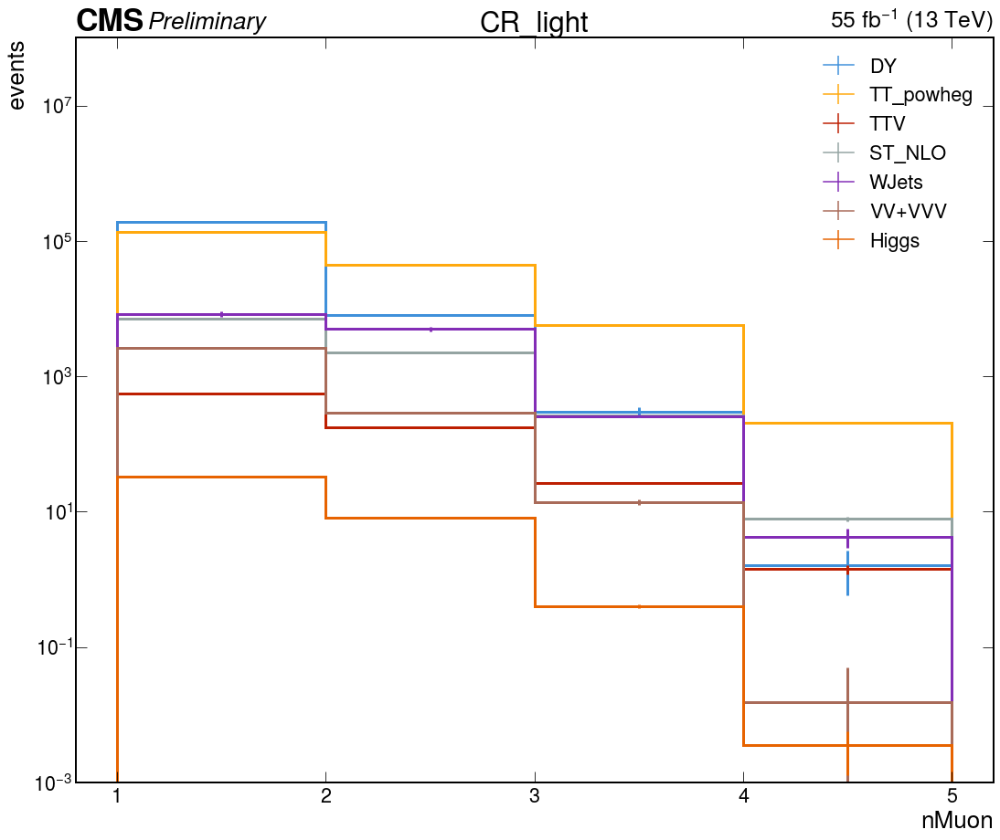

CR_cb

DY_2018

182433.405 ± 938.991

6808.712 ± 168.218

214.420 ± 23.959

10.432 ± 3.751

TT_powheg_2018

165484.225 ± 81.024

82819.637 ± 59.710

11362.773 ± 23.588

357.819 ± 4.304

TTV_2018

625.051 ± 3.353

278.390 ± 2.365

47.993 ± 0.928

2.539 ± 0.189

ST_NLO_2018

9043.173 ± 21.856

5081.760 ± 15.043

681.104 ± 5.497

19.025 ± 0.936

WJets_2018

9430.290 ± 870.630

3602.250 ± 358.555

388.037 ± 181.114

5.308 ± 1.728

VV+VVV_2018

2009.694 ± 10.262

142.597 ± 3.292

8.011 ± 0.738

0.143 ± 0.049

Higgs_2018

37.880 ± 0.230

22.633 ± 0.196

2.040 ± 0.059

0.044 ± 0.008

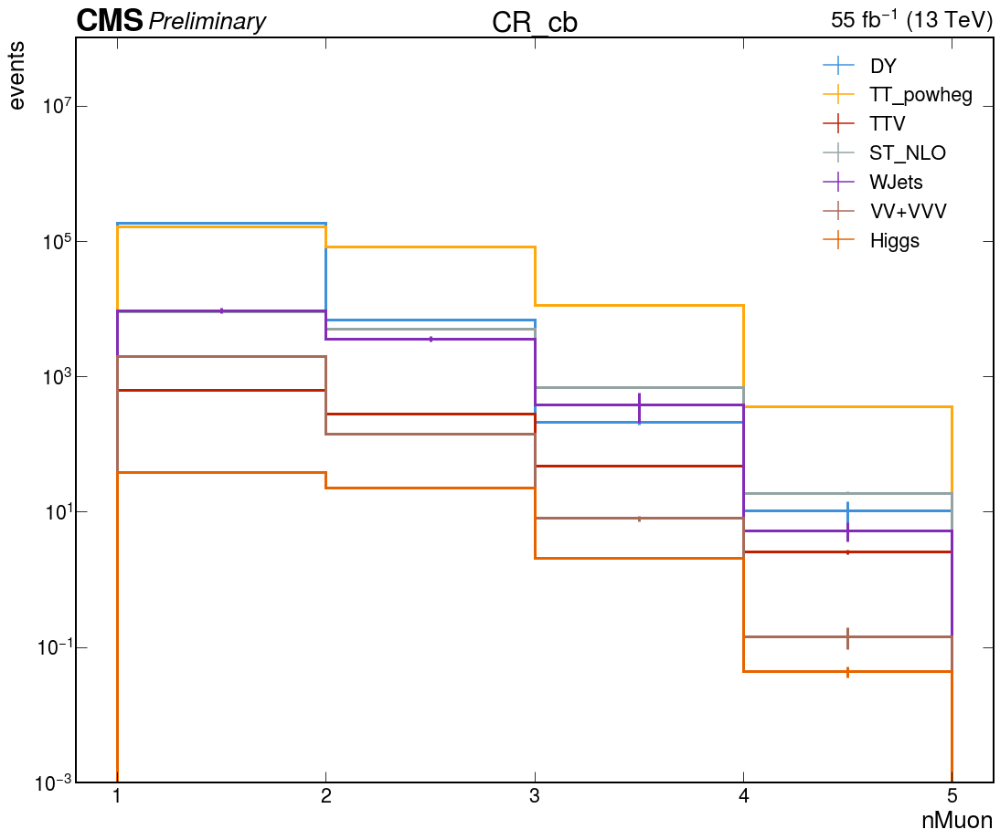

VR

DY_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

252852.549 ± 686.227

11815.320 ± 139.371

307.028 ± 21.154

11.297 ± 3.144

0.578 ± 0.405

0.000 ± 0.000

0.000 ± 0.000

TT_powheg_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

13487.747 ± 22.307

1736.920 ± 7.961

112.764 ± 2.017

4.961 ± 0.423

0.175 ± 0.079

0.000 ± 0.000

0.000 ± 0.000

TTV_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

296.631 ± 1.037

79.791 ± 0.428

11.029 ± 0.119

1.050 ± 0.052

0.057 ± 0.006

0.003 ± 0.001

0.000 ± 0.000

ST_NLO_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

706.392 ± 6.678

62.203 ± 1.982

2.843 ± 0.402

0.042 ± 0.082

0.089 ± 0.063

0.000 ± 0.000

0.000 ± 0.000

WJets_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

669.761 ± 22.609

39.747 ± 5.273

0.737 ± 0.407

0.010 ± 0.007

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

VV+VVV_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

6161.242 ± 22.292

660.146 ± 3.385

14.044 ± 0.520

0.509 ± 0.144

0.004 ± 0.002

0.001 ± 0.001

0.000 ± 0.000

Higgs_2018

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

25.904 ± 0.105

28.528 ± 0.097

1.104 ± 0.015

0.136 ± 0.005

0.012 ± 0.001

0.001 ± 0.000

0.000 ± 0.000

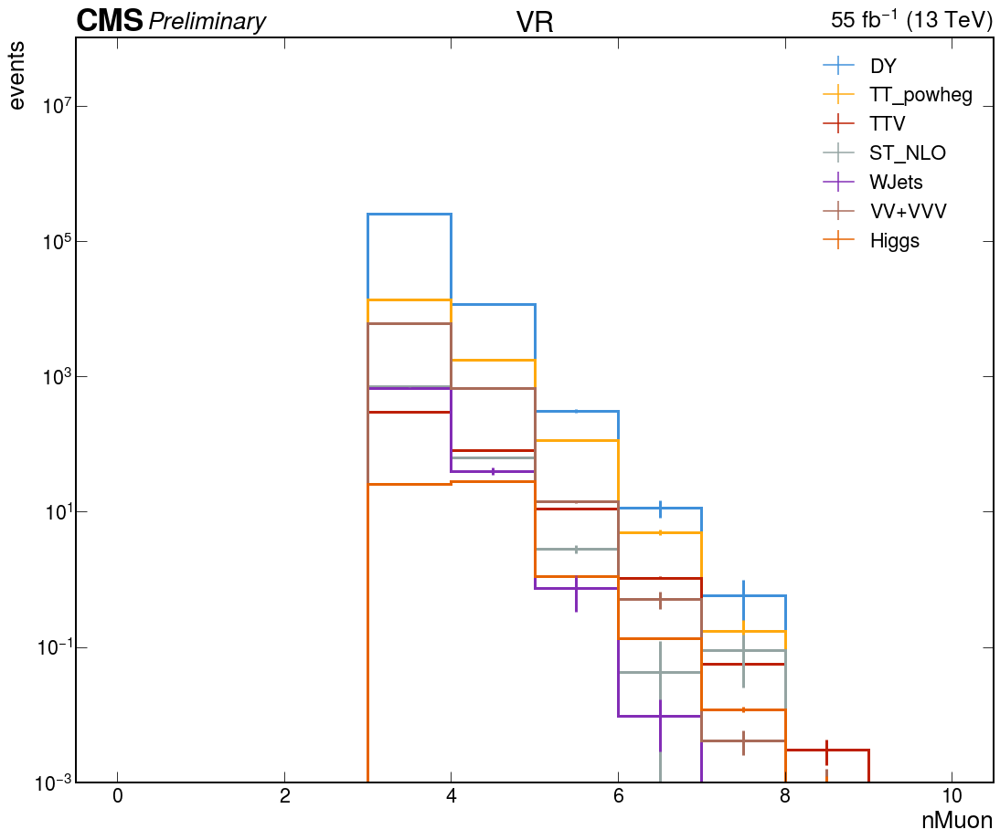

SR_high_temp_tight

DY_2018

52314.714 ± 693.072

2080.460 ± 92.209

6.960 ± 3.724

0.000 ± 0.000

0.000 ± 0.000

TT_powheg_2018

2644.147 ± 9.675

41.062 ± 1.200

0.343 ± 0.109

0.000 ± 0.000

0.000 ± 0.000

TTV_2018

9.729 ± 0.349

0.212 ± 0.067

0.006 ± 0.004

0.000 ± 0.000

0.000 ± 0.000

ST_NLO_2018

190.922 ± 3.355

3.316 ± 0.456

-0.049 ± 0.049

0.000 ± 0.000

0.000 ± 0.000

WJets_2018

6223.800 ± 1160.961

1.039 ± 1.038

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

VV+VVV_2018

3317.710 ± 16.181

483.143 ± 1.166

1.709 ± 0.185

0.041 ± 0.005

0.000 ± 0.000

Higgs_2018

44.682 ± 0.124

9.734 ± 0.058

0.062 ± 0.004

0.003 ± 0.001

0.000 ± 0.000

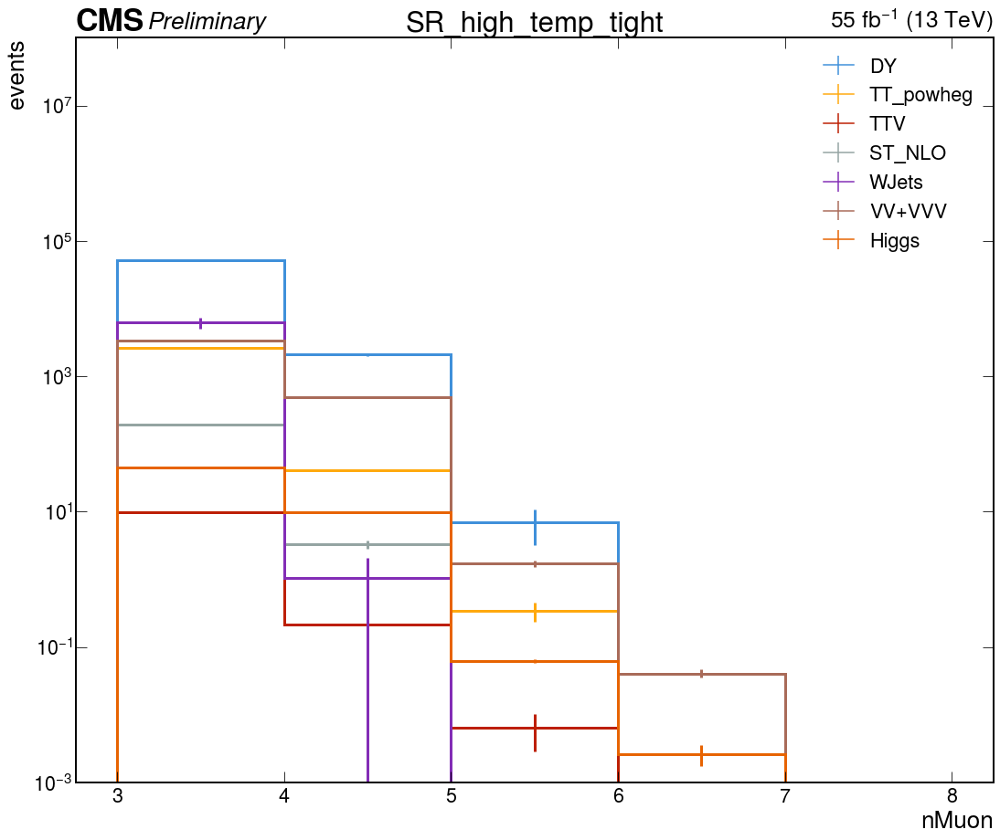

SR_high_temp_loose

DY_2018

286459.057 ± 1522.824

11259.147 ± 260.239

165.589 ± 30.402

3.775 ± 1.468

0.019 ± 0.018

TT_powheg_2018

233426.825 ± 96.645

25613.957 ± 31.854

1382.571 ± 7.371

51.226 ± 1.421

1.877 ± 0.272

TTV_2018

710.365 ± 3.847

111.626 ± 1.395

10.396 ± 0.374

0.667 ± 0.088

0.072 ± 0.046

ST_NLO_2018

13799.398 ± 26.867

1047.030 ± 7.452

38.655 ± 1.441

1.255 ± 0.262

-0.015 ± 0.015

WJets_2018

23646.709 ± 1644.791

785.441 ± 173.663

13.036 ± 2.095

0.686 ± 0.442

0.049 ± 0.049

VV+VVV_2018

7649.518 ± 25.623

1030.726 ± 3.721

15.216 ± 0.546

0.542 ± 0.143

0.007 ± 0.002

Higgs_2018

79.676 ± 0.293

30.686 ± 0.122

1.183 ± 0.020

0.110 ± 0.005

0.008 ± 0.001

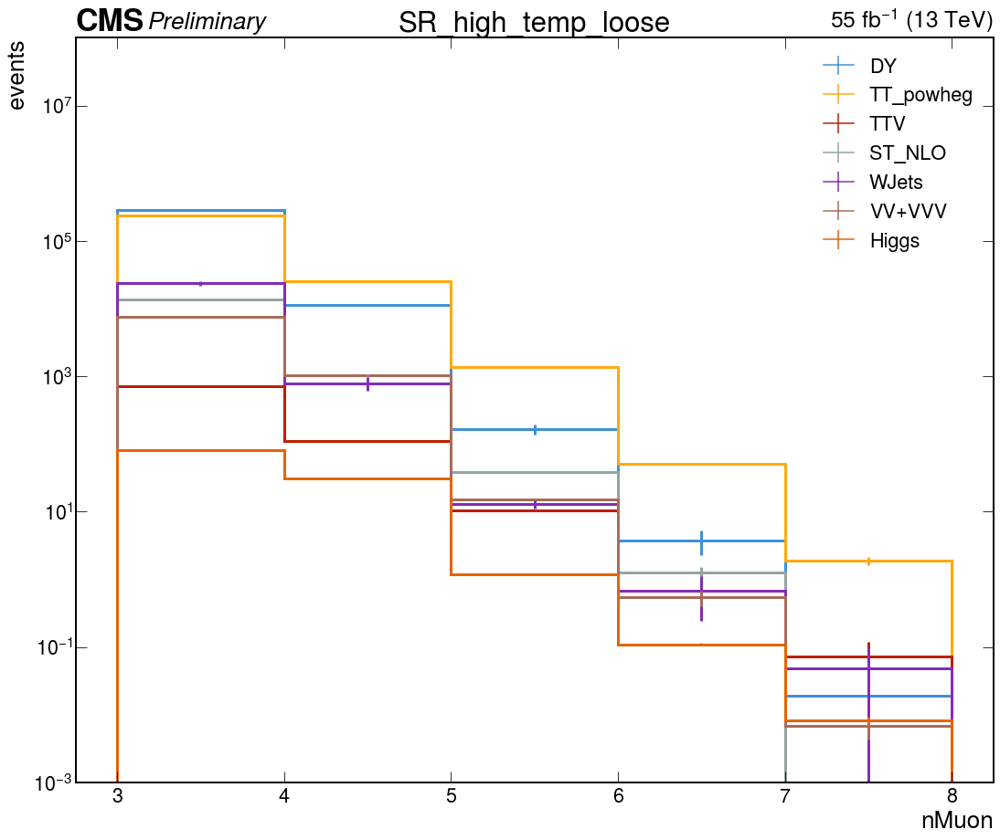

SR_low_temp_tight

DY_2018

2995.105 ± 181.487

62.863 ± 24.630

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

TT_powheg_2018

178.191 ± 2.716

6.782 ± 0.538

0.095 ± 0.055

0.000 ± 0.000

0.000 ± 0.000

TTV_2018

0.688 ± 0.132

0.024 ± 0.009

0.002 ± 0.003

0.000 ± 0.000

0.000 ± 0.000

ST_NLO_2018

6.850 ± 0.606

0.186 ± 0.102

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

WJets_2018

14.503 ± 3.408

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

VV+VVV_2018

74.607 ± 2.626

5.461 ± 0.196

0.034 ± 0.005

0.000 ± 0.000

0.000 ± 0.000

Higgs_2018

0.510 ± 0.014

0.057 ± 0.005

0.001 ± 0.000

0.000 ± 0.000

0.000 ± 0.000

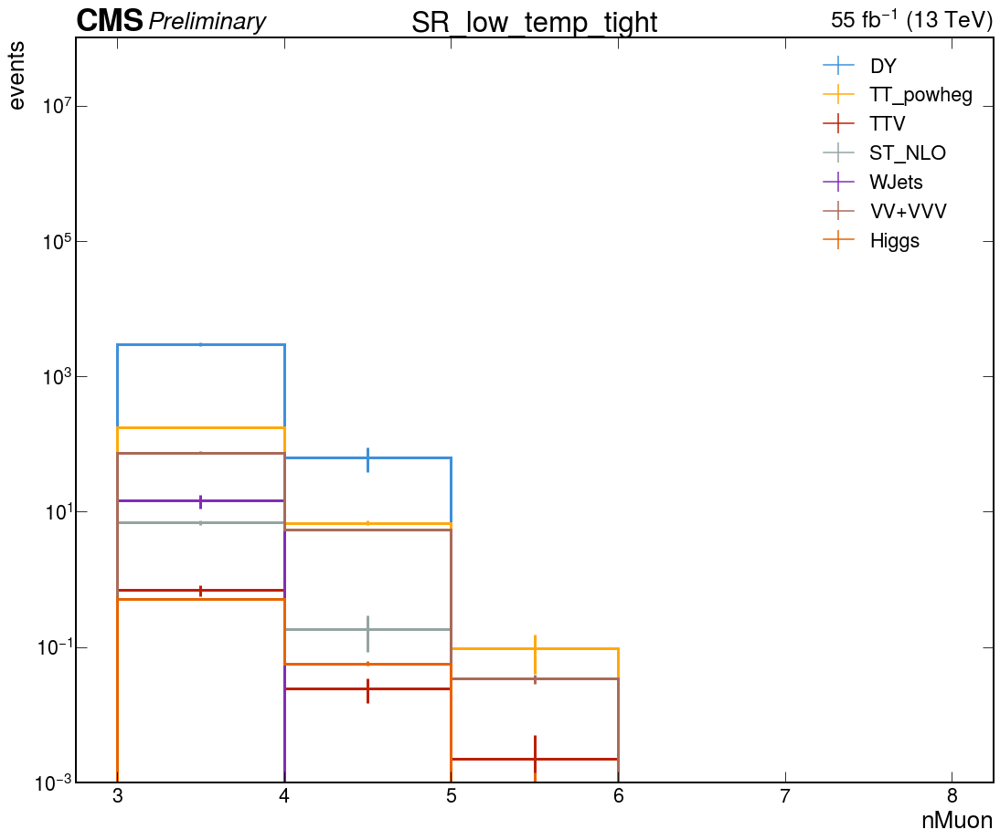

SR_low_temp_loose

DY_2018

290542.658 ± 1529.178

11594.293 ± 263.499

190.482 ± 32.439

4.152 ± 1.497

0.019 ± 0.018

TT_powheg_2018

248455.574 ± 99.941

29739.041 ± 34.464

1755.724 ± 8.361

72.266 ± 1.702

2.881 ± 0.335

TTV_2018

777.241 ± 4.057

136.558 ± 1.583

13.558 ± 0.447

0.959 ± 0.094

0.077 ± 0.046

ST_NLO_2018

14493.085 ± 27.497

1179.352 ± 7.883

48.018 ± 1.590

1.612 ± 0.288

0.025 ± 0.043

WJets_2018

25120.819 ± 1644.997

939.055 ± 173.825

17.834 ± 2.244

1.569 ± 0.631

0.053 ± 0.049

VV+VVV_2018

7787.383 ± 25.867

1050.646 ± 3.959

16.656 ± 0.623

0.637 ± 0.148

0.007 ± 0.002

Higgs_2018

82.039 ± 0.299

31.196 ± 0.125

1.287 ± 0.021

0.125 ± 0.006

0.011 ± 0.001

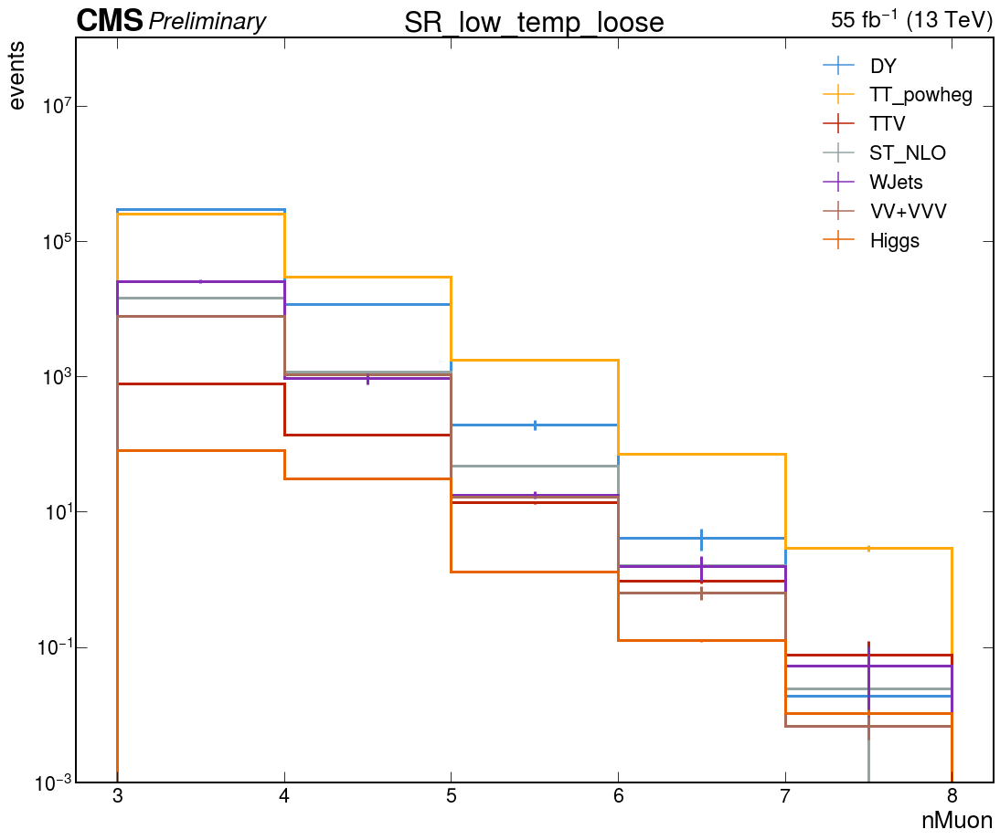

In [44]:
# mc_processes = [
# #     'DY_NJets_LO_2018',
# #     'DY_LHEFilterPtZ_NLO_2018',
# #     'DY_M-50_inclusive_NLO_2018',
# #     'DY_M-10to50_inclusive_NLO_2018',
# #     'DY_M-10to50_inclusive_LO_2018',
# #     'QCD_Pt_MuEnrichedPt5_2018',
# #     'TTW_NLO_2018',
# #     'TTZ_NLO_2018',
# #     'TTZToLLNuNu_M-10_NLO_2018',
# #     'TTZToLL_LO_2018',
# #     'TTZ_inclusive_LO_2018',
# #     'TTTT_NLO_2018',
# #     'ST_NLO_2018',
# #     'ST_tW_powheg_2018',
#     'WJetsToLNu_HT_LO_2018',
#     'WJetsToLNu_Pt_NLO_2018',
#     'WJetsToLNu_inclusive_NLO_2018',
# #     'VV_NLO_2018',
# #     'VVV_NLO_2018',
# #     'Higgs_2018',
# ]

mc_processes = [
    #     'DY_NJets_LO_2018',
    #     'DY_LHEFilterPtZ_NLO_2018',
    #     'DY_M-10to50_inclusive_NLO_2018',
    #     'DY_M-10to50_inclusive_LO_2018',
    #     'DY_M-50_inclusive_NLO_2018',
    #     'DYToMuMu_M-10to50_NLO_2018',
    #     'DYToMuMu_M-50_NLO_2018',
    "DY_2018",
    #     'QCD_Pt_MuEnrichedPt5_2018',
    "TT_powheg_2018",
    #     'TTW_NLO_2018',
    #     'TTZ_NLO_2018',
    "TTV_2018",
    #     'TTZToLLNuNu_M-10_NLO_2018',
    #     'TTZToLL_LO_2018',
    #     'TTZ_inclusive_LO_2018',
    #     'TTTT_NLO_2018',
    #     'ST_s-channel_NLO_2018',
    #     'ST_t-channel_powheg_2018',
    #     'ST_tW_Dilept_NLO_2018',
    "ST_NLO_2018",
    #     'ST_tW_powheg_2018',
    #     'WJetsToLNu_HT_LO_2018',
    #     'WJetsToLNu_Pt_NLO_2018',
    #     'WJetsToLNu_inclusive_NLO_2018',
    "WJets_2018",
    #     'WW_NLO_2018',
    #     'WZ_NLO_2018',
    #     'ZZ_NLO_2018',
    #     'VV_NLO_2018',
    #     'VVV_NLO_2018',
    "VV+VVV_2018",
    "Higgs_2018",
    #     'WH_HToBB_powheg_2018',
    #     'ttH_powheg_2018',
    #     'GluGluHToZZTo4L_2018',
    #     'VBF_HToZZTo4L_2018',
    #     'ZH_HToZZ_4LFilter_2018',
    #     'WH_HToZZTo4L_2018',
    #     'QCD_Pt-15To20_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-20To30_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-30To50_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-50To80_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-80To120_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-120To170_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-170To300_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-300To470_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-470To600_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-600To800_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-800To1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'QCD_Pt-1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8_2018',
    #     'TTZToQQ_TuneCP5_13TeV_amcatnlo-pythia8_2018',
    #     'DYJetsToMuMu_M-10to50_H2ErratumFix_TuneCP5_13TeV-powhegMiNNLO-pythia8-photos_2018',
    #     'DYJetsToMuMu_M-50_massWgtFix_TuneCP5_13TeV-powhegMiNNLO-pythia8-photos_2018',
    #     'DYJetsToLL_M-50_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DY1JetsToLL_M-50_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'DY2JetsToLL_M-50_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'DY3JetsToLL_M-50_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'DY4JetsToLL_M-50_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-0_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-0To50_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-50To100_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-100To250_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-250To400_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-400To650_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_LHEFilterPtZ-650ToInf_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_M-10to50_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'DYJetsToLL_M-10to50_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'WJetsToLNu_Pt-100To250_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'WZTo2Q2L_mllmin4p0_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'WJetsToLNu_Pt-600ToInf_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'ZH_HToZZ_4LFilter_M125_TuneCP5_13TeV_powheg2-minlo-HZJ_JHUGenV7011_pythia8_2018',
    #     'ZZTo2Q2L_mllmin4p0_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'TTZToLLNuNu_M-10_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'WJetsToLNu_HT-1200To2500_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_minloHJJ_JHUGenV7011_pythia8_2018',
    #     'ST_tW_Dilept_5f_DR_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'WWW_4F_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'ST_tW_antitop_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'WZTo1L1Nu2Q_4f_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'TTZToQQ_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'WplusH_HToBB_WToLNu_M-125_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'TTToHadronic_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'ttH_HToZZ_4LFilter_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8_2018',
    #     'WZTo3LNu_mllmin4p0_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'ZZTo4L_TuneCP5_13TeV_powheg_pythia8_2018',
    #     'ST_s-channel_4f_leptonDecays_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'WJetsToLNu_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'WWZ_4F_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'WJetsToLNu_HT-400To600_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'WJetsToLNu_HT-100To200_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'TTZToLL_TuneCP5_13TeV_amcatnlo-pythia8_2018',
    #     'TTTT_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'ttZJets_TuneCP5_13TeV_madgraphMLM_pythia8_2018',
    #     'WJetsToLNu_Pt-250To400_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'ZZZ_TuneCP5_13TeV-amcatnlo-pythia8_2018',
    #     'TTTo2L2Nu_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'ttHTobb_M125_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'GluGluToZH_HToZZTo4L_M125_TuneCP5_13TeV-jhugenv723-pythia8_2018',
    #     'WWTo2L2Nu_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'WWTo1L1Nu2Q_4f_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'WJetsToLNu_HT-800To1200_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'WJetsToLNu_Pt-400To600_MatchEWPDG20_TuneCP5_13TeV-amcatnloFXFX-pythia8_2018',
    #     'ZZTo2L2Nu_TuneCP5_13TeV_powheg_pythia8_2018',
    #     'TTWJetsToLNu_TuneCP5_13TeV-amcatnloFXFX-madspin-pythia8_2018',
    #     'WJetsToLNu_HT-600To800_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'WJetsToLNu_HT-70To100_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'TTWJetsToQQ_TuneCP5_13TeV-amcatnloFXFX-madspin-pythia8_2018',
    #     'ST_tW_top_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'VHToNonbb_M125_TuneCP5_13TeV-amcatnloFXFX_madspin_pythia8_2018',
    #     'WJetsToLNu_HT-2500ToInf_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'TTZToLL_5f_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'WJetsToLNu_HT-200To400_TuneCP5_13TeV-madgraphMLM-pythia8_2018',
    #     'ST_t-channel_antitop_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8_2018',
    #     'WminusH_HToBB_WToLNu_M-125_TuneCP5_13TeV-powheg-pythia8_2018',
    #     'ST_t-channel_top_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8_2018',
    #     'VBF_HToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8_2018',
    #     'WminusH_HToZZTo4L_M125_TuneCP5_13TeV_powheg2-minlo-HWJ_JHUGenV7011_pythia8_2018',
    #     'WplusH_HToZZTo4L_M125_TuneCP5_13TeV_powheg2-minlo-HWJ_JHUGenV7011_pythia8_2018'
]

final_processes = [
    "DY_LHEFilterPtZ_NLO_2018",
    "DY_M-10to50_inclusive_NLO_2018",
    "QCD_Pt_MuEnrichedPt5_2018",
    "TTW_NLO_2018",
    "TTZ_NLO_2018",
    "TTTT_NLO_2018",
    "ST_NLO_2018",
    #     'WJetsToLNu_HT_LO_2018',
    #     'WJetsToLNu_Pt_NLO_2018',
    #     'WJetsToLNu_inclusive_NLO_2018',
    "VV_NLO_2018",
    "VVV_NLO_2018",
    "Higgs_2018",
]

regions = [
    "CR_prompt",
    "CR_light",
    "CR_cb",
    "VR",
    "SR_high_temp_tight",
    "SR_high_temp_loose",
    "SR_low_temp_tight",
    "SR_low_temp_loose",
]
y_limits = [
    (1e0, 1e10),
    (1e-2, 1e13),
    (1e-2, 1e13),
    (1e-2, 1e13),
    (1e-3, 1e12),
    (1e-2, 1e13),
]


for i_r, region in enumerate(regions):
    hists_mc = []
    hist_bkg_total = None

    print(region)
    for process in mc_processes:
        h_mc = plots[process][region]
        print("\t", process)
        for val, err in zip(h_mc.values(), np.sqrt(h_mc.variances())):
            print(f"\t\t{val:.3f} ± {err:.3f}")
        hists_mc.append(h_mc)
        if hist_bkg_total is None:
            hist_bkg_total = h_mc.copy()
        else:
            hist_bkg_total += h_mc.copy()

    # fig, ax = plt.subplots(figsize=(12.5,11))
    fig, ax = plt.subplots(figsize=(18, 15))

    hep.histplot(
        hists_mc,
        yerr=[np.sqrt(h.variances()) for h in hists_mc],
        label=[label.replace("_2018", "") for label in mc_processes],
        lw=3,
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
    plt.title(region)
    plt.gca().xaxis.set_minor_locator(plt.NullLocator())
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    # plt.ylim(1e-4, 1e6)
    plt.ylim(1e-3, 1e8)
    # plt.ylim(0.01*y_limits[i_r][0], 0.01*y_limits[i_r][1])
    plt.yscale("log")
    plt.legend()  # ncol=2)
    plt.xlabel("nMuon")
    plt.ylabel("events")
    plt.show()

## See where signal is

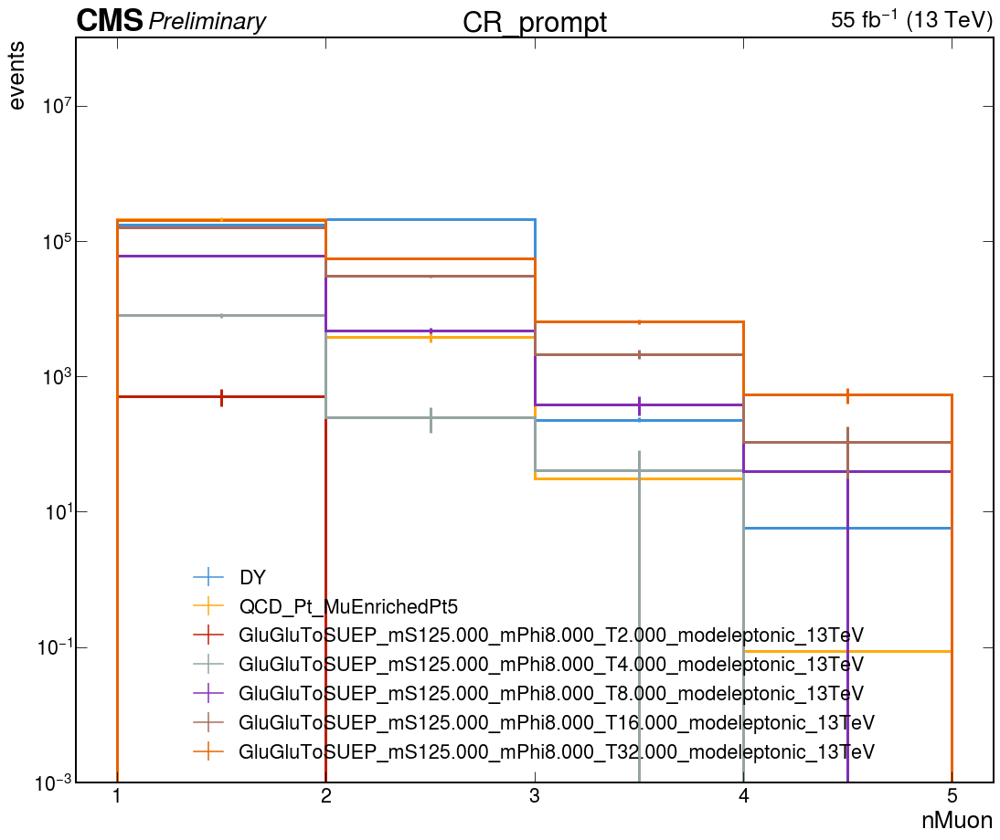

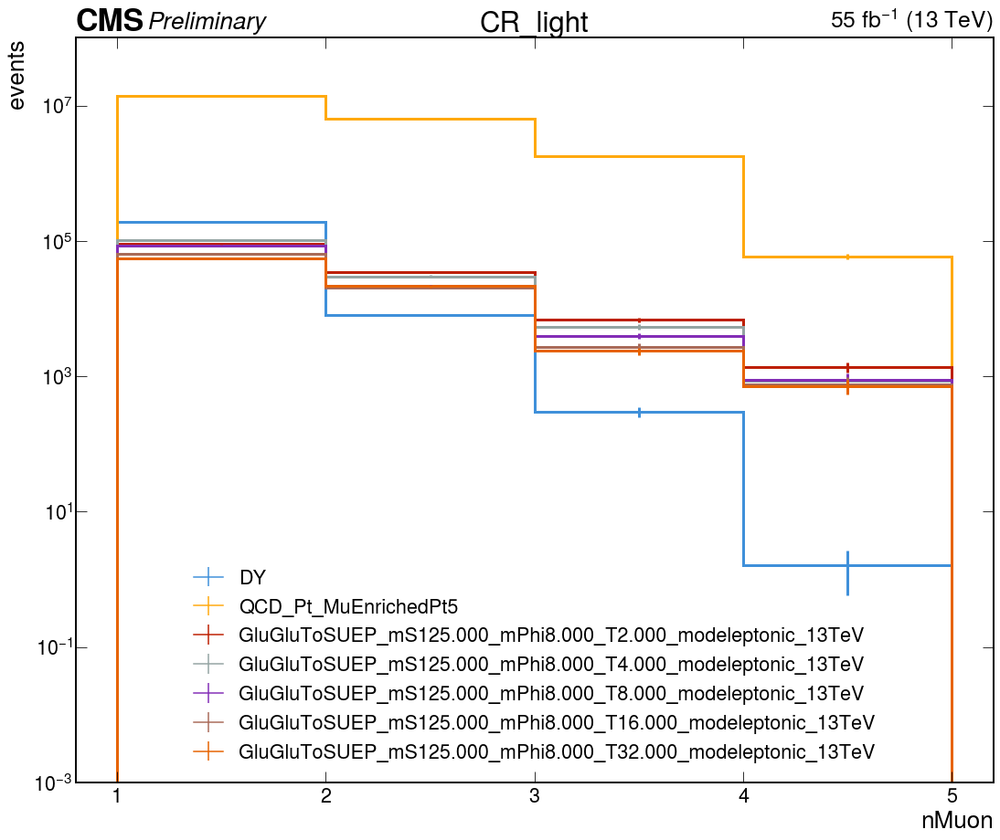

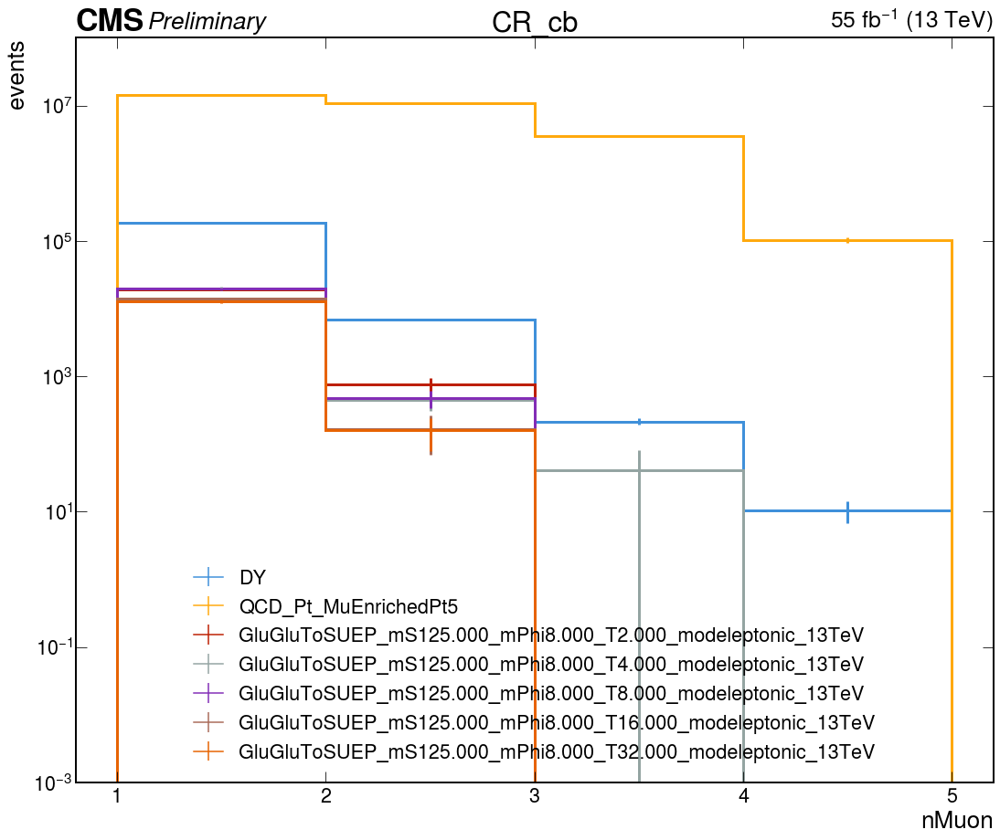

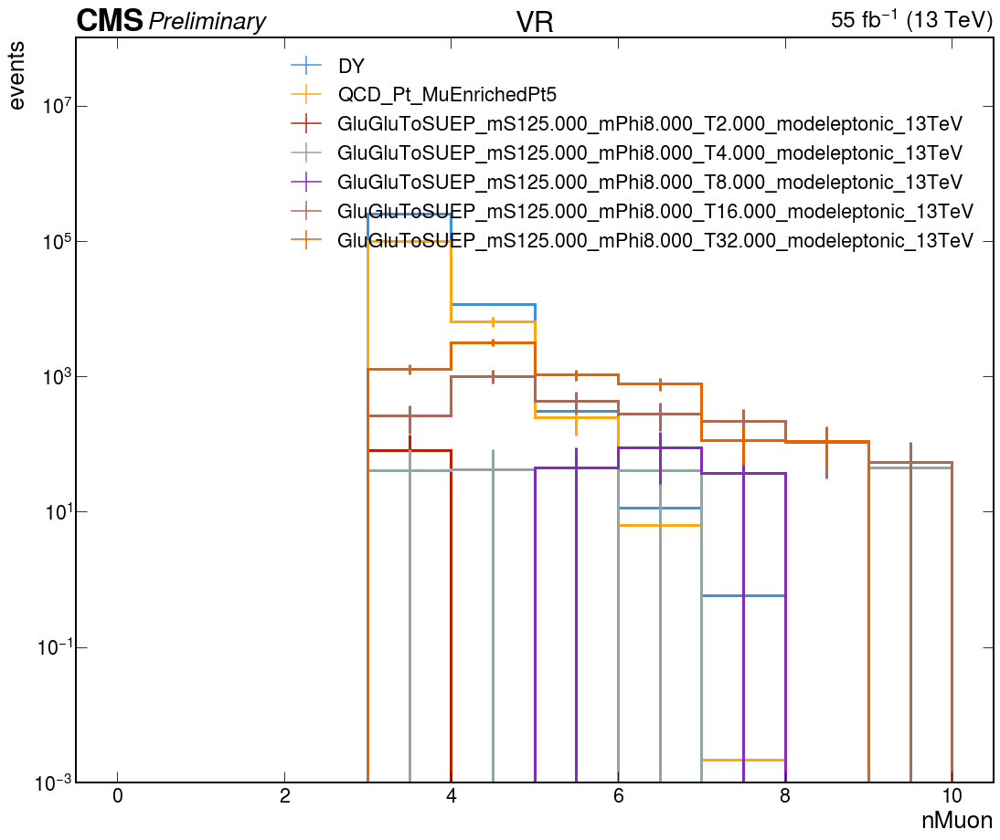

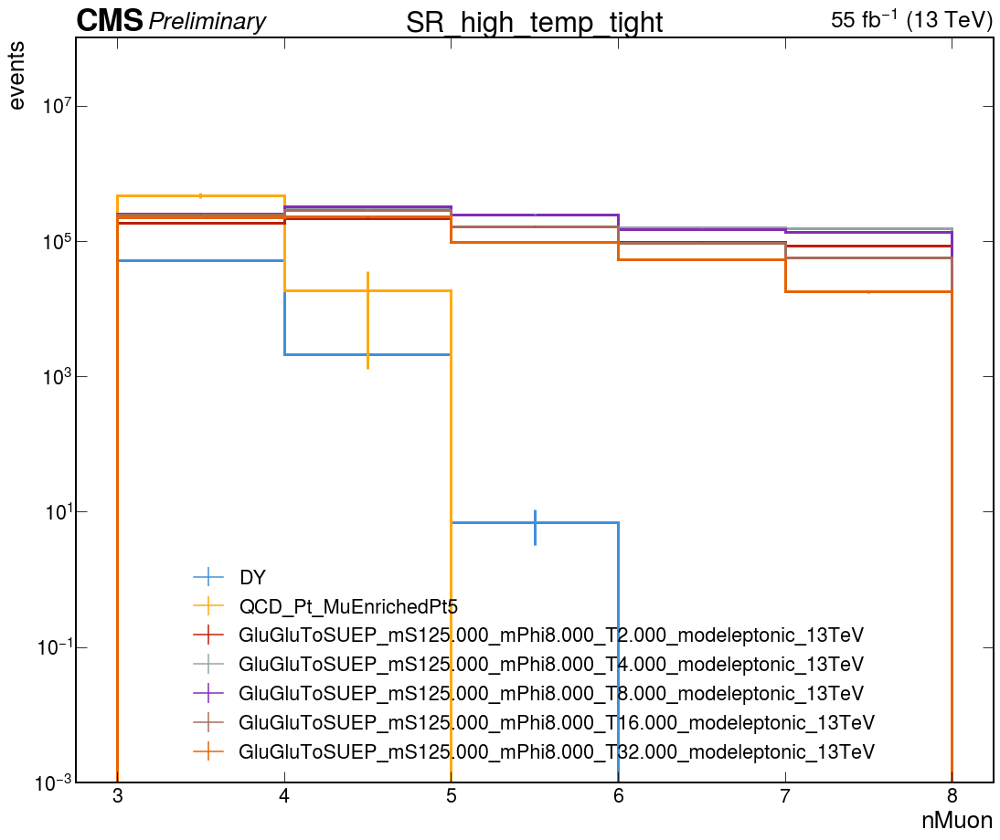

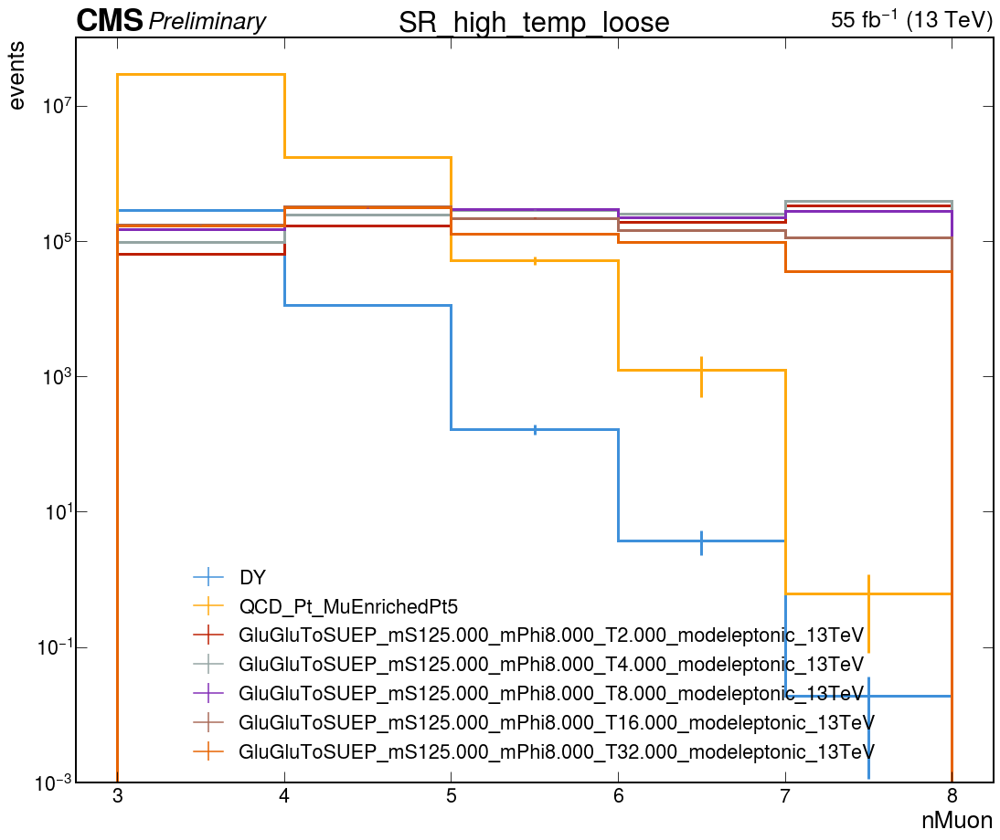

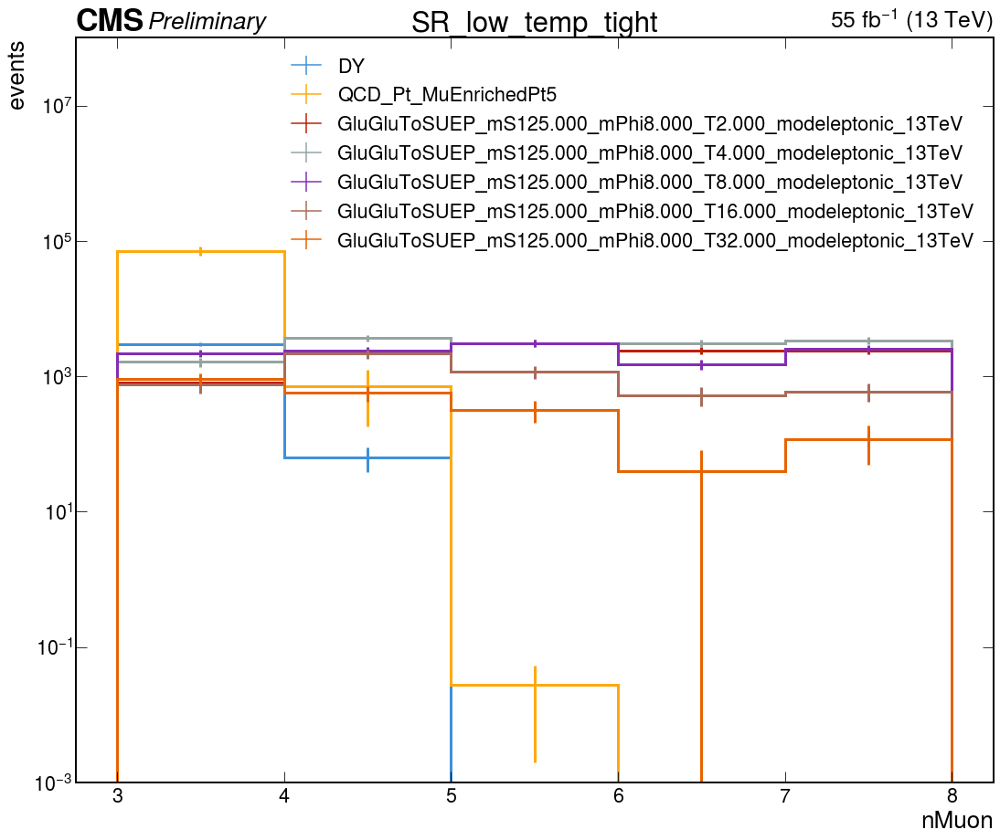

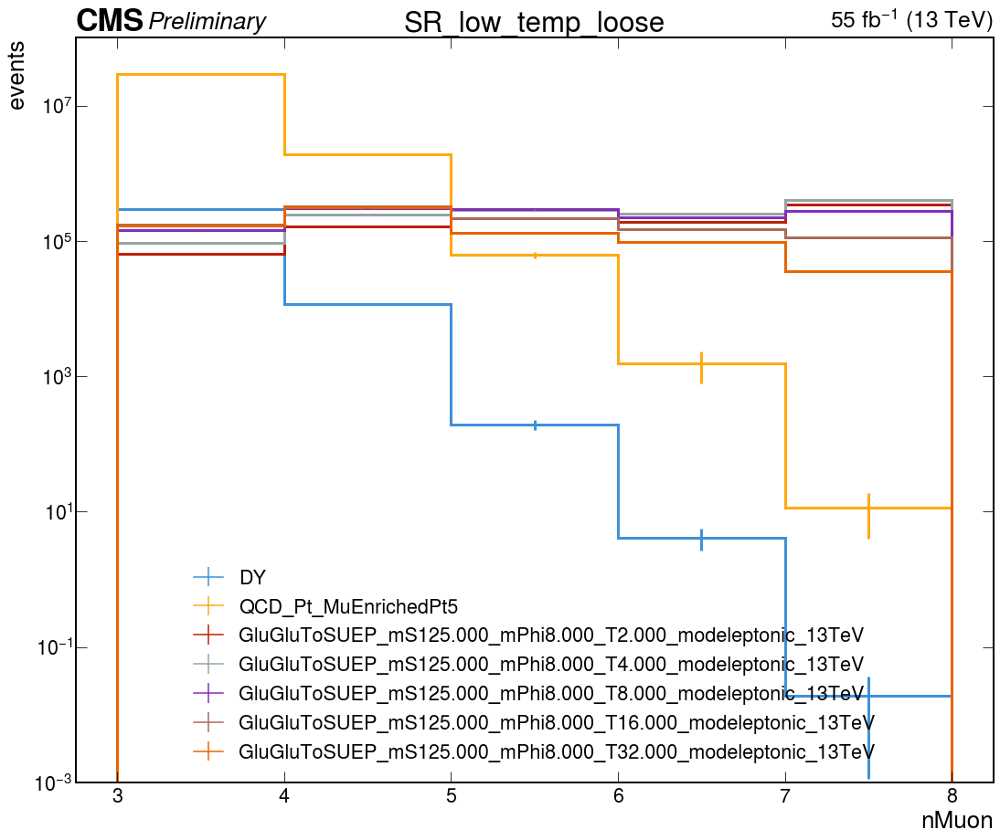

In [26]:
mc_processes = [
    "DY_2018",
    "QCD_Pt_MuEnrichedPt5_2018",
]
decay = "leptonic"
mS = 125
T = 32
mPhi = 8
mc_processes += [
    # f'GluGluToSUEP_mS{mS:.3f}_mPhi{mPhi:.3f}_T{T:.3f}_mode{decay}_13TeV_2018' for decay in ['leptonic', 'hadronic']
    # f'GluGluToSUEP_mS{mS:.3f}_mPhi{mPhi:.3f}_T{T:.3f}_mode{decay}_13TeV_2018' for mPhi, T in [(1, 0.25), (2, 2), (2, 4)]
    # f'GluGluToSUEP_mS{mS:.3f}_mPhi{mPhi:.3f}_T{T:.3f}_mode{decay}_13TeV_2018' for mPhi, T in [(4, 1), (4, 4), (4, 8), (4, 16)]
    f"GluGluToSUEP_mS{mS:.3f}_mPhi{mPhi:.3f}_T{T:.3f}_mode{decay}_13TeV_2018"
    for mPhi, T in [(8, 2), (8, 4), (8, 8), (8, 16), (8, 32)]
    # f'GluGluToSUEP_mS{mS:.3f}_mPhi{mPhi:.3f}_T{T:.3f}_mode{decay}_13TeV_2018' for mS in [125, 200, 300, 400, 500, 600, 800, 1000]
]

regions = [
    "CR_prompt",
    "CR_light",
    "CR_cb",
    "VR",
    "SR_high_temp_tight",
    "SR_high_temp_loose",
    "SR_low_temp_tight",
    "SR_low_temp_loose",
]
y_limits = [
    (1e0, 1e10),
    (1e-2, 1e13),
    (1e-2, 1e13),
    (1e-2, 1e13),
    (1e-3, 1e12),
    (1e-2, 1e13),
]

for i_r, region in enumerate(regions):
    hists_mc = []
    hist_bkg_total = None

    # print(region)
    for process in mc_processes:
        if process not in plots:
            continue
        h_mc = plots[process][region]
        # print("\t", process)
        # for val, err in zip(h_mc.values(), np.sqrt(h_mc.variances())):
        #     print(f"\t\t{val:.3f} ± {err:.3f}")
        hists_mc.append(h_mc)
        if hist_bkg_total is None:
            hist_bkg_total = h_mc.copy()
        else:
            hist_bkg_total += h_mc.copy()

    # fig, ax = plt.subplots(figsize=(12.5,11))
    fig, ax = plt.subplots(figsize=(18, 15))

    hep.histplot(
        hists_mc,
        yerr=[np.sqrt(h.variances()) for h in hists_mc],
        label=[label.replace("_2018", "") for label in mc_processes],
        lw=3,
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
    plt.title(region)
    plt.gca().xaxis.set_minor_locator(plt.NullLocator())
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    # plt.ylim(1e-4, 1e6)
    plt.ylim(1e-3, 1e8)
    # plt.ylim(0.01*y_limits[i_r][0], 0.01*y_limits[i_r][1])
    plt.yscale("log")
    plt.legend()  # ncol=2)
    plt.xlabel("nMuon")
    plt.ylabel("events")
    plt.show()

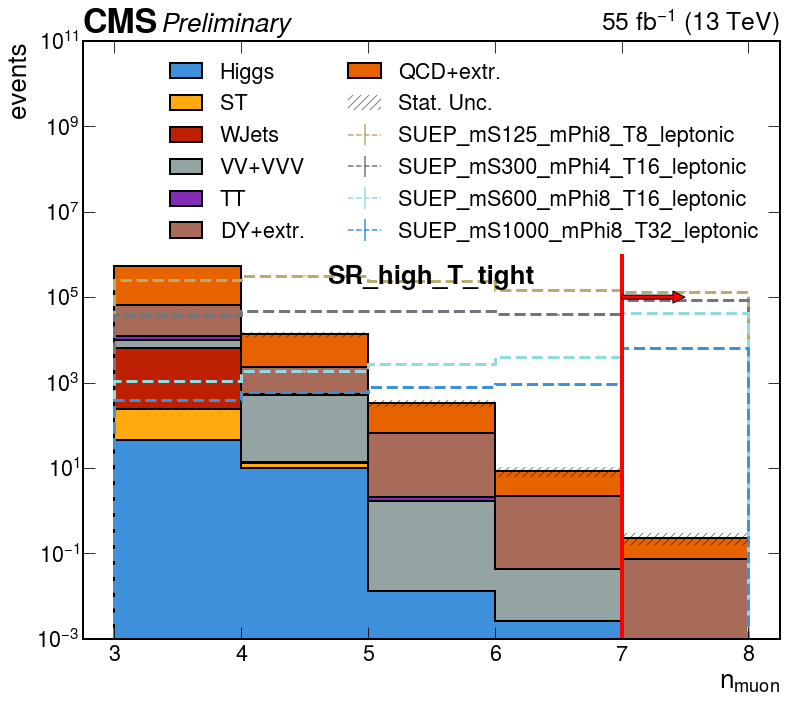

In [45]:
mc_processes = [
    ("Higgs_2018", "Higgs"),
    # ('TTV_2018', 'TTV'),
    ("ST_NLO_2018", "ST"),
    ("WJets_2018", "WJets"),
    ("VV+VVV_2018", "VV+VVV"),
    ("TT_powheg_2018", "TT"),
    ("DY_2018", "DY+extr."),
    # ('DY_2018', 'DY'),
    ("QCD_Pt_MuEnrichedPt5_2018", "QCD+extr."),
    # ('QCD_Pt_MuEnrichedPt5_2018', 'QCD'),
]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T8.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS300.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS600.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS1000.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
]

hists_mc = []
hist_bkg_total = plots[mc_processes[0][0]]["SR_high_temp_tight"].copy().reset()

for process, label in mc_processes:
    h_mc = plots[process][
        "SR_high_temp_tight_extrapolation" if "extr" in label else "SR_high_temp_tight"
    ]
    hists_mc.append(h_mc)
    hist_bkg_total += h_mc.copy()

hists_signal = []
for process in signal_processes:
    h_signal = plots[process]["SR_high_temp_tight"]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12.5, 11))

hep.histplot(
    hists_mc,
    yerr=[np.sqrt(h.variances()) for h in hists_mc],
    stack=True,
    label=[p[1] for p in mc_processes],
    histtype="fill",
    ec="black",
    lw=2,
    ax=ax,
)

x_hatch = np.vstack(
    (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
).reshape((-1,), order="F")
y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
    (-1,), order="F"
)
y_hatch1_unc = np.vstack(
    (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
).reshape((-1,), order="F")
ax.fill_between(
    x=x_hatch,
    y1=y_hatch1 - y_hatch1_unc,
    y2=y_hatch1 + y_hatch1_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="none",
    edgecolor=(0, 0, 0, 0.5),
    linewidth=0,
    hatch="///",
    zorder=2,
)

hep.histplot(
    hists_signal,
    yerr=[np.sqrt(h.variances()) for h in hists_signal],
    label=[
        s.replace("GluGluTo", "")
        .replace(".000", "")
        .replace("mode", "")
        .replace("_13TeV_2018", "")
        for s in signal_processes
    ],
    lw=3,
    ls="--",
    ax=ax,
)

plt.vlines(x=7, color="red", ymin=1e-3, ymax=1e6, lw=4)
plt.annotate(
    "", xy=(7.5, 1e5), xytext=(7, 1e5), arrowprops=dict(facecolor="red", shrink=0)
)


hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.text(5.5, 2e5, "SR_high_T_tight", ha="center", weight="bold")
plt.gca().xaxis.set_minor_locator(plt.NullLocator())
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.ylim(1e-3, 1e11)
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel(r"$n_{muon}$")
plt.ylabel("events")
plt.show()

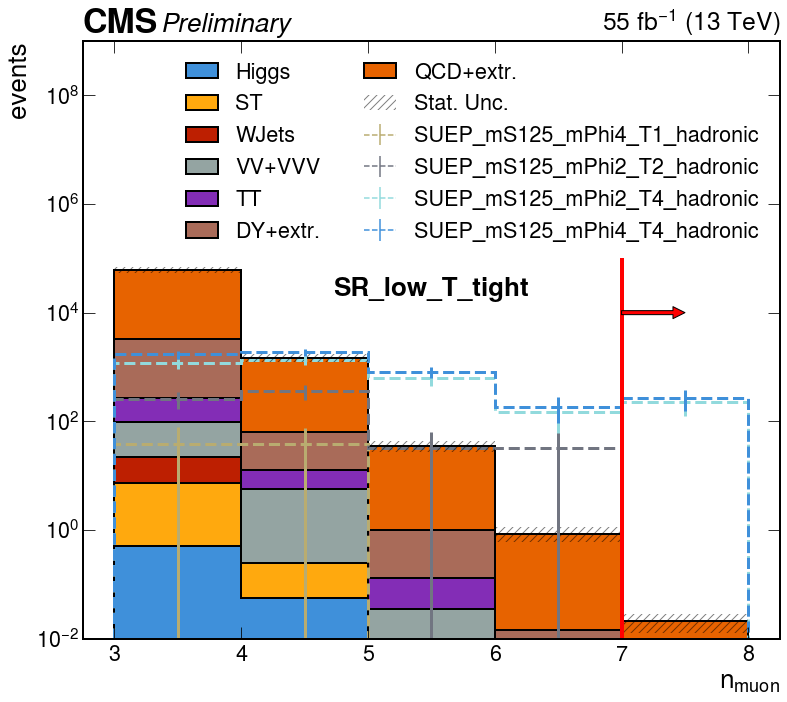

In [104]:
mc_processes = [
    ("Higgs_2018", "Higgs"),
    # ('TTV_2018', 'TTV'),
    ("ST_NLO_2018", "ST"),
    ("WJets_2018", "WJets"),
    ("VV+VVV_2018", "VV+VVV"),
    ("TT_powheg_2018", "TT"),
    ("DY_2018", "DY+extr."),
    # ('DY_2018', 'DY'),
    ("QCD_Pt_MuEnrichedPt5_2018", "QCD+extr."),
    # ('QCD_Pt_MuEnrichedPt5_2018', 'QCD'),
]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi4.000_T1.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi2.000_T4.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi4.000_T4.000_modehadronic_13TeV_2018",
]

hists_mc = []
hist_bkg_total = plots[mc_processes[0][0]]["SR_low_temp_tight"][:8j].copy().reset()

for process, label in mc_processes:
    h_mc = plots[process][
        "SR_low_temp_tight_extrapolation" if "extr" in label else "SR_low_temp_tight"
    ][:8j]
    hists_mc.append(h_mc)
    hist_bkg_total += h_mc.copy()

hists_signal = []
for process in signal_processes:
    h_signal = plots[process]["SR_low_temp_tight"][:8j]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12.5, 11))

hep.histplot(
    hists_mc,
    yerr=[np.sqrt(h.variances()) for h in hists_mc],
    stack=True,
    label=[p[1] for p in mc_processes],
    histtype="fill",
    ec="black",
    lw=2,
    ax=ax,
)

x_hatch = np.vstack(
    (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
).reshape((-1,), order="F")
y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
    (-1,), order="F"
)
y_hatch1_unc = np.vstack(
    (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
).reshape((-1,), order="F")
ax.fill_between(
    x=x_hatch,
    y1=y_hatch1 - y_hatch1_unc,
    y2=y_hatch1 + y_hatch1_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="none",
    edgecolor=(0, 0, 0, 0.5),
    linewidth=0,
    hatch="///",
    zorder=2,
)

hep.histplot(
    hists_signal,
    yerr=[np.sqrt(h.variances()) for h in hists_signal],
    label=[
        s.replace("GluGluTo", "")
        .replace(".000", "")
        .replace("mode", "")
        .replace("_13TeV_2018", "")
        for s in signal_processes
    ],
    lw=3,
    ls="--",
    ax=ax,
)

plt.vlines(x=7, color="red", ymin=1e-3, ymax=1e5, lw=4)
plt.annotate(
    "", xy=(7.5, 1e4), xytext=(7, 1e4), arrowprops=dict(facecolor="red", shrink=0)
)


hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.text(5.5, 2e4, "SR_low_T_tight", ha="center", weight="bold")
plt.gca().xaxis.set_minor_locator(plt.NullLocator())
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.ylim(1e-2, 1e9)
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel(r"$n_{muon}$")
plt.ylabel("events")
plt.show()

## Validation

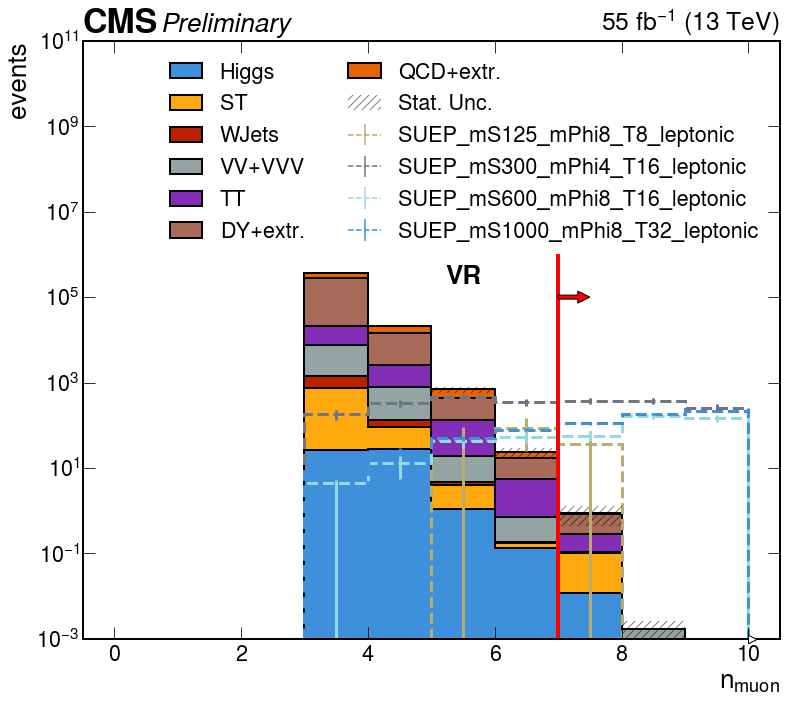

In [47]:
mc_processes = [
    ("Higgs_2018", "Higgs"),
    # ('TTV_2018', 'TTV'),
    ("ST_NLO_2018", "ST"),
    ("WJets_2018", "WJets"),
    ("VV+VVV_2018", "VV+VVV"),
    ("TT_powheg_2018", "TT"),
    ("DY_2018", "DY+extr."),
    # ('DY_2018', 'DY'),
    ("QCD_Pt_MuEnrichedPt5_2018", "QCD+extr."),
    # ('QCD_Pt_MuEnrichedPt5_2018', 'QCD'),
]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T8.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS300.000_mPhi4.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS600.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS1000.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
]

hists_mc = []
hist_bkg_total = plots[mc_processes[0][0]]["VR"].copy().reset()

for process, label in mc_processes:
    h_mc = plots[process]["VR"]
    hists_mc.append(h_mc)
    hist_bkg_total += h_mc.copy()

hists_signal = []
for process in signal_processes:
    h_signal = plots[process]["VR"]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12.5, 11))

hep.histplot(
    hists_mc,
    yerr=[np.sqrt(h.variances()) for h in hists_mc],
    stack=True,
    label=[p[1] for p in mc_processes],
    histtype="fill",
    ec="black",
    lw=2,
    ax=ax,
)

x_hatch = np.vstack(
    (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
).reshape((-1,), order="F")
y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
    (-1,), order="F"
)
y_hatch1_unc = np.vstack(
    (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
).reshape((-1,), order="F")
ax.fill_between(
    x=x_hatch,
    y1=y_hatch1 - y_hatch1_unc,
    y2=y_hatch1 + y_hatch1_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="none",
    edgecolor=(0, 0, 0, 0.5),
    linewidth=0,
    hatch="///",
    zorder=2,
)

hep.histplot(
    hists_signal,
    yerr=[np.sqrt(h.variances()) for h in hists_signal],
    label=[
        s.replace("GluGluTo", "")
        .replace(".000", "")
        .replace("mode", "")
        .replace("_13TeV_2018", "")
        for s in signal_processes
    ],
    lw=3,
    ls="--",
    ax=ax,
)

plt.vlines(x=7, color="red", ymin=1e-3, ymax=1e6, lw=4)
plt.annotate(
    "", xy=(7.5, 1e5), xytext=(7, 1e5), arrowprops=dict(facecolor="red", shrink=0)
)


hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.text(5.5, 2e5, "VR", ha="center", weight="bold")
plt.gca().xaxis.set_minor_locator(plt.NullLocator())
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.ylim(1e-3, 1e11)
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel(r"$n_{muon}$")
plt.ylabel("events")
plt.show()

In [8]:
data = "DoubleMuon+Run2018A-UL2018_MiniAODv2-v1+MINIAOD_2018"
regions = ["CR_prompt", "CR_light", "CR_cb", "SR_high_temp_tight", "SR_high_temp_loose"]
y_limits = [
    (1e0, 1e10),
    (1e-2, 1e13),
    (1e-2, 1e13),
    (1e-3, 1e12),
    (1e-2, 1e13),
]
mc_processes = [
    "VVV_NLO_2018",
    "TTZ_inclusive_LO_2018",
    "VV_NLO_2018",
    "WJetsToLNu_2018",
    "ST_NLO_2018",
    "TT_powheg_2018",
    "DY_inclusive_NLO_2018",
    "QCD_Pt_MuEnrichedPt5_2018",
]
mc_labels = [
    "VVV",
    "TTZ",
    "VV",
    "WJetsToLNu",
    "ST",
    "TT",
    "DY",
    "QCD",
]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]

for i_r, region in enumerate(regions):
    hists_mc = []
    hist_bkg_total = None

    for process in mc_processes:
        h_mc = plots[process][region]
        print(process, h_mc.values())
        hists_mc.append(h_mc)
        if hist_bkg_total is None:
            hist_bkg_total = h_mc.copy()
        else:
            hist_bkg_total += h_mc.copy()

    hists_signal = []
    for process in signal_processes:
        h_signal = plots[process][region]
        hists_signal.append(h_signal)

    fig, ax = plt.subplots(figsize=(12.5, 11))

    hep.histplot(
        hists_mc,
        yerr=[np.sqrt(h.variances()) for h in hists_mc],
        stack=True,
        label=mc_labels,
        histtype="fill",
        ec="black",
        lw=2,
        ax=ax,
    )

    x_hatch = np.vstack(
        (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
    ).reshape((-1,), order="F")
    y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
        (-1,), order="F"
    )
    y_hatch1_unc = np.vstack(
        (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
    ).reshape((-1,), order="F")
    ax.fill_between(
        x=x_hatch,
        y1=y_hatch1 - y_hatch1_unc,
        y2=y_hatch1 + y_hatch1_unc,
        label="Stat. Unc.",
        step="pre",
        facecolor="none",
        edgecolor=(0, 0, 0, 0.5),
        linewidth=0,
        hatch="///",
        zorder=2,
    )

    hep.histplot(
        hists_signal,
        yerr=[np.sqrt(h.variances()) for h in hists_signal],
        label=signal_labels,
        lw=3,
        ls="--",
        ax=ax,
    )

    h_data = plots[data][region]
    hep.histplot(
        h_data,
        label=["Data"],
        histtype="errorbar",
        mec="black",
        mfc="black",
        ecolor="black",
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=0.56, ax=ax)
    # hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
    plt.title(region)
    plt.gca().xaxis.set_minor_locator(plt.NullLocator())
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.ylim(0.01 * y_limits[i_r][0], 0.01 * y_limits[i_r][1])
    plt.yscale("log")
    plt.legend(ncol=2)
    plt.xlabel("nMuon")
    plt.ylabel("events")
    plt.show()

VVV_NLO_2018 [26.33158929 38.20196582 22.15417092  1.18475816]

TTZ_inclusive_LO_2018 [282.84254114 227.5074518   72.47213128   2.46884007]

VV_NLO_2018 [4858.67192143 5291.26571607 2071.16037708  152.25965343]

KeyError: 'WJetsToLNu_2018'

In [ ]:
data = "DoubleMuon+Run2018A-UL2018_MiniAODv2-v1+MINIAOD_2018"
regions = ["CR_prompt", "CR_light", "CR_cb", "SR_high_temp_tight", "SR_high_temp_loose"]
y_limits = [
    (1e0, 1e10),
    (1e-2, 1e13),
    (1e-2, 1e13),
    (1e-3, 1e12),
    (1e-2, 1e13),
]
mc_processes = [
    "VVV_NLO_2018",
    "TTZ_inclusive_LO_2018",
    "VV_NLO_2018",
    "WJetsToLNu_2018",
    "ST_NLO_2018",
    "TT_powheg_2018",
    "DY_inclusive_NLO_2018",
    "QCD_Pt_MuEnrichedPt5_2018",
]
mc_labels = [
    "VVV",
    "TTZ",
    "VV",
    "WJetsToLNu",
    "ST",
    "TT",
    "DY",
    "QCD",
]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]

for i_r, region in enumerate(regions):
    hists_mc = []
    hist_bkg_total = None

    for process in mc_processes:
        h_mc = plots[process][region]
        print(process, h_mc.values())
        hists_mc.append(h_mc)
        if hist_bkg_total is None:
            hist_bkg_total = h_mc.copy()
        else:
            hist_bkg_total += h_mc.copy()

    hists_signal = []
    for process in signal_processes:
        h_signal = plots[process][region]
        hists_signal.append(h_signal)

    fig, ax = plt.subplots(figsize=(12.5, 11))

    hep.histplot(
        hists_mc,
        yerr=[np.sqrt(h.variances()) for h in hists_mc],
        stack=True,
        label=mc_labels,
        histtype="fill",
        ec="black",
        lw=2,
        ax=ax,
    )

    x_hatch = np.vstack(
        (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
    ).reshape((-1,), order="F")
    y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
        (-1,), order="F"
    )
    y_hatch1_unc = np.vstack(
        (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
    ).reshape((-1,), order="F")
    ax.fill_between(
        x=x_hatch,
        y1=y_hatch1 - y_hatch1_unc,
        y2=y_hatch1 + y_hatch1_unc,
        label="Stat. Unc.",
        step="pre",
        facecolor="none",
        edgecolor=(0, 0, 0, 0.5),
        linewidth=0,
        hatch="///",
        zorder=2,
    )

    hep.histplot(
        hists_signal,
        yerr=[np.sqrt(h.variances()) for h in hists_signal],
        label=signal_labels,
        lw=3,
        ls="--",
        ax=ax,
    )

    h_data = plots[data][region]
    hep.histplot(
        h_data,
        label=["Data"],
        histtype="errorbar",
        mec="black",
        mfc="black",
        ecolor="black",
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=0.56, ax=ax)
    # hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
    plt.title(region)
    plt.gca().xaxis.set_minor_locator(plt.NullLocator())
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.ylim(0.01 * y_limits[i_r][0], 0.01 * y_limits[i_r][1])
    plt.yscale("log")
    plt.legend(ncol=2)
    plt.xlabel("nMuon")
    plt.ylabel("events")
    plt.show()

In [75]:
def export_histograms_to_root(plots, output_filename):
    """
    Export hist.Hist histograms to a ROOT file, organized in TDirectories by region.
    Negative bin entries are set to zero.

    Parameters:
    -----------
    plots : dict
        Nested dictionary containing hist.Hist objects
    output_filename : str
        Name of the output ROOT file
    """
    with uproot.recreate(output_filename) as f:
        for sample_name, regions in plots.items():
            for region_name, histogram in regions.items():
                # Create a copy to avoid modifying the original
                hist_copy = histogram.copy()

                # Set negative values to zero
                mask = hist_copy.values() < 0
                if mask.any():
                    hist_copy.view().value[mask] = 0
                    # hist_copy.view().variance[mask] = 0  # Also set corresponding variances to zero

                # Create the full path including directory
                path = f"{region_name}/{sample_name}"
                f[path] = hist_copy

In [76]:
export_histograms_to_root(plots, "test.root")

In [11]:
31570.26232383 / 28**3

1.4381497049849672

In [112]:
np.sqrt(60827649.31823292) / 28**3

0.35528463235451935

In [18]:
print(0.1484 + 0.1375)
print(np.sqrt(0.2394**2 + 0.0366**2))

0.28590000000000004

0.24218158476647228

In [106]:
B

27.975692090018423

In [91]:
var_B

3.8488882765894243

WeightedSum(value=0.337482, variance=0.00448377)

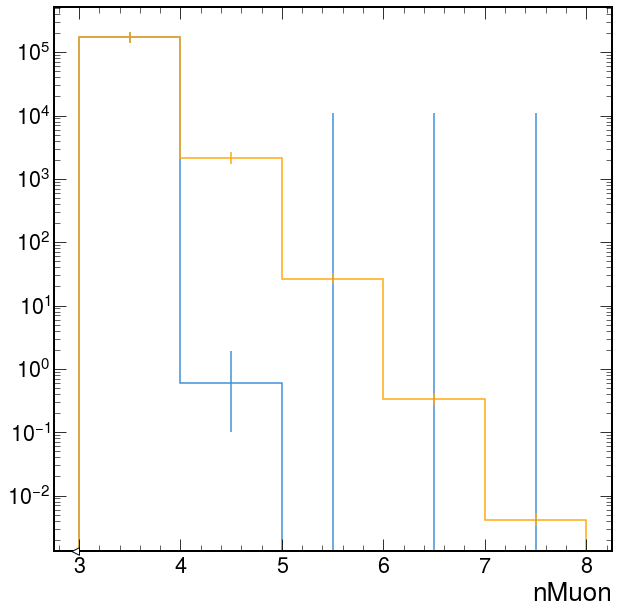

In [95]:
B_custom = 80
plots["QCD_Pt_MuEnriched_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
][0.007j, 0.8j, 0.1j, 30j, :].plot()
pred_new(
    plots["QCD_Pt_MuEnriched_2018"][
        "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
    ][0.007j, 0.8j, 0.1j, 30j, :],
    B_custom,
    var_B,
).plot()
plt.yscale("log")

print(
    pred_new(
        plots["QCD_Pt_MuEnriched_2018"][
            "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
        ][0.007j, 0.8j, 0.1j, 30j, :],
        B_custom,
        var_B,
    )[6j::sum]
)

## Plot overlay of bkgs for nMuon distribution

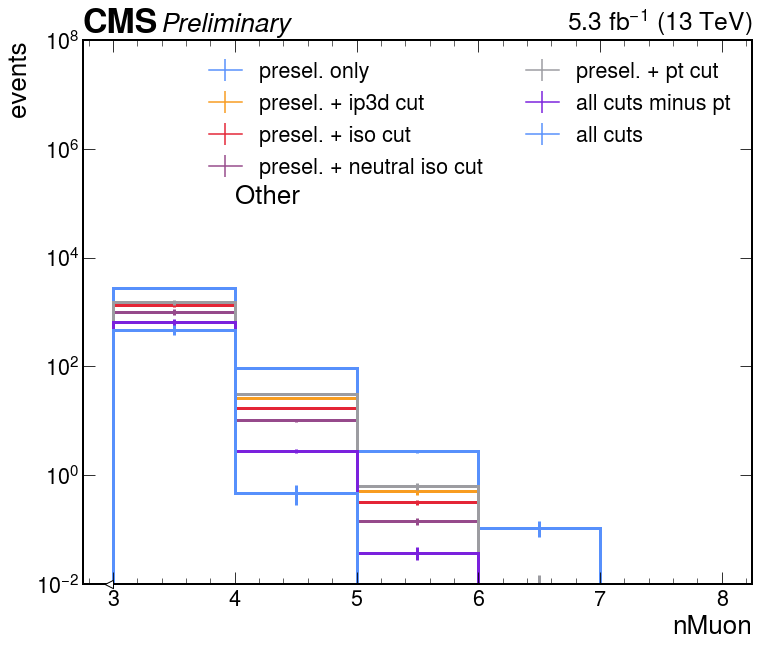

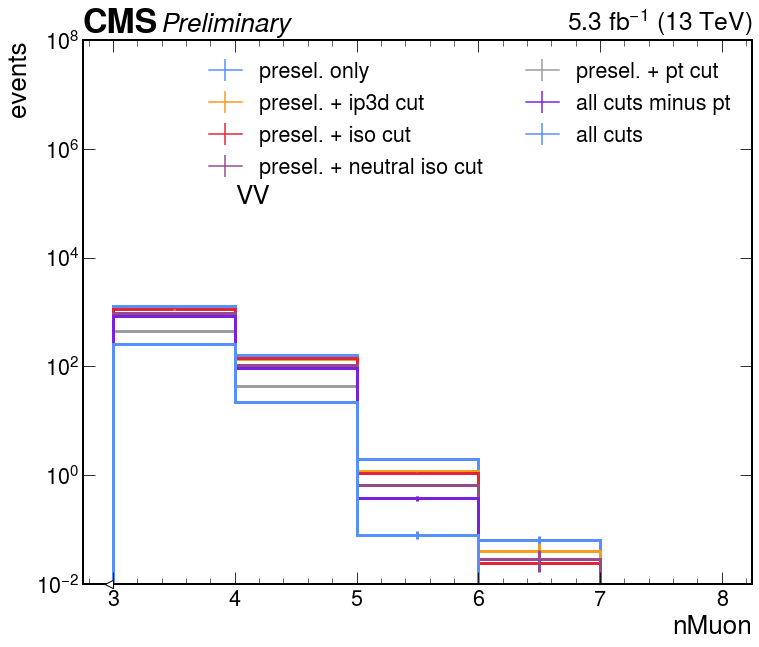

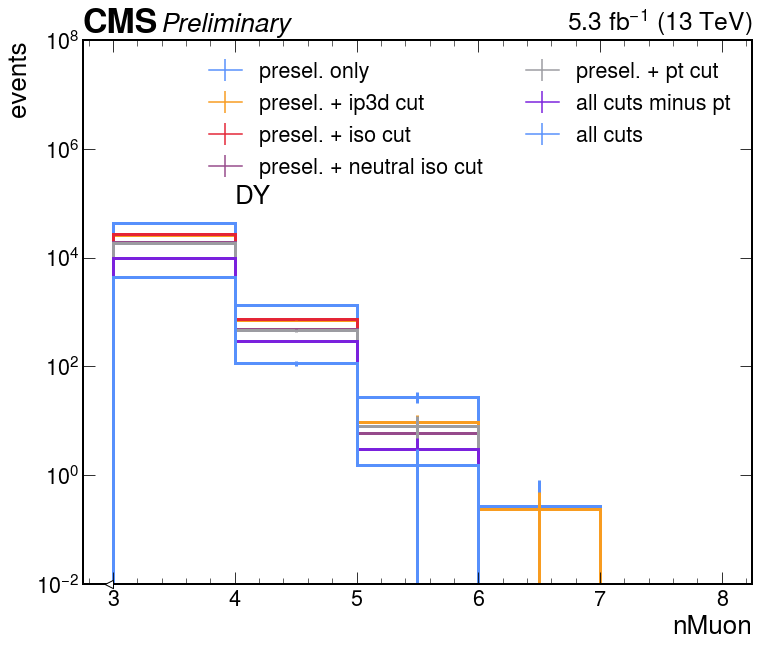

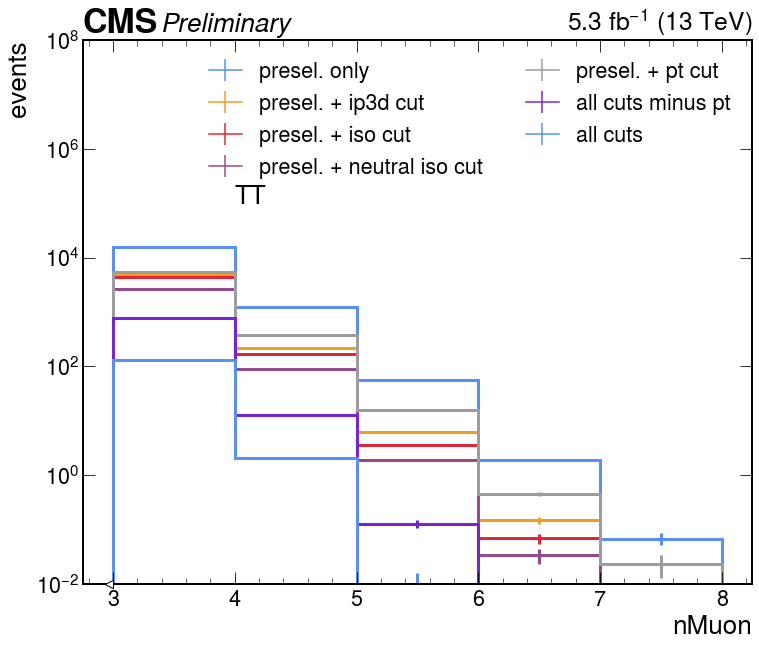

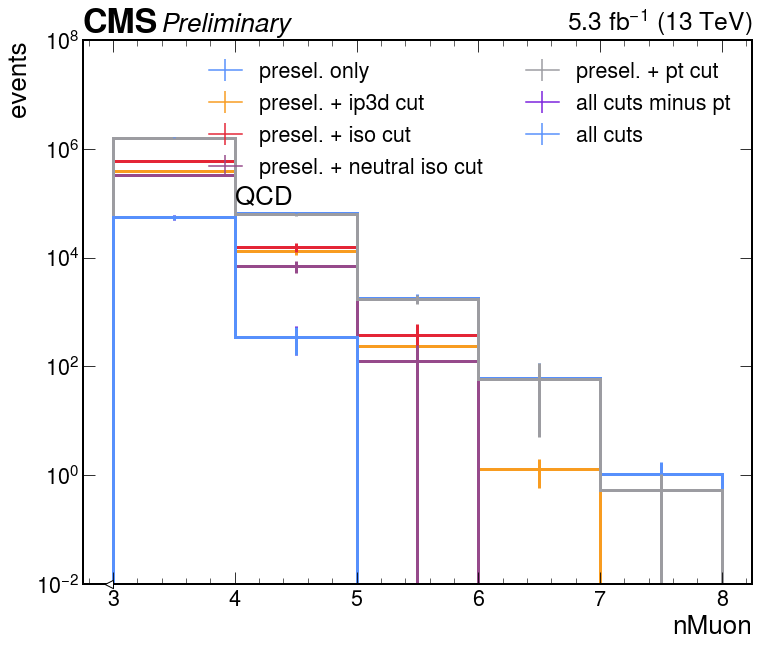

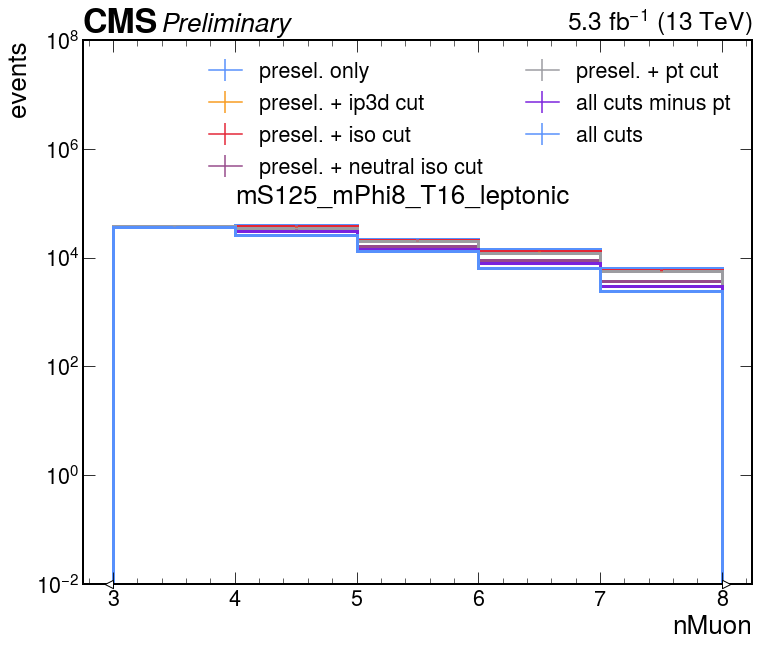

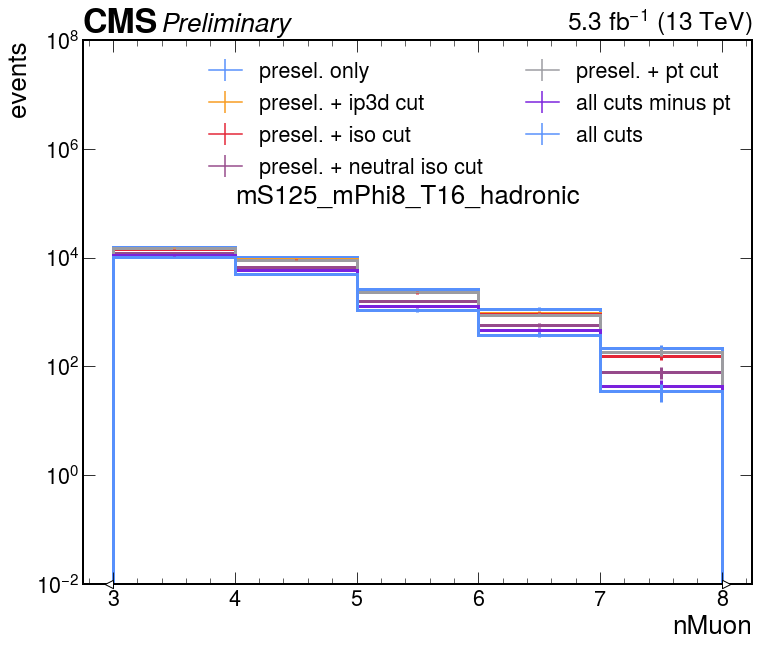

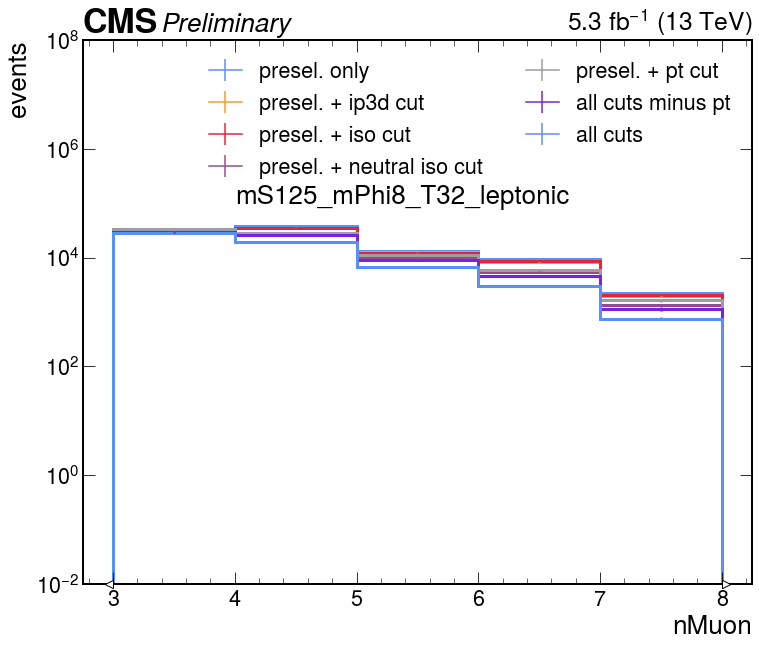

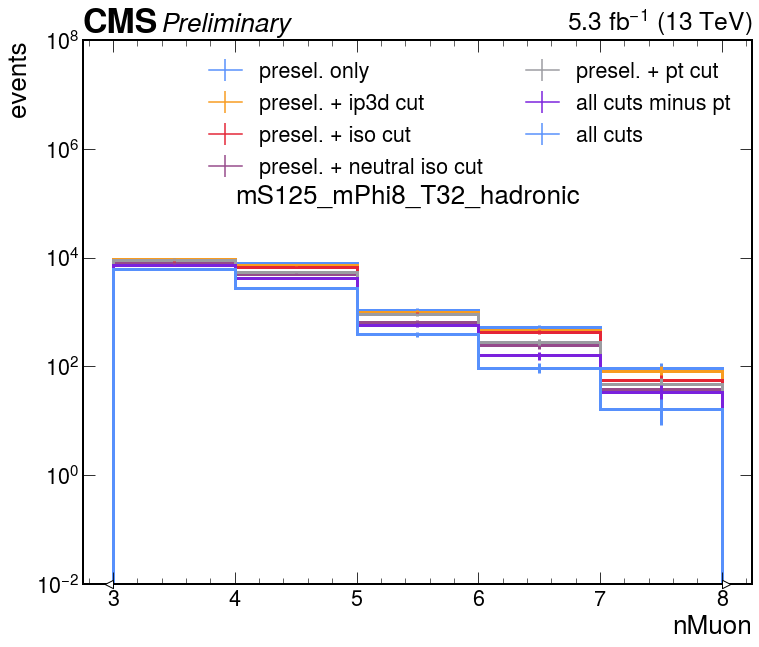

In [106]:
processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
proc_labels = [
    "Other",
    "VV",
    "DY",
    "TT",
    "QCD",
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]

for process, proc_label in zip(processes, proc_labels):
    slices = [
        (0, 0, 0, 0, slice(None)),
        (1, 0, 0, 0, slice(None)),
        (0, 1, 0, 0, slice(None)),
        (0, 0, 1, 0, slice(None)),
        (0, 0, 0, 1, slice(None)),
        (1, 1, 1, 0, slice(None)),
        (1, 1, 1, 1, slice(None)),
    ]
    labels = [
        "presel. only",
        "presel. + ip3d cut",
        "presel. + iso cut",
        "presel. + neutral iso cut",
        "presel. + pt cut",
        "all cuts minus pt",
        "all cuts",
    ]

    hist_name = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"

    hists_mc = []
    for slc, label in zip(slices, labels):
        h_mc = plots[process][hist_name][slc]
        hists_mc.append(h_mc)
    #         print(label)
    #         print(h_mc.values())
    #         print(np.sqrt(h_mc.variances()))

    fig, ax = plt.subplots(figsize=(12, 10))

    hep.histplot(
        hists_mc,
        yerr=[np.sqrt(h.variances()) for h in hists_mc],
        label=labels,
        lw=3,
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
    plt.text(4, 1e5, proc_label)
    plt.ylim(1e-2, 1e8)
    plt.yscale("log")
    plt.legend(ncol=2)
    plt.xlabel("nMuon")
    plt.ylabel("events")
    plt.show()

In [ ]:
data = "DoubleMuon+Run2018A-UL2018_MiniAODv2-v1+MINIAOD_histograms_2018"
mc_process = "DY_2018"
mc_labels = [
    "DY",
]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]

hist_name = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_nMuon"
slc = (0, 0, 0, slice(None))

hists_mc = []

for process in mc_processes:
    h_mc = plots[process][hist_name][slc]
    hists_mc.append(h_mc)
    print(process, h_mc.values())

fig, ax = plt.subplots(figsize=(12, 10))

hep.histplot(
    hists_mc,
    yerr=[np.sqrt(h.variances()) for h in hists_mc],
    label=mc_labels,
    lw=3,
    ax=ax,
)

hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
plt.ylim(1e-2, 1e6)
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("nMuon")
plt.ylabel("events")
plt.show()

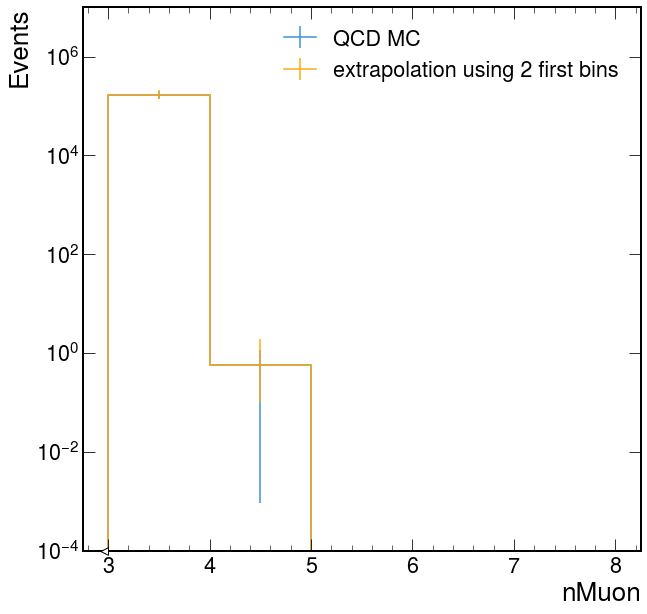

0.0000 ± 0.0000

[ 1.  1. inf inf inf]

[0.26434339 1.41194756        nan        nan        nan]

In [77]:
def pred(h_in, offset=0):
    # Use bins offset, offset+1 to guess the function. Defaults to 0, 1.
    f0 = h_in.values()[offset]
    f1 = h_in.values()[1 + offset]
    var_f0 = h_in.variances()[offset]
    var_f1 = h_in.variances()[1 + offset]
    values = [f1 * (f1 / f0) ** (n - 1) for n in range(len(h_in.values()))]
    variances = [
        (
            ((n - 1) * (f1 / f0) ** n) ** 2 * var_f0
            + (n * (f1 / f0) ** (n - 1)) ** 2 * var_f1
        )
        for n in range(len(h_in.values()))
    ]
    h_out = h_in.copy().reset()
    for i in range(len(h_in.values())):
        h_out[i] = (values[i], variances[i])
    return h_out


h = plots["QCD_Pt_MuEnriched_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
][0.007j, 0.8j, 0.1j, 30j, :]

h.plot(yerr=np.sqrt(h.variances()), label="QCD MC")
pred(h).plot(label="extrapolation using 2 first bins")
plt.ylabel("Events")
plt.yscale("log")
plt.ylim(1e-4, 1e7)
plt.legend()
plt.show()

print(f"{pred(h)[6j::sum].value:.4f} ± {np.sqrt(pred(h)[6j::sum].variance):.4f}")

print(pred(h).values() / h.values())
print(
    np.sqrt(
        pred(h).variances() / (h.values() ** 2)
        + pred(h).values() ** 2 * h.variances() / (h.values() ** 4)
    )
)

WeightedSum(value=45253, variance=791947)

WeightedSum(value=1165.19, variance=11202.7)

WeightedSum(value=15.6362, variance=252.884)

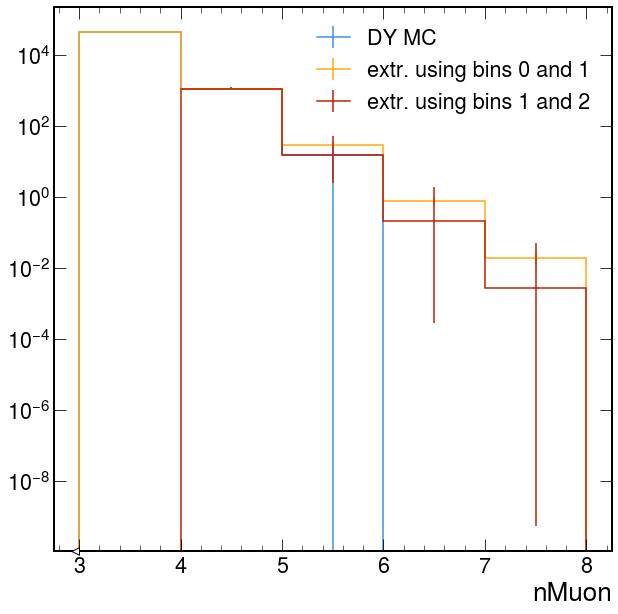

0.7924 ± 0.2128

0.2126 ± 0.4273

In [39]:
h = plots["DY_2018"]["ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"][
    1, 1, 1, 1, :
]

print(h[0])
print(h[1])
print(h[2])

h.plot(yerr=np.sqrt(h.variances()), label="DY MC")
pred(h).plot(label="extr. using bins 0 and 1")
pred(h[1:]).plot(label="extr. using bins 1 and 2")
plt.yscale("log")
plt.legend()
plt.show()

print(f"{pred(h)[6j::sum].value:.4f} ± {np.sqrt(pred(h)[6j::sum].variance):.4f}")
print(
    f"{pred(h[1:])[6j::sum].value:.4f} ± {np.sqrt(pred(h[1:])[6j::sum].variance):.4f}"
)

In [20]:
print(0.0009 + 0.0199 + 0.014)
print(np.sqrt(0.0021**2 + 0.0073**2 + 0.0032**2))

0.034800000000000005

0.00824257241399795

In [40]:
print(0.0142 + 0.7924 + 0.1479)


print(np.sqrt(0.0032**2 + 0.2128**2 + 0.2406**2))

0.9545

0.32122023597525734

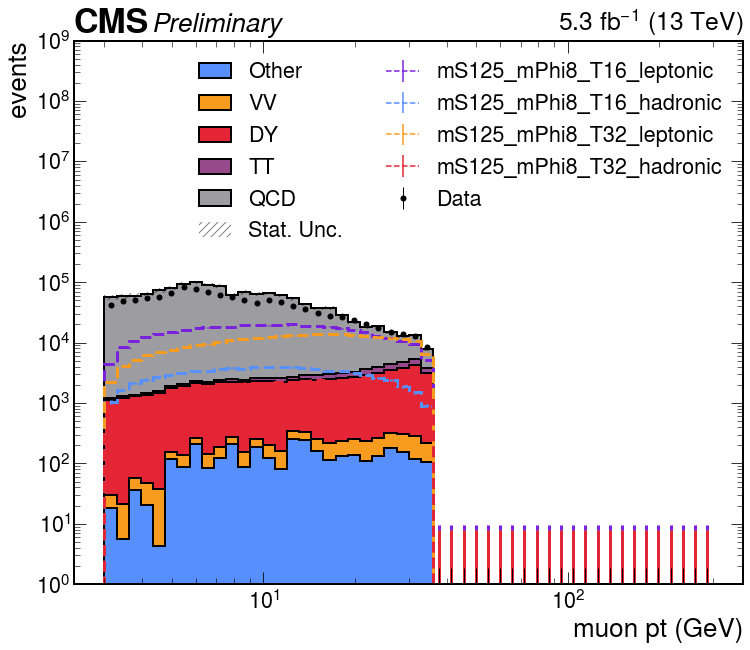

In [16]:
data = "DoubleMuon+Run2018A-UL2018_MiniAODv2-v1+MINIAOD_histograms_2018"
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]


hist_name = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_muon_pt"
slc = (1, 1, 1, 1, slice(None, None, 2j))

hists_mc = []
hist_bkg_total = None

for process in mc_processes:
    h_mc = plots[process][hist_name][slc]
    hists_mc.append(h_mc)
    if hist_bkg_total is None:
        hist_bkg_total = h_mc.copy()
    else:
        hist_bkg_total += h_mc.copy()

h_data = plots[data][hist_name][slc]

hists_signal = []
for process in signal_processes:
    h_signal = plots[process][hist_name][slc]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12, 10))

hep.histplot(
    hists_mc,
    stack=True,
    label=mc_labels,
    histtype="fill",
    ec="black",
    lw=2,
    ax=ax,
)

x_hatch = np.vstack(
    (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
).reshape((-1,), order="F")
y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
    (-1,), order="F"
)
y_hatch1_unc = np.vstack(
    (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
).reshape((-1,), order="F")
ax.fill_between(
    x=x_hatch,
    y1=y_hatch1 - y_hatch1_unc,
    y2=y_hatch1 + y_hatch1_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="none",
    edgecolor=(0, 0, 0, 0.5),
    linewidth=0,
    hatch="///",
    zorder=2,
)

hep.histplot(
    hists_signal,
    label=signal_labels,
    lw=3,
    ls="--",
    ax=ax,
)

hep.histplot(
    h_data,
    label=["Data"],
    histtype="errorbar",
    mec="black",
    mfc="black",
    ecolor="black",
    ax=ax,
)

hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
plt.ylim(1e0, 1e9)
plt.xscale("log")
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("muon pt (GeV)")
plt.ylabel("events")
plt.show()

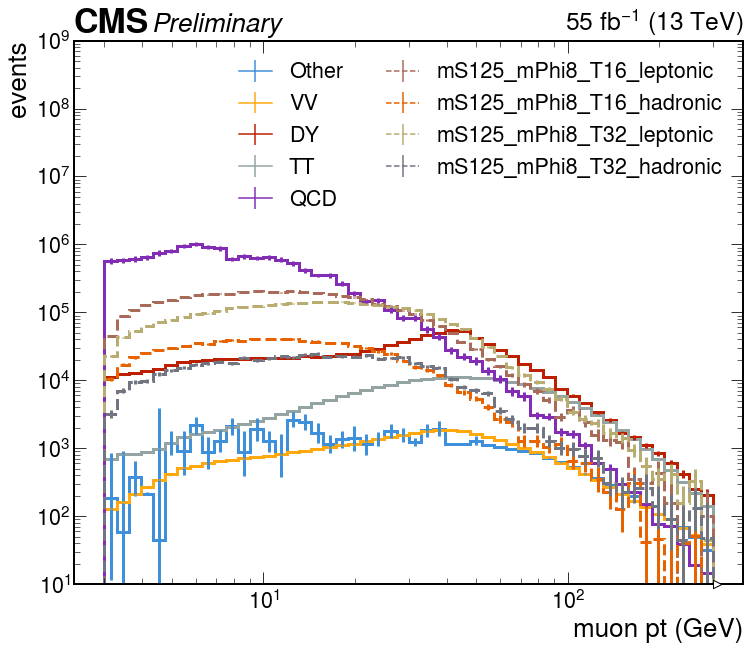

In [21]:
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]


hist_name = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_muon_pt"
slc = (1, 1, 1, 0, slice(None, None, 2j))

hists_mc = []
hist_bkg_total = None

for process in mc_processes:
    h_mc = plots[process][hist_name][slc]
    hists_mc.append(h_mc)

hists_signal = []
for process in signal_processes:
    h_signal = plots[process][hist_name][slc]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12, 10))

hep.histplot(
    hists_mc,
    label=mc_labels,
    lw=3,
    ax=ax,
)

hep.histplot(
    hists_signal,
    label=signal_labels,
    lw=3,
    ls="--",
    ax=ax,
)

# hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.ylim(1e1, 1e9)
plt.xscale("log")
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("muon pt (GeV)")
plt.ylabel("events")
plt.show()

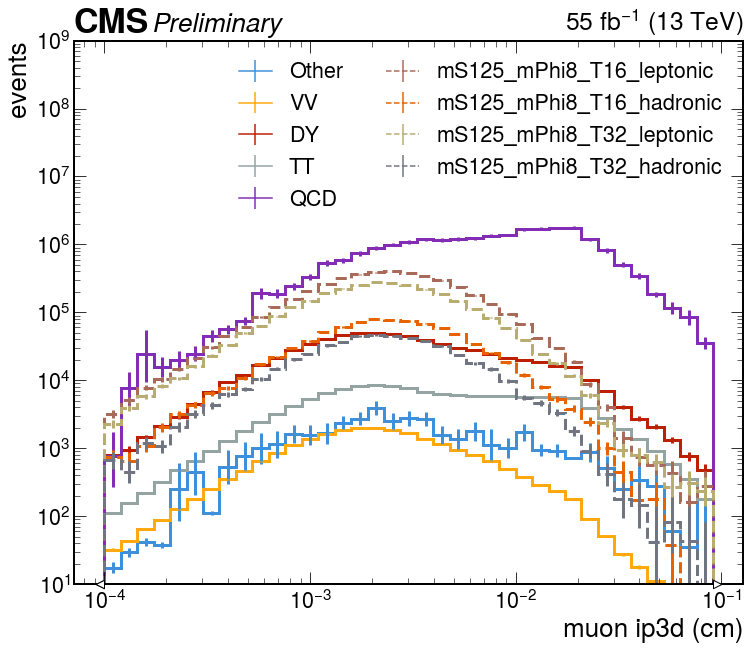

In [32]:
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]


hist_name = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_muon_ip3d"
slc = (0, 1, 1, 1, slice(None, 1e-1j, 2j))

hists_mc = []
hist_bkg_total = None

for process in mc_processes:
    h_mc = plots[process][hist_name][slc]
    hists_mc.append(h_mc)

hists_signal = []
for process in signal_processes:
    h_signal = plots[process][hist_name][slc]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12, 10))

hep.histplot(
    hists_mc,
    label=mc_labels,
    lw=3,
    ax=ax,
)

hep.histplot(
    hists_signal,
    label=signal_labels,
    lw=3,
    ls="--",
    ax=ax,
)

hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
# hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
plt.ylim(1e1, 1e9)
plt.xscale("log")
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("muon ip3d (cm)")
plt.ylabel("events")
plt.show()

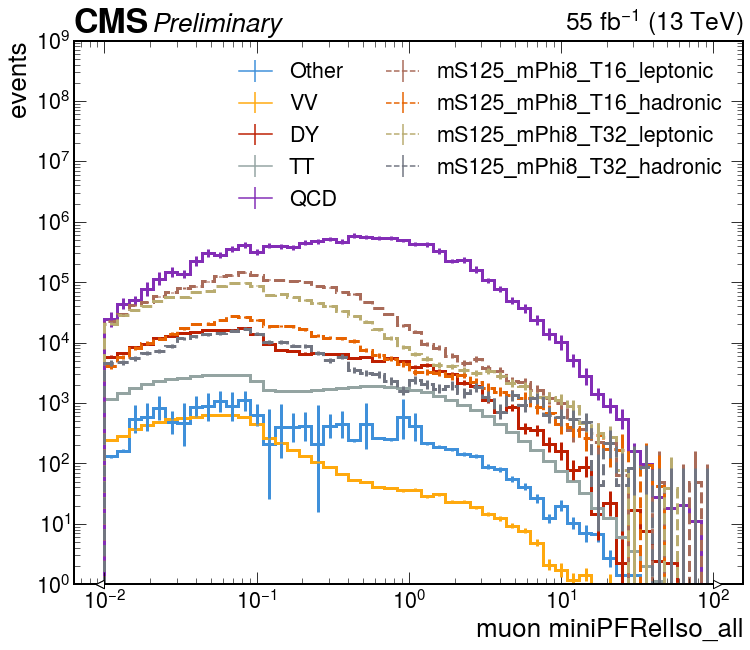

In [30]:
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]


hist_name = (
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_muon_miniPFRelIso_all"
)
slc = (1, 0, 1, 1, slice(None, None, 2j))

hists_mc = []
hist_bkg_total = None

for process in mc_processes:
    h_mc = plots[process][hist_name][slc]
    hists_mc.append(h_mc)

hists_signal = []
for process in signal_processes:
    h_signal = plots[process][hist_name][slc]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12, 10))

hep.histplot(
    hists_mc,
    label=mc_labels,
    lw=3,
    ax=ax,
)

hep.histplot(
    hists_signal,
    label=signal_labels,
    lw=3,
    ls="--",
    ax=ax,
)

# hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.ylim(1e0, 1e9)
plt.xscale("log")
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("muon miniPFRelIso_all")
plt.ylabel("events")
plt.show()

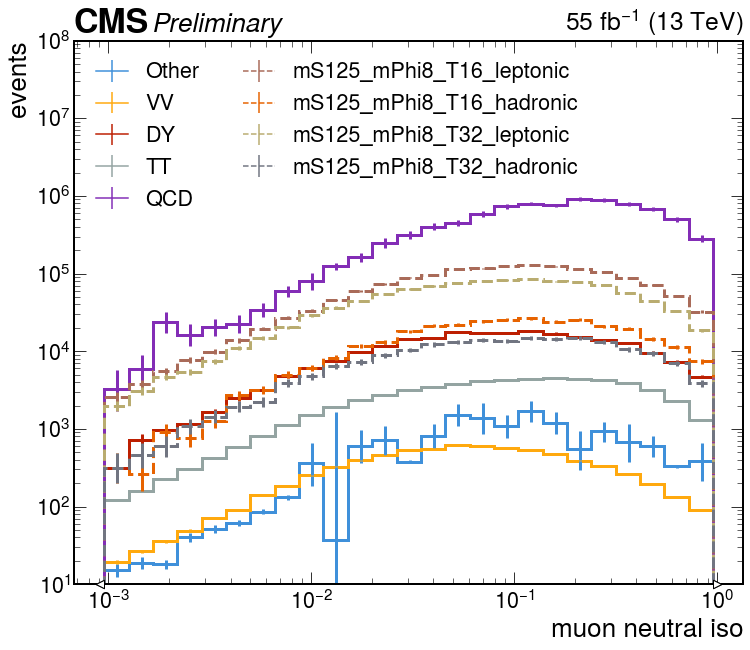

In [29]:
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]


hist_name = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_muon_neutral_iso"
slc = (1, 1, 0, 1, slice(1e-3j, 1j, 2j))

hists_mc = []
hist_bkg_total = None

for process in mc_processes:
    h_mc = plots[process][hist_name][slc]
    hists_mc.append(h_mc)

hists_signal = []
for process in signal_processes:
    h_signal = plots[process][hist_name][slc]
    hists_signal.append(h_signal)

fig, ax = plt.subplots(figsize=(12, 10))

hep.histplot(
    hists_mc,
    label=mc_labels,
    lw=3,
    ax=ax,
)

hep.histplot(
    hists_signal,
    label=signal_labels,
    lw=3,
    ls="--",
    ax=ax,
)

# hep.cms.label(llabel="Preliminary", data=True, lumi=5.3, ax=ax)
hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.ylim(1e1, 1e8)
plt.xscale("log")
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("muon neutral iso")
plt.ylabel("events")
plt.show()

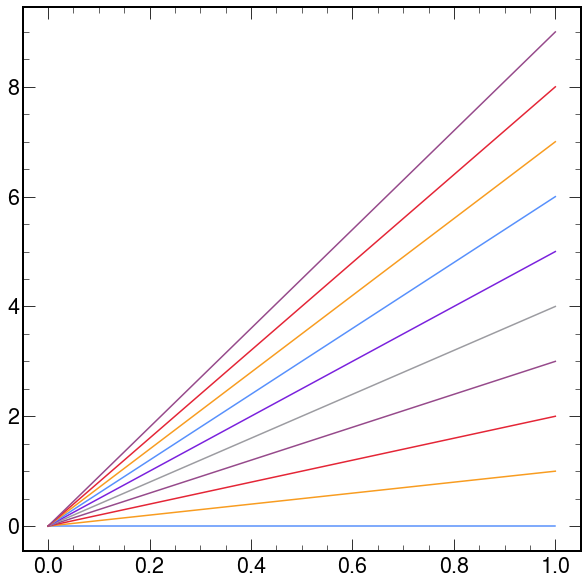

In [23]:
for i in range(10):
    plt.plot([0, 1], [0, i])
plt.show()

In [75]:
from cycler import cycler

cmap_petroff_6 = ["#5790fc", "#f89c20", "#e42536", "#964a8b", "#9c9ca1", "#7a21dd"]
cmap_petroff_10 = [
    "#3f90da",
    "#ffa90e",
    "#bd1f01",
    "#94a4a2",
    "#832db6",
    "#a96b59",
    "#e76300",
    "#b9ac70",
    "#717581",
    "#92dadd",
]

CMS = {"axes.prop_cycle": cycler("color", cmap_petroff_10)}
plt.style.use(CMS)

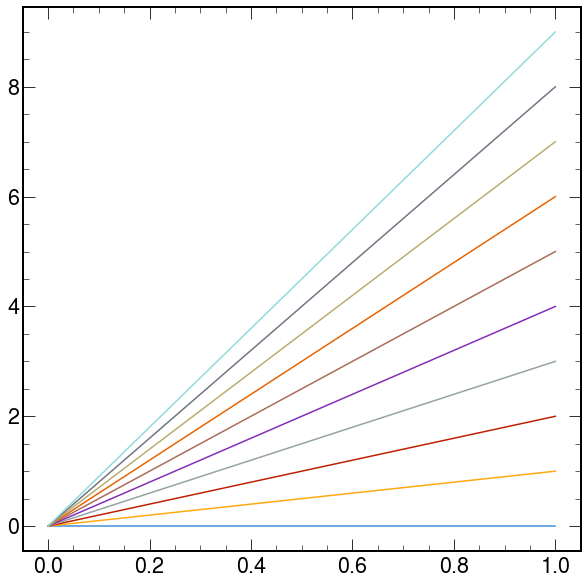

In [25]:
for i in range(10):
    plt.plot([0, 1], [0, i])
plt.show()

In [33]:
import ROOT

In [41]:
ROOT.RooStats.AsimovSignificance(1e5, 1, 1)

372.29985605662216

In [42]:
ROOT.RooStats.AsimovSignificance(1e5, 0.1, 0.1)

692.4988800685229

In [61]:
ROOT.RooStats.AsimovSignificance(
    1,
    0.1,
)

1.8097982208402172

In [130]:
print(
    [
        ROOT.RooStats.AsimovSignificance(1e0, i, 0.45 * i)
        / ROOT.RooStats.AsimovSignificance(1e1, i, 0.45 * i)
        for i in [1e-4, 1e-3, 1e-2, 1e-1, 1]
    ]
)

[0.2869140563317708, 0.27751377679296346, 0.2603140306067026, 0.22626200883310232, 0.16970594411087875]

In [115]:
1 / 6.661e-3

150.12760846719712

In [120]:
0.0076 * 1.3 / 0.0222

0.445045045045045

## Try Chris' method

[StairsArtists(stairs=<matplotlib.patches.StepPatch object at 0x7f20d7d28250>, errorbar=<ErrorbarContainer object of 3 artists>, legend_artist=<ErrorbarContainer object of 3 artists>)]

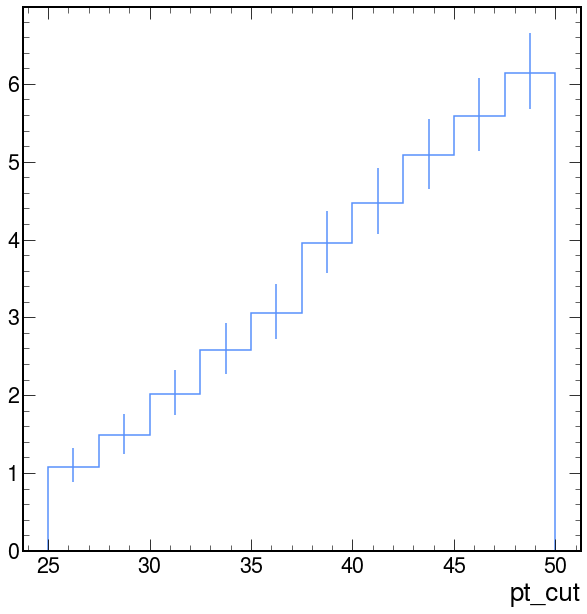

In [66]:
plots["TT_powheg_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
][0.09j, 1j, 0.9j, :, 5j::sum].plot()

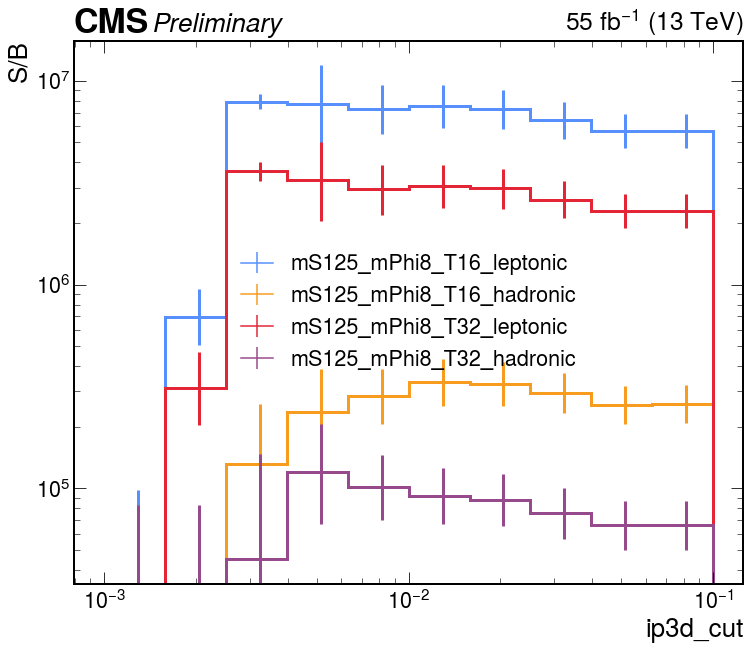

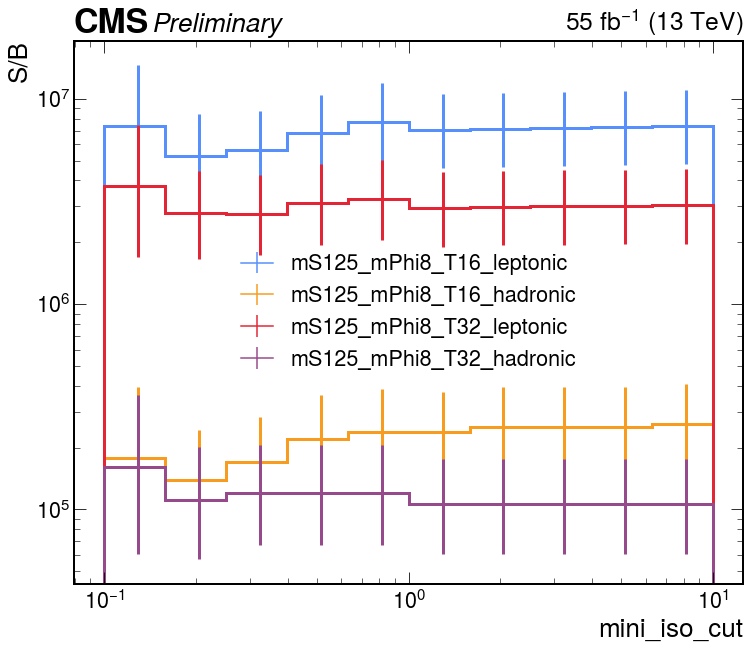

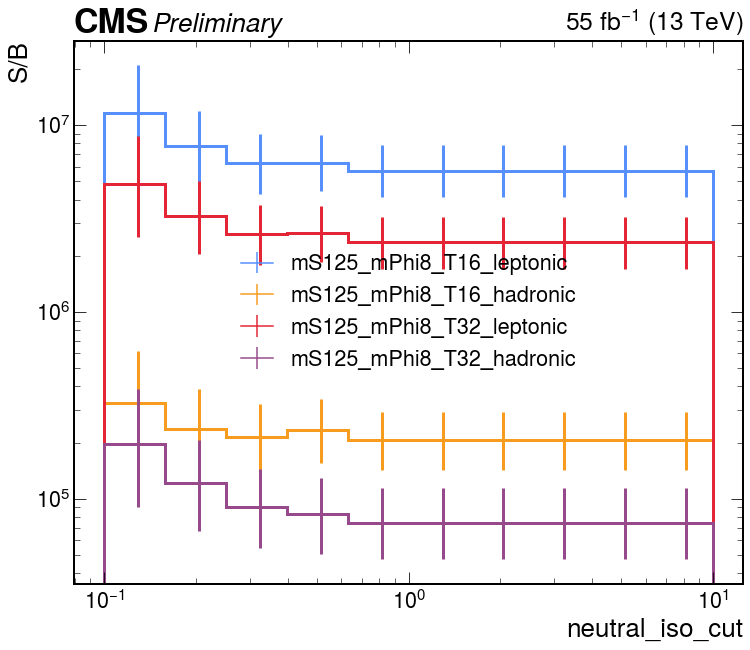

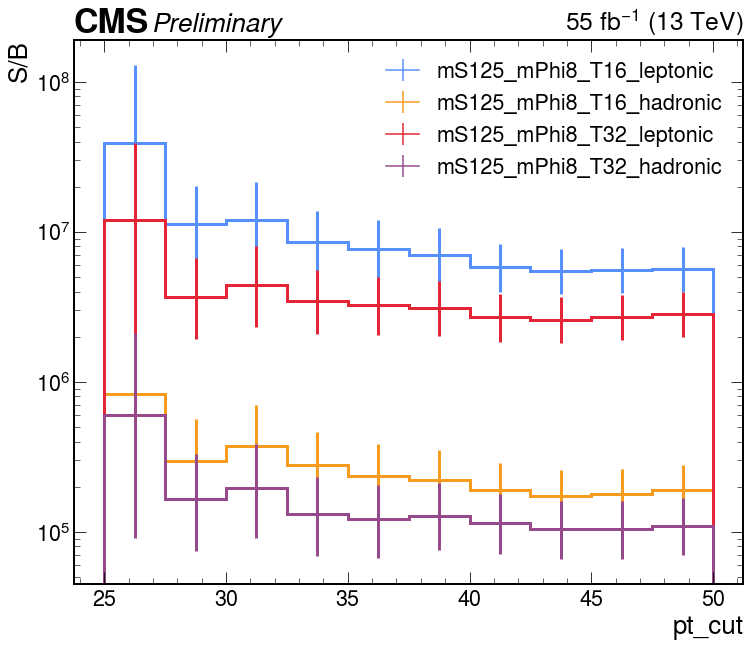

In [90]:
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]

histname = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"

# Begin using the starting point:
# default_cut = (0.1j*0.99, 10j*0.99, 10j*0.99, 50j*0.99)
default_cut = (0.006j, 0.5j, 0.2j, 30j)

cuts = [
    (slice(None), default_cut[1], default_cut[2], default_cut[3], slice(6j, None, sum)),
    (default_cut[0], slice(None), default_cut[2], default_cut[3], slice(6j, None, sum)),
    (default_cut[0], default_cut[1], slice(None), default_cut[3], slice(6j, None, sum)),
    (default_cut[0], default_cut[1], default_cut[2], slice(None), slice(6j, None, sum)),
]

for j, slc in enumerate(cuts):
    hist_bkg_total = None

    for process in mc_processes:
        h_mc = plots[process][histname][slc]
        # Here I could feed h_mc to the prediction function
        #         if
        #         if "QCD" in process:
        #             h_mc = pred(h_mc, offset=0)
        #         elif "DY" in process:
        #             h_mc = pred(h_mc, offset=1)
        if hist_bkg_total is None:
            hist_bkg_total = h_mc.copy()
        else:
            hist_bkg_total += h_mc.copy()

    hists_s_over_b = []
    for process in signal_processes:
        h_s = plots[process][histname][slc]
        h_s_over_b = h_s.copy()
        for i in range(len(h_s_over_b.values())):
            tot_bkg = hist_bkg_total[i].value
            if tot_bkg == 0:
                tot_bkg = 1e-3

            h_s_over_b[i] = (
                h_s[i].value / tot_bkg,
                h_s[i].variance / tot_bkg**2
                + h_s[i].value ** 2 * hist_bkg_total[i].variance / tot_bkg**4,
            )
        hists_s_over_b.append(h_s_over_b)

    fig, ax = plt.subplots(figsize=(12, 10))

    hep.histplot(
        hists_s_over_b,
        label=signal_labels,
        lw=3,
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
    # plt.ylim(1e-2, 2e0)
    if hist_bkg_total.axes[0].name != "pt_cut":
        ax.set_xscale("log")
    ax.set_yscale("log")
    plt.legend()
    plt.ylabel("S/B")
    plt.show()

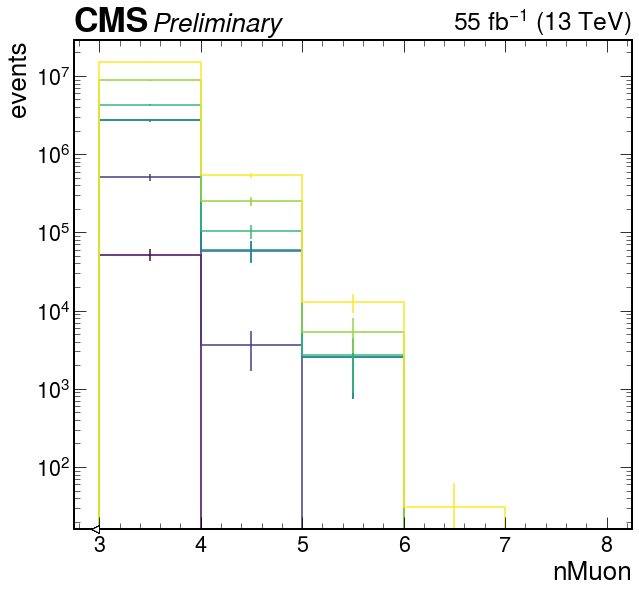

In [11]:
process = "QCD_Pt_MuEnriched_2018"
# process = 'DY_2018'

N = 7
plt.rcParams["axes.prop_cycle"] = plt.cycler(
    "color", plt.cm.viridis(np.linspace(0, 1, N))
)

histogram = plots[process][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
]

cuts = [
    (0.006j, 1j, 0.2j, 35j, slice(None)),
    (0.01j, 1j, 0.2j, 35j, slice(None)),
    (0.02j, 2j, 0.5j, 35j, slice(None)),
    (0.02j, 2j, 0.5j, 49j, slice(None)),
    (0.02j, 5j, 1j, 49j, slice(None)),
    (0.05j, 5j, 1j, 49j, slice(None)),
    (0.09j, 9j, 9j, 49j, slice(None)),
]

fig, ax = plt.subplots(figsize=(10, 9))

for cut in cuts:
    histogram[cut].plot(yerr=np.sqrt(histogram[cut].variances()))

hep.cms.label(llabel="Preliminary", data=True, lumi=55)
plt.yscale("log")
plt.ylabel("events")
plt.show()

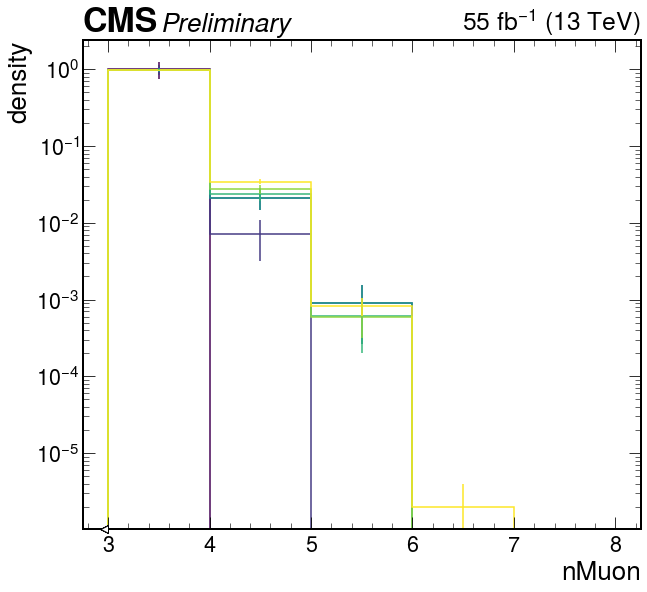

In [18]:
process = "QCD_Pt_MuEnriched_2018"
# process = 'DY_2018'

N = 7
plt.rcParams["axes.prop_cycle"] = plt.cycler(
    "color", plt.cm.viridis(np.linspace(0, 1, N))
)

histogram = plots[process][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
]

cuts = [
    (0.006j, 1j, 0.2j, 35j, slice(None)),
    (0.01j, 1j, 0.2j, 35j, slice(None)),
    (0.02j, 2j, 0.5j, 35j, slice(None)),
    (0.02j, 2j, 0.5j, 49j, slice(None)),
    (0.02j, 5j, 1j, 49j, slice(None)),
    (0.05j, 5j, 1j, 49j, slice(None)),
    (0.09j, 9j, 9j, 49j, slice(None)),
]

fig, ax = plt.subplots(figsize=(10, 9))

for cut in cuts:
    (histogram[cut] / histogram[cut].sum().value).plot(
        yerr=np.sqrt(
            histogram[cut].variances() / histogram[cut].sum().value ** 2
            + histogram[cut].values() ** 2
            * histogram[cut].sum().variance
            / histogram[cut].sum().value ** 4
        )
    )

hep.cms.label(llabel="Preliminary", data=True, lumi=55)
plt.yscale("log")
plt.ylabel("density")
plt.show()

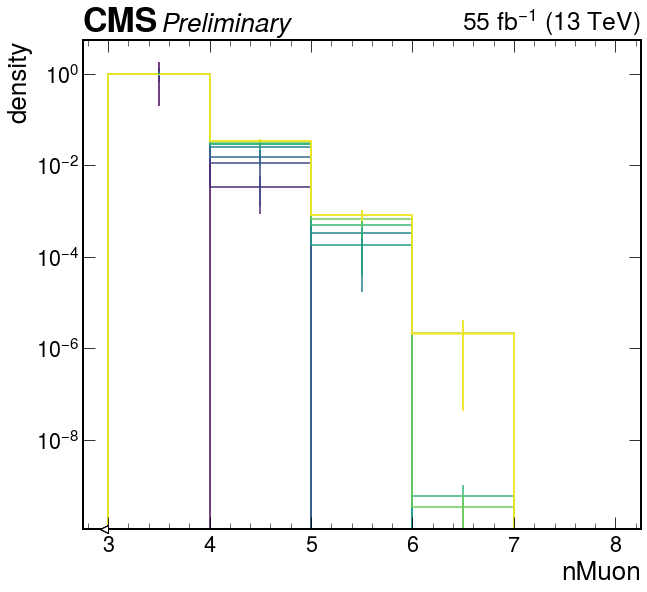

In [97]:
process = "QCD_Pt_MuEnriched_2018"

N = 10
plt.rcParams["axes.prop_cycle"] = plt.cycler(
    "color", plt.cm.viridis(np.linspace(0, 1, N))
)

histogram = plots[process][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
]

cut = (9.9j, 9.9j, 49j)

fig, ax = plt.subplots(figsize=(10, 9))

for i in range(10):
    slc = (i, *cut, slice(None))
    (histogram[slc] / histogram[slc].sum().value).plot(
        yerr=np.sqrt(
            histogram[slc].variances() / histogram[slc].sum().value ** 2
            + histogram[slc].values() ** 2
            * histogram[slc].sum().variance
            / histogram[slc].sum().value ** 4
        )
    )
hep.cms.label(llabel="Preliminary", data=True, lumi=55)
plt.yscale("log")
plt.ylabel("density")
plt.show()

## Estimate rate of drop

In [15]:
def muon_func_log(x, loga, logb):
    return loga - x * logb


def make_fit(process, cut=None, logb=None, nBins=None, verbose=False):
    """
    This function will use the loosest available cuts:
        - ip3d < 0.09,
        - mini_iso < 9,
        - neutral_iso < 9,
        - muon_pt < 49,
    and it will fit a power law function: a * b^-n using linear
    regression on the logarithms. The estimated parameter b is
    taken as the rate of drop for the given process.

    Input: name of the process (should be QCD or DY)
    Output: Minuit fit result
    """
    if cut is None:
        cut = (0.09j, 9j, 49j, slice(None))
    if nBins is not None:
        cut_list = list(cut)
        cut_list[-1] = slice(0, nBins)
        cut = tuple(cut_list)
    histname = "ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"
    h0 = plots[process][histname][cut]
    if len(np.where(h0.values() == 0)[0]) == 0:
        first_zero_bin = len(h0.values())
    else:
        first_zero_bin = np.where(h0.values() == 0)[0][0]
    data_x = np.array(list(range(first_zero_bin)))
    data_y = np.log10(h0.values()[:first_zero_bin])
    data_yerr = (np.sqrt(h0.variances()) / (h0.values() * np.log(10)))[:first_zero_bin]
    least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func_log)
    m = Minuit(least_squares, loga=1, logb=1)
    if logb is not None:
        m.fixto("logb", logb)
    m.migrad()
    m.hesse()
    if verbose:
        print(m)
    return m


def evaluate_fit(m):
    """
    This function accepts a Minuit fit result.
    It will output a histogram that represents an evaluation of the fit
    """
    h0 = hist.Hist.new.Reg(5, 3, 8, name="nMuon", label="nMuon").Weight()
    x = np.arange(3, 8)
    logy, logycov = propagate(
        lambda p: muon_func_log(x - 3, *p), m.values, m.covariance
    )
    logyerr_prop = np.diag(logycov) ** 0.5
    y = 10**logy
    yerr_prop = np.log(10) * y * logyerr_prop
    for i in range(len(h0.values())):
        h0[i] = (y[i], yerr_prop[i] ** 2)
    return h0


def plot_fit(process, m, cut=None):
    histname = "ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"
    if cut is None:
        cut = (0.09j, 9j, 49j, slice(None))
    else:
        # Make sure the nMuon is not cut
        cut_list = list(cut)
        cut_list[-1] = slice(None)
        cut = tuple(cut_list)

    h0 = plots[process][histname][cut]

    fig = plt.figure(figsize=(12, 12))
    plt.subplots_adjust(bottom=0.15, left=0.17)
    ax1 = plt.subplot2grid((5, 1), (0, 0), rowspan=3)
    ax2 = plt.subplot2grid((5, 1), (3, 0), sharex=ax1)
    ax3 = plt.subplot2grid((5, 1), (4, 0), sharex=ax1)

    x = np.arange(3, 8)
    logy, logycov = propagate(
        lambda p: muon_func_log(x - 3, *p), m.values, m.covariance
    )
    logyerr_prop = np.diag(logycov) ** 0.5

    y = 10**logy
    yerr_prop = np.log(10) * y * logyerr_prop

    x_hatch = np.vstack((np.arange(3, 8), np.arange(4, 9))).reshape((-1,), order="F")
    y_hatch = np.vstack((y, y)).reshape((-1,), order="F")
    y_hatch_unc = np.vstack((yerr_prop, yerr_prop)).reshape((-1,), order="F")
    hep.histplot(h0, yerr=np.sqrt(h0.variances()), label="MC", ax=ax1)
    hep.histplot(y, bins=np.arange(3, 9), label="fit", ax=ax1)
    ax1.fill_between(
        x=x_hatch,
        y1=y_hatch - y_hatch_unc,
        y2=y_hatch + y_hatch_unc,
        label="Stat. Unc.",
        step="pre",
        facecolor="C1",
        alpha=0.3,
        linewidth=0,
    )
    ax1.legend()
    ax1.set_yscale("log")
    ax1.set_xlabel("")
    ax1.set_ylabel("Events")
    ax1.set_xlim(2.8, 8.2)
    # ax1.axes.xaxis.set_ticklabels([])
    # ax1.set_xticklabels([])

    ratio = h0.values() / y
    ratio_err = np.sqrt(
        (y**-2) * (h0.variances()) + (h0.values() ** 2 * y**-4) * (yerr_prop**2)
    )
    ax2.errorbar(
        h0.axes.centers[0],
        ratio,
        yerr=ratio_err,
        color="black",
        fmt="o",
        linestyle="none",
    )
    ax2.axhline(1, ls="--", color="gray")
    ax2.set_xlabel("")
    ax2.set_ylabel("MC / fit")
    ax2.set_xlim(2.8, 8.2)
    ax2.set_ylim(0, 2)
    # ax2.set_xticklabels([])

    pulls = (h0.values() - y) / np.sqrt(h0.variances())
    pulls_up = np.where(pulls >= 0, pulls, 0)
    pulls_down = np.where(pulls < 0, pulls, 0)

    x_hatch = np.vstack((np.arange(3, 8), np.arange(4, 9))).reshape((-1,), order="F")
    y_hatch_up = np.vstack((pulls_up, pulls_up)).reshape((-1,), order="F")
    y_hatch_down = np.vstack((pulls_down, pulls_down)).reshape((-1,), order="F")

    ax3.fill_between(
        x=x_hatch,
        y1=0,
        y2=y_hatch_up,
        step="pre",
        facecolor="None",
        edgecolor="red",
        alpha=1,
        linewidth=0,
        hatch="///",
    )
    ax3.fill_between(
        x=x_hatch,
        y1=0,
        y2=y_hatch_down,
        step="pre",
        facecolor="None",
        edgecolor="blue",
        alpha=1,
        linewidth=0,
        hatch="///",
    )

    ax3.set_xlabel("nMuon")
    ax3.set_ylabel("pull")
    ax3.set_xlim(2.8, 8.2)
    ax3.set_ylim(-2.5, 2.5)

    temp = ax1.get_xticklabels()
    # ax1.set_xticklabels([])
    ax3.set_xticklabels(temp)

    plt.show()

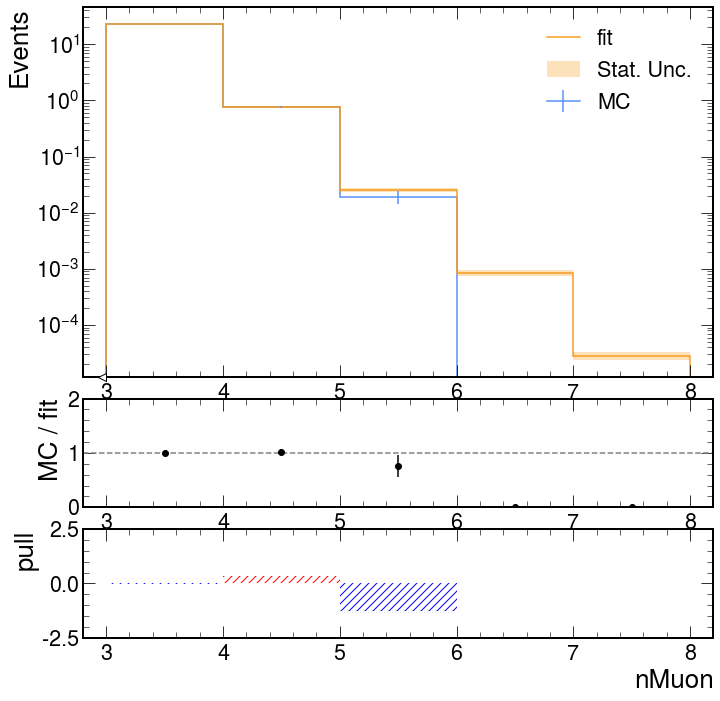

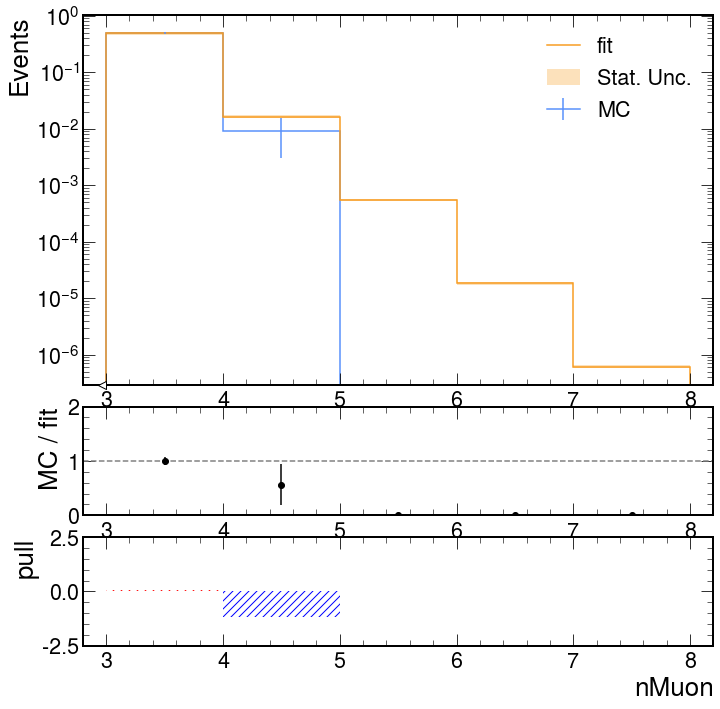

In [17]:
# First, run fit on a very loose cut to get rate of drop
m = make_fit("QCD_Pt_MuEnriched_2018", logb=None, verbose=False)
plot_fit(process="QCD_Pt_MuEnriched_2018", m=m)
# Then, rerun fit on the tight cut fixing the rate of drop
tight_cut = (0.007j, 1j, 35j, slice(None))
m = make_fit(
    "QCD_Pt_MuEnriched_2018",
    cut=tight_cut,
    logb=m.values["logb"],
    nBins=2,
    verbose=False,
)
plot_fit(process="QCD_Pt_MuEnriched_2018", m=m, cut=tight_cut)

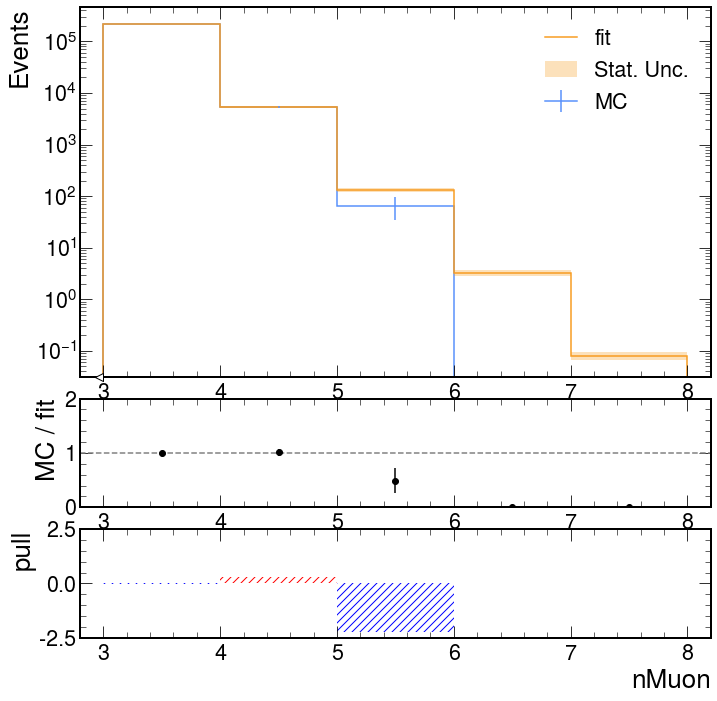

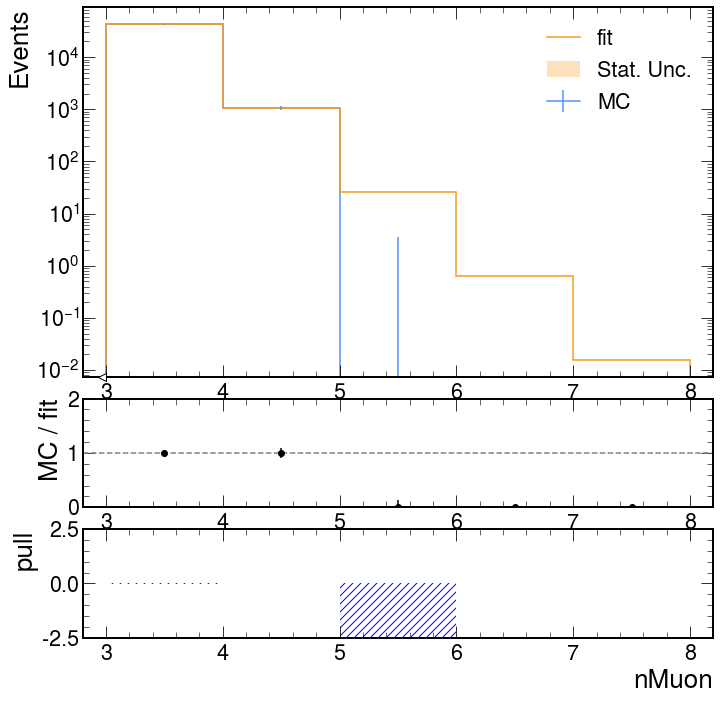

WeightedSum(value=0.659007, variance=0.000164628)

In [35]:
# First, run fit on a very loose cut to get rate of drop
m = make_fit("DY_2018", logb=None, verbose=False)
plot_fit(process="DY_2018", m=m)
# Then, rerun fit on the tight cut fixing the rate of drop
tight_cut = (0.007j, 1j, 35j, slice(None))
m = make_fit("DY_2018", cut=tight_cut, logb=m.values["logb"], nBins=2, verbose=False)
plot_fit(process="DY_2018", m=m, cut=tight_cut)
evaluate_fit(m)[6j::sum]

In [71]:
plots["DY_2018"]

{'ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon': Hist(
   Regular(10, 0.001, 0.1, transform=log, name='ip3d_cut'),
   Regular(10, 0.1, 10, transform=log, name='mini_iso_cut'),
   Regular(10, 0.1, 10, transform=log, name='neutral_iso_cut'),
   Regular(10, 25, 50, name='pt_cut'),
   Regular(5, 3, 8, name='nMuon'),
   storage=Weight()) # Sum: WeightedSum(value=5.60817e+08, variance=9.87081e+09) (WeightedSum(value=4.71613e+09, variance=6.21566e+10) with flow)}

Scan over ip3d

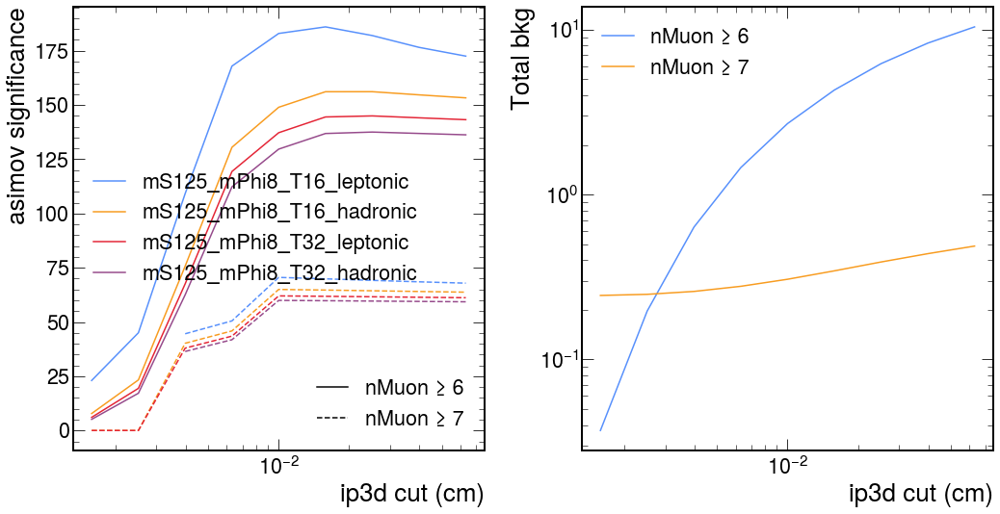

In [20]:
# Now do a full B prediction
histname = "ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]

tight_cut = (0.01j, 0.8j, 40j, slice(None))

hist_bkg_total = None

# First, run fit on a very loose cut to get rate of drop
m_loose_qcd = make_fit("QCD_Pt_MuEnriched_2018", logb=None, verbose=False)
m_loose_dy = make_fit("DY_2018", logb=None, verbose=False)

ip3d_cut_values = plots[mc_processes[0]][histname].axes[0].edges[1:10]

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(15, 8))

for i_sp, sp in enumerate(signal_processes):
    for nMuon_cut in [6j, 7j]:
        tot_B_values = []
        asimov_sig_values = []
        for ip3d_cut in range(1, 10):
            tight_cut = (ip3d_cut, 0.8j, 40j, slice(None))
            for process in mc_processes:
                h_mc = plots[process][histname][tight_cut]
                if "QCD" in process:
                    # Then, rerun fit on the tight cut fixing the rate of drop
                    m_tight_qcd = make_fit(
                        "QCD_Pt_MuEnriched_2018",
                        cut=tight_cut,
                        logb=m_loose_qcd.values["logb"],
                        nBins=2,
                        verbose=False,
                    )
                    h_mc = evaluate_fit(m_tight_qcd)
                elif "DY" in process:
                    # Then, rerun fit on the tight cut fixing the rate of drop
                    m_tight_dy = make_fit(
                        "DY_2018",
                        cut=tight_cut,
                        logb=m_loose_dy.values["logb"],
                        nBins=2,
                        verbose=False,
                    )
                    h_mc = evaluate_fit(m_tight_dy)
                if hist_bkg_total is None:
                    hist_bkg_total = h_mc.copy()
                else:
                    hist_bkg_total += h_mc.copy()
            # Tot B
            B = hist_bkg_total[nMuon_cut::sum]
            tot_B_values.append(B.value)

            h_S = plots[
                "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018"
            ][histname][tight_cut]
            S = h_S[nMuon_cut::sum]
            asimov_sig_values.append(
                ROOT.RooStats.AsimovSignificance(
                    S.value, B.value, np.sqrt(B.variance) * 1.5
                )
            )

        if i_sp == 0:
            axs[1].plot(
                ip3d_cut_values,
                tot_B_values,
                label=f"nMuon ≥ {nMuon_cut}".replace("j", ""),
            )

        ls = "-"
        label = (
            sp.replace("GluGluToSUEP_", "")
            .replace(".000", "")
            .replace("_13TeV_2018", "")
            .replace("mode", "")
        )
        if nMuon_cut == 7j:
            ls = "--"
            label = None
        axs[0].plot(
            ip3d_cut_values, asimov_sig_values, ls=ls, c=f"C{i_sp}", label=label
        )

first_legend = axs[0].legend()
axs[0].add_artist(first_legend)
(line2,) = axs[0].plot([], [], label="nMuon ≥ 6", c="black", ls="-")
(line3,) = axs[0].plot([], [], label="nMuon ≥ 7", c="black", ls="--")
second_legend = axs[0].legend(handles=[line2, line3], loc="lower right")
axs[0].set_xlabel("ip3d cut (cm)")
axs[0].set_ylabel("asimov significance")
axs[0].set_xscale("log")

axs[1].legend()
axs[1].set_xlabel("ip3d cut (cm)")
axs[1].set_ylabel("Total bkg")
axs[1].set_yscale("log")
axs[1].set_xscale("log")

plt.tight_layout()
plt.show()

Scan over mini_iso

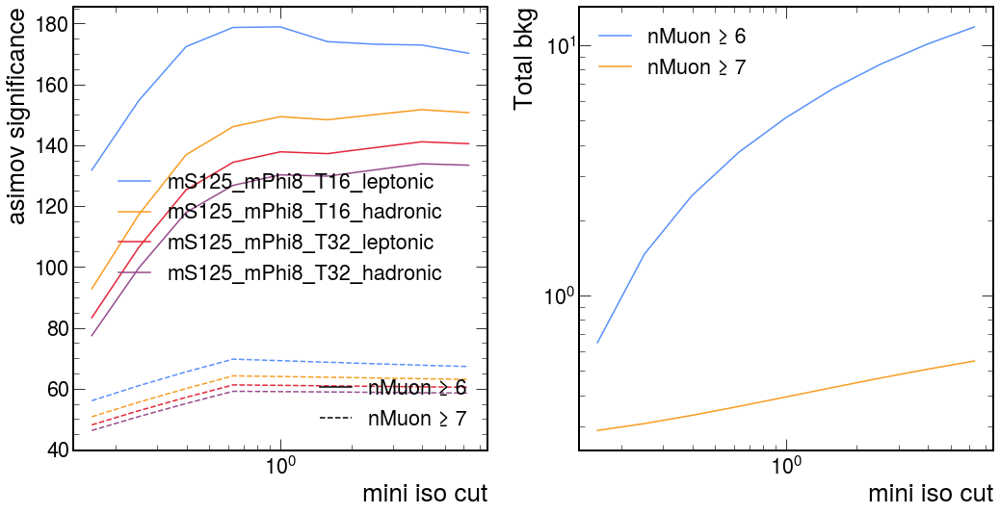

In [24]:
# Now do a full B prediction
histname = "ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]

tight_cut = (0.01j, 0.8j, 40j, slice(None))

hist_bkg_total = None

# First, run fit on a very loose cut to get rate of drop
m_loose_qcd = make_fit("QCD_Pt_MuEnriched_2018", logb=None, verbose=False)
m_loose_dy = make_fit("DY_2018", logb=None, verbose=False)

mini_iso_cut_values = plots[mc_processes[0]][histname].axes[1].edges[1:10]

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(15, 8))

for i_sp, sp in enumerate(signal_processes):
    for nMuon_cut in [6j, 7j]:
        tot_B_values = []
        asimov_sig_values = []
        for mini_iso_cut in range(1, 10):
            tight_cut = (0.01j, mini_iso_cut, 40j, slice(None))
            for process in mc_processes:
                h_mc = plots[process][histname][tight_cut]
                if "QCD" in process:
                    # Then, rerun fit on the tight cut fixing the rate of drop
                    m_tight_qcd = make_fit(
                        "QCD_Pt_MuEnriched_2018",
                        cut=tight_cut,
                        logb=m_loose_qcd.values["logb"],
                        nBins=2,
                        verbose=False,
                    )
                    h_mc = evaluate_fit(m_tight_qcd)
                elif "DY" in process:
                    # Then, rerun fit on the tight cut fixing the rate of drop
                    m_tight_dy = make_fit(
                        "DY_2018",
                        cut=tight_cut,
                        logb=m_loose_dy.values["logb"],
                        nBins=2,
                        verbose=False,
                    )
                    h_mc = evaluate_fit(m_tight_dy)
                if hist_bkg_total is None:
                    hist_bkg_total = h_mc.copy()
                else:
                    hist_bkg_total += h_mc.copy()
            # Tot B
            B = hist_bkg_total[nMuon_cut::sum]
            tot_B_values.append(B.value)

            h_S = plots[
                "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018"
            ][histname][tight_cut]
            S = h_S[nMuon_cut::sum]
            asimov_sig_values.append(
                ROOT.RooStats.AsimovSignificance(
                    S.value, B.value, np.sqrt(B.variance) * 1.5
                )
            )

        if i_sp == 0:
            axs[1].plot(
                mini_iso_cut_values,
                tot_B_values,
                label=f"nMuon ≥ {nMuon_cut}".replace("j", ""),
            )

        ls = "-"
        label = (
            sp.replace("GluGluToSUEP_", "")
            .replace(".000", "")
            .replace("_13TeV_2018", "")
            .replace("mode", "")
        )
        if nMuon_cut == 7j:
            ls = "--"
            label = None
        axs[0].plot(
            mini_iso_cut_values, asimov_sig_values, ls=ls, c=f"C{i_sp}", label=label
        )

first_legend = axs[0].legend()
axs[0].add_artist(first_legend)
(line2,) = axs[0].plot([], [], label="nMuon ≥ 6", c="black", ls="-")
(line3,) = axs[0].plot([], [], label="nMuon ≥ 7", c="black", ls="--")
second_legend = axs[0].legend(handles=[line2, line3], loc="lower right")
axs[0].set_xlabel("mini iso cut")
axs[0].set_ylabel("asimov significance")
axs[0].set_xscale("log")

axs[1].legend()
axs[1].set_xlabel("mini iso cut")
axs[1].set_ylabel("Total bkg")
axs[1].set_yscale("log")
axs[1].set_xscale("log")

plt.tight_layout()
plt.show()

Scan over pt cut

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.456 (χ²/ndof = 2.5)      │              Nfcn = 47               │
│ EDM = 9.72e-21 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ loga │   5.337   │   0.004   │            │            │         │         │       │
│ 1 │ logb │   1.607   │   0.020   │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────┬───────────────────┐
│      │     loga     logb │
├──────┼───────────────────┤
│ loga │ 1.37e-05 0.013e-3 │
│ logb │ 0.013e-3 0.000393 │
└──────┴───────────────────┘

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0                          │              Nfcn = 91               │
│ EDM = 0 (Goal: 0.0002)           │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│           Hesse FAILED           │       Covariance NOT pos. def.       │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ loga │     1     │     0     │            │            │         │         │       │
│ 1 │ logb │   1.607   │   0.010   │            │            │         │         │  yes  │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘

TypeError: unsupported operand type(s) for *: 'float' and 'NoneType'

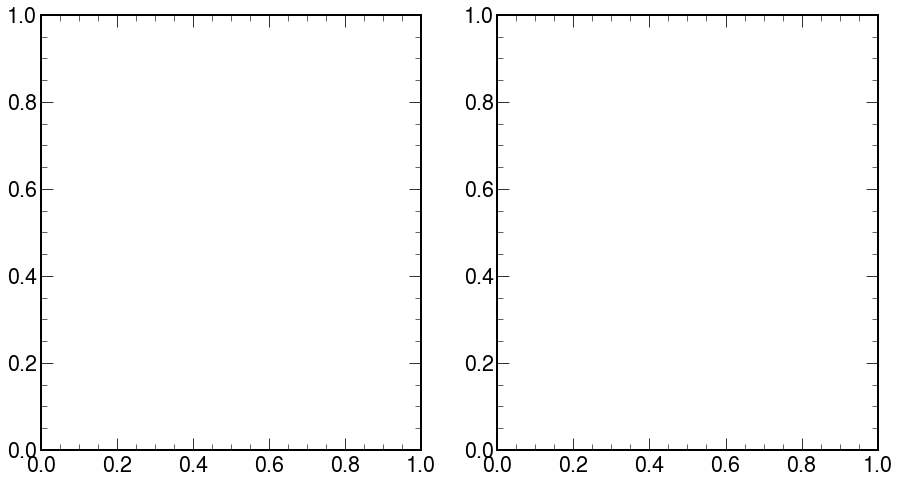

In [42]:
# Now do a full B prediction
histname = "ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]

tight_cut = (0.01j, 0.8j, 40j, slice(None))

hist_bkg_total = None

# First, run fit on a very loose cut to get rate of drop
m_loose_qcd = make_fit("QCD_Pt_MuEnriched_2018", logb=None, verbose=False)
m_loose_dy = make_fit("DY_2018", logb=None, verbose=False)

print(m_loose_dy)

pt_cut_values = plots[mc_processes[0]][histname].axes[2].edges[1:10]

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(15, 8))

for i_sp, sp in enumerate(signal_processes):
    for nMuon_cut in [6j, 7j]:
        tot_B_values = []
        asimov_sig_values = []
        for pt_cut in range(1, 10):
            tight_cut = (0.01j, 0.8j, pt_cut, slice(None))
            for process in mc_processes:
                h_mc = plots[process][histname][tight_cut]
                if "QCD" in process:
                    # Then, rerun fit on the tight cut fixing the rate of drop
                    m_tight_qcd = make_fit(
                        "QCD_Pt_MuEnriched_2018",
                        cut=tight_cut,
                        logb=m_loose_qcd.values["logb"],
                        nBins=2,
                        verbose=False,
                    )
                    h_mc = evaluate_fit(m_tight_qcd)
                elif "DY" in process:
                    # Then, rerun fit on the tight cut fixing the rate of drop
                    m_tight_dy = make_fit(
                        "DY_2018",
                        cut=tight_cut,
                        logb=m_loose_dy.values["logb"],
                        nBins=1,
                        verbose=False,
                    )
                    #                     j = 1
                    #                     while (not m_tight_dy.valid) and (j > 0):
                    #                         m_tight_dy = make_fit(
                    #                             "DY_2018", cut=tight_cut, logb=m_loose_dy.values['logb'], nBins=j, verbose=False
                    #                         )
                    #                         j -= 1

                    print(m_tight_dy)
                    h_mc = evaluate_fit(m_tight_dy)
                if hist_bkg_total is None:
                    hist_bkg_total = h_mc.copy()
                else:
                    hist_bkg_total += h_mc.copy()
            # Tot B
            B = hist_bkg_total[nMuon_cut::sum]
            tot_B_values.append(B.value)

            h_S = plots[
                "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018"
            ][histname][tight_cut]
            S = h_S[nMuon_cut::sum]
            asimov_sig_values.append(
                ROOT.RooStats.AsimovSignificance(
                    S.value, B.value, np.sqrt(B.variance) * 1.5
                )
            )

        if i_sp == 0:
            axs[1].plot(
                pt_cut_values,
                tot_B_values,
                label=f"nMuon ≥ {nMuon_cut}".replace("j", ""),
            )

        ls = "-"
        label = (
            sp.replace("GluGluToSUEP_", "")
            .replace(".000", "")
            .replace("_13TeV_2018", "")
            .replace("mode", "")
        )
        if nMuon_cut == 7j:
            ls = "--"
            label = None
        axs[0].plot(pt_cut_values, asimov_sig_values, ls=ls, c=f"C{i_sp}", label=label)

first_legend = axs[0].legend()
axs[0].add_artist(first_legend)
(line2,) = axs[0].plot([], [], label="nMuon ≥ 6", c="black", ls="-")
(line3,) = axs[0].plot([], [], label="nMuon ≥ 7", c="black", ls="--")
second_legend = axs[0].legend(handles=[line2, line3], loc="lower right")
axs[0].set_xlabel("pt cut")
axs[0].set_ylabel("asimov significance")

axs[1].legend()
axs[1].set_xlabel("pt cut")
axs[1].set_ylabel("Total bkg")
axs[1].set_yscale("log")

plt.tight_layout()
plt.show()

In [40]:
m_tight_dy.valid

False

In [37]:
data_yerr

array([212134.03174917,  36722.51186398,   3383.98539441,     30.52957837])

In [55]:
def pred(h_in, offset=0):
    # Use bins offset, offset+1 to guess the function. Defaults to 0, 1.
    f0 = h_in.values()[offset]
    f1 = h_in.values()[1 + offset]
    var_f0 = h_in.variances()[offset]
    var_f1 = h_in.variances()[1 + offset]
    values = [f1 * (f1 / f0) ** (n - 1) for n in range(len(h_in.values()))]
    variances = [
        (
            ((n - 1) * (f1 / f0) ** n) ** 2 * var_f0
            + (n * (f1 / f0) ** (n - 1)) ** 2 * var_f1
        )
        for n in range(len(h_in.values()))
    ]
    h_out = h_in.copy().reset()
    for i in range(len(h_in.values())):
        h_out[i] = (values[i], variances[i])
    return h_out

In [66]:
def pred_new(h_in, B, var_B):
    f0 = h_in.values()[0]
    var_f0 = h_in.variances()[0]
    values = [f0 * B ** (-n) for n in range(len(h_in.values()))]
    variances = [
        (B ** (-2 * n) * var_f0 + (n * B ** (-n - 1) * f0) ** 2 * var_B)
        for n in range(len(h_in.values()))
    ]
    h_out = h_in.copy().reset()
    for i in range(len(h_in.values())):
        h_out[i] = (values[i], variances[i])
    return h_out

In [57]:
hep.style.use(hep.style.CMS)

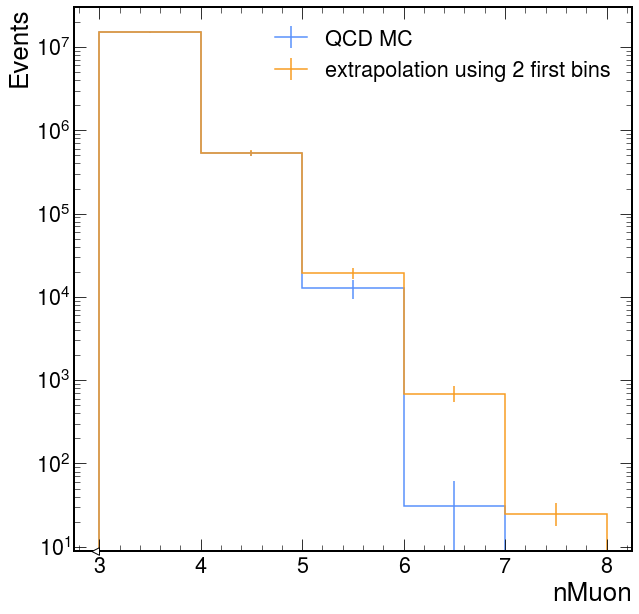

707.6257 ± 142.2537

[ 1.          1.          1.49625648 21.89389129         inf]

[ 0.02005544  0.09712591  0.44699477 21.89847564         nan]

In [59]:
h = plots["QCD_Pt_MuEnriched_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
][0.09j, 9j, 9j, 49j, :]

h.plot(yerr=np.sqrt(h.variances()), label="QCD MC")
pred(h).plot(label="extrapolation using 2 first bins")
plt.ylabel("Events")
plt.yscale("log")
# plt.ylim(1e-4, 1e7)
plt.legend()
plt.show()

print(f"{pred(h)[6j::sum].value:.4f} ± {np.sqrt(pred(h)[6j::sum].variance):.4f}")

print(pred(h).values() / h.values())
print(
    np.sqrt(
        pred(h).variances() / (h.values() ** 2)
        + pred(h).values() ** 2 * h.variances() / (h.values() ** 4)
    )
)

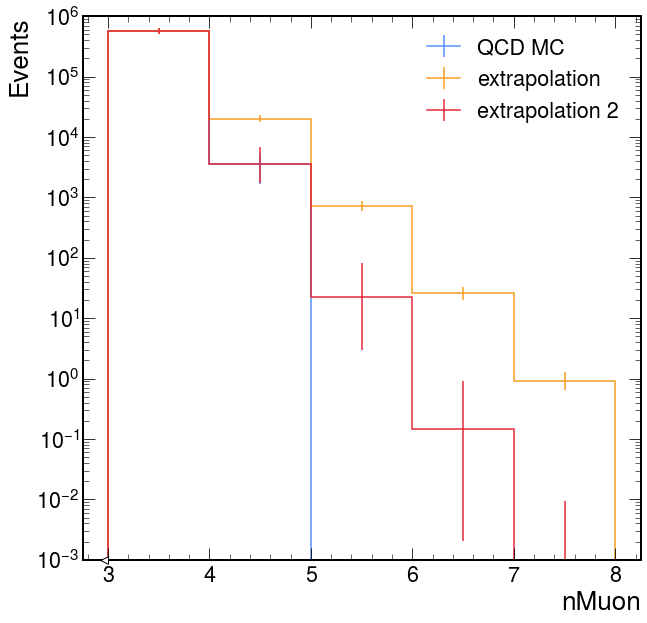

In [73]:
h_loose = plots["QCD_Pt_MuEnriched_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
][0.09j, 9j, 9j, 49j, :]
B = h_loose[0].value / h_loose[1].value
var_B = (
    h_loose[0].variance / h_loose[1].value ** 2
    + (h_loose[0].value ** 2 / h_loose[1].value ** 4) * h_loose[1].variance
)

h = plots["QCD_Pt_MuEnriched_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
][0.011j, 1.01j, 0.101j, 35.01j, :]

h.plot(yerr=np.sqrt(h.variances()), label="QCD MC")
pred_new(h, B, var_B).plot(label="extrapolation")
pred(h).plot(label="extrapolation 2")
plt.ylabel("Events")
plt.ylim(1e-3, 1e6)
plt.yscale("log")
plt.legend()
plt.show()

# print(f"{pred_new(h)[6j::sum].value:.4f} ± {np.sqrt(pred_new(h)[6j::sum].variance):.4f}")

# print(pred(h).values() / h.values())
# print(np.sqrt(pred(h).variances() / (h.values()**2) + pred(h).values()**2 * h.variances() / (h.values()**4)))

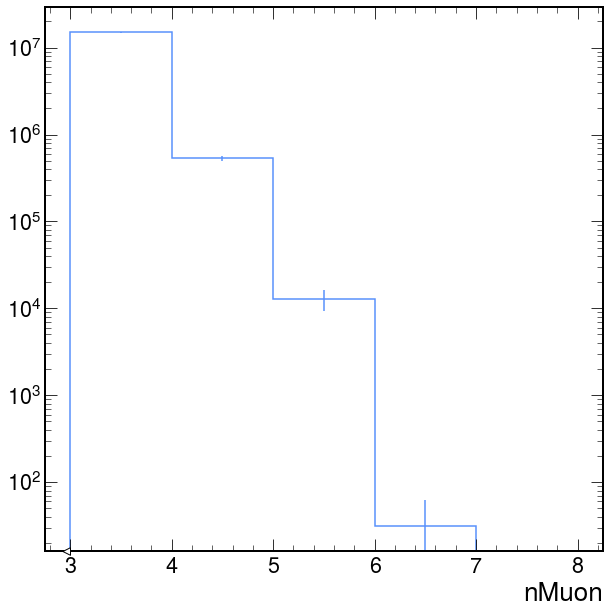

In [41]:
histogram = plots["QCD_Pt_MuEnriched_2018"][
    "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
]

cuts = [
    (0.09j, 9j, 9j, 49j, slice(None)),
]

for cut in cuts:
    histogram[cut].plot(yerr=np.sqrt(histogram[cut].variances()))
plt.yscale("log")
plt.show()

In [12]:
import ROOT

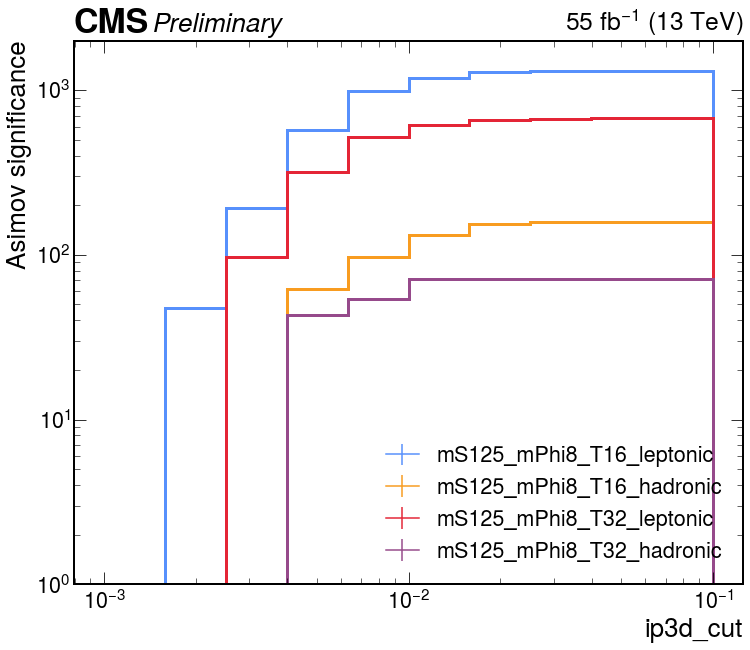

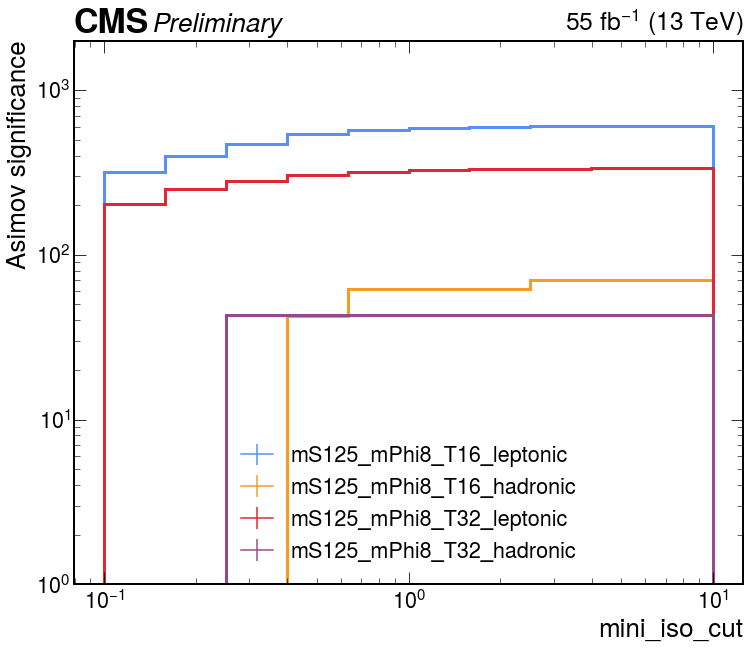

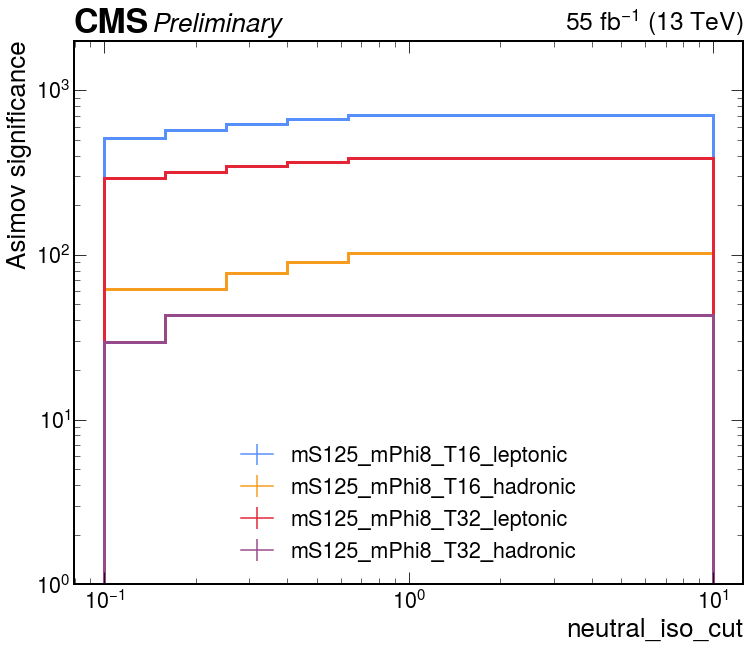

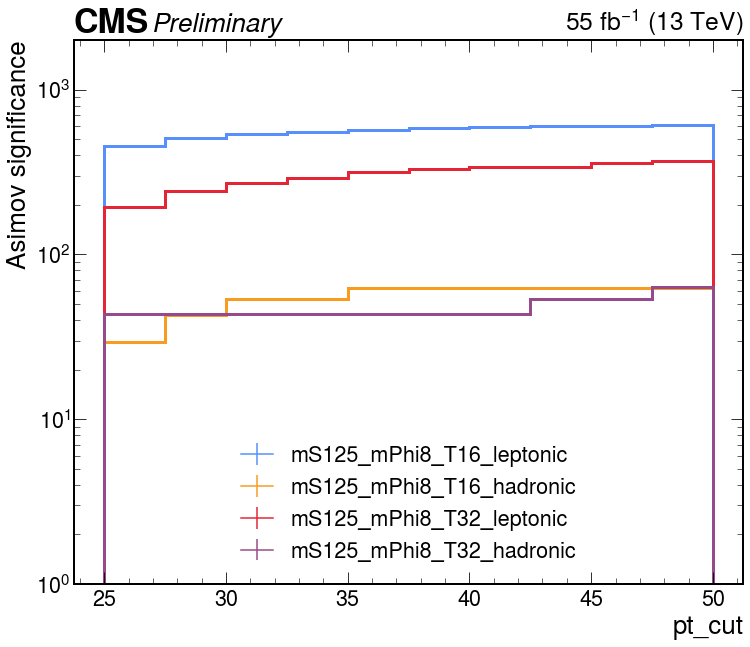

In [14]:
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

signal_processes = [
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
signal_labels = [
    "mS125_mPhi8_T16_leptonic",
    "mS125_mPhi8_T16_hadronic",
    "mS125_mPhi8_T32_leptonic",
    "mS125_mPhi8_T32_hadronic",
]

histname = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"

# Begin using the starting point:
# default_cut = (0.1j*0.99, 10j*0.99, 10j*0.99, 50j*0.99)
default_cut = (0.006j, 1j, 0.2j, 35j)

cuts = [
    (slice(None), default_cut[1], default_cut[2], default_cut[3], slice(7j, None, sum)),
    (default_cut[0], slice(None), default_cut[2], default_cut[3], slice(7j, None, sum)),
    (default_cut[0], default_cut[1], slice(None), default_cut[3], slice(7j, None, sum)),
    (default_cut[0], default_cut[1], default_cut[2], slice(None), slice(7j, None, sum)),
]

for j, slc in enumerate(cuts):
    hist_bkg_total = None

    for process in mc_processes:
        h_mc = plots[process][histname][slc]
        # Here I could feed h_mc to the prediction function
        #         if
        #         if "QCD" in process:
        #             h_mc = pred(h_mc, offset=0)
        #         elif "DY" in process:
        #             h_mc = pred(h_mc, offset=1)
        if hist_bkg_total is None:
            hist_bkg_total = h_mc.copy()
        else:
            hist_bkg_total += h_mc.copy()

    significances = []
    for process in signal_processes:
        h_s = plots[process][histname][slc]
        h_sig = h_s.copy()
        for i in range(len(h_sig.values())):
            tot_bkg = hist_bkg_total[i].value
            tot_bkg_var = hist_bkg_total[i].value
            if tot_bkg == 0:
                tot_bkg = 1e-3
            #             if tot_bkg_var == 0:
            #                 tot_bkg_var = 1e-3

            h_sig[i] = (
                ROOT.RooStats.AsimovSignificance(
                    h_s[i].value, tot_bkg, np.sqrt(tot_bkg_var) * 1.3
                ),
                0,
            )
        significances.append(h_sig)

    fig, ax = plt.subplots(figsize=(12, 10))

    hep.histplot(
        significances,
        label=signal_labels,
        lw=3,
        ax=ax,
    )

    hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
    plt.ylim(1, 2e3)
    if hist_bkg_total.axes[0].name != "pt_cut":
        ax.set_xscale("log")
    ax.set_yscale("log")
    plt.legend()
    plt.ylabel("Asimov significance")
    plt.show()

In [80]:
hist_bkg_total.axes[0].name

'pt_cut'

## Evaluate final cuts

In [30]:
tight_cut = (0.008j, 0.65j, 49j, slice(None))

In [33]:
[
    ax.edges
    for ax in plots["DY_2018"]["ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"].axes
]

[array([0.001     , 0.00158489, 0.00251189, 0.00398107, 0.00630957,
        0.01      , 0.01584893, 0.02511886, 0.03981072, 0.06309573,
        0.1       ]),
 array([ 0.1       ,  0.15848932,  0.25118864,  0.39810717,  0.63095734,
         1.        ,  1.58489319,  2.51188643,  3.98107171,  6.30957344,
        10.        ]),
 array([25. , 27.5, 30. , 32.5, 35. , 37.5, 40. , 42.5, 45. , 47.5, 50. ]),
 array([3., 4., 5., 6., 7., 8.])]

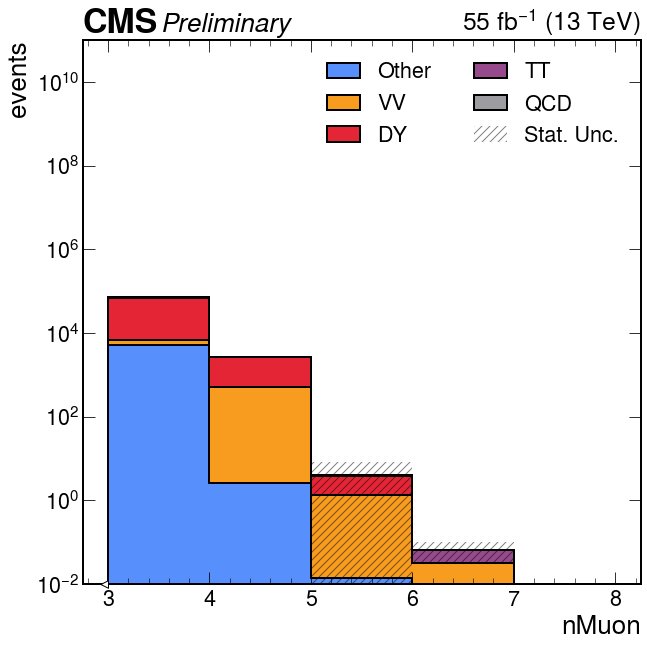

In [32]:
# Pre-fit
histname = "ip3d_cut_vs_mini_iso_cut_vs_pt_cut_vs_nMuon"
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

hist_bkg_total = None

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 10))

h_bkg_list = []
for process in mc_processes:
    h_mc = plots[process][histname][tight_cut]
    h_bkg_list.append(h_mc)
    if hist_bkg_total is None:
        hist_bkg_total = h_mc.copy()
    else:
        hist_bkg_total += h_mc.copy()

hep.histplot(
    h_bkg_list,
    stack=True,
    label=mc_labels,
    histtype="fill",
    ec="black",
    lw=2,
    ax=ax,
)

x_hatch = np.vstack(
    (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
).reshape((-1,), order="F")
y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
    (-1,), order="F"
)
y_hatch1_unc = np.vstack(
    (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
).reshape((-1,), order="F")
ax.fill_between(
    x=x_hatch,
    y1=y_hatch1 - y_hatch1_unc,
    y2=y_hatch1 + y_hatch1_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="none",
    edgecolor=(0, 0, 0, 0.5),
    linewidth=0,
    hatch="///",
    zorder=2,
)

hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.ylim(1e-2, 1e11)
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("nMuon")
plt.ylabel("events")
plt.show()

Other_2018: 0.000 ± 0.000

VV_2018: 0.000 ± 0.000

DY_2018: 0.034 ± 0.001

TT_powheg_2018: 0.000 ± 0.000

QCD_Pt_MuEnriched_2018: 0.369 ± 0.042

tot bkg: 0.403 ± 0.042

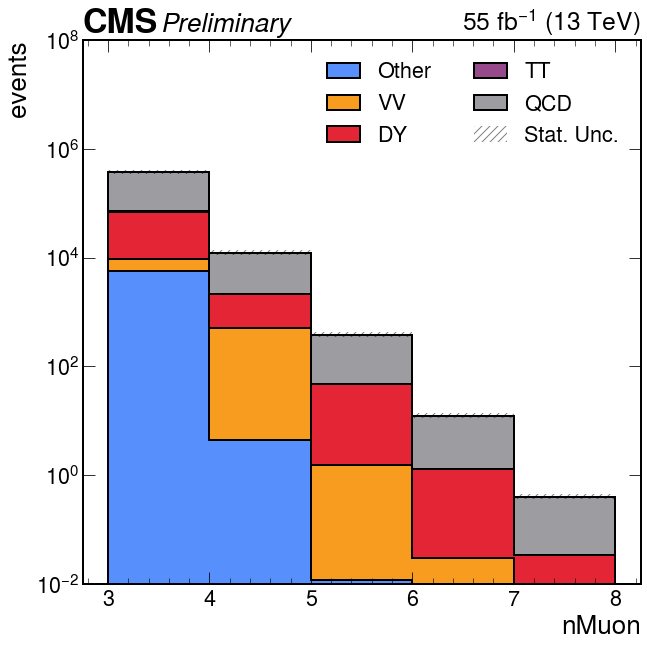

In [73]:
histname = "ip3d_cut_vs_mini_iso_cut_vs_neutral_iso_cut_vs_pt_cut_vs_nMuon"
mc_processes = [
    "Other_2018",
    "VV_2018",
    "DY_2018",
    "TT_powheg_2018",
    "QCD_Pt_MuEnriched_2018",
]
mc_labels = ["Other", "VV", "DY", "TT", "QCD"]

hist_bkg_total = None

# First, run fit on a very loose cut to get rate of drop
m_loose_qcd = make_fit("QCD_Pt_MuEnriched_2018", logb=None, verbose=False)
m_loose_dy = make_fit("DY_2018", logb=None, verbose=False)

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 10))

h_bkg_list = []
for process in mc_processes:
    h_mc = plots[process][histname][tight_cut]
    if "QCD" in process:
        # Then, rerun fit on the tight cut fixing the rate of drop
        m_tight_qcd = make_fit(
            "QCD_Pt_MuEnriched_2018",
            cut=tight_cut,
            logb=m_loose_qcd.values["logb"],
            nBins=2,
            verbose=False,
        )
        h_mc = evaluate_fit(m_tight_qcd)
    elif "DY" in process:
        # Then, rerun fit on the tight cut fixing the rate of drop
        m_tight_dy = make_fit(
            "DY_2018",
            cut=tight_cut,
            logb=m_loose_dy.values["logb"],
            nBins=2,
            verbose=False,
        )
        h_mc = evaluate_fit(m_tight_dy)
    h_bkg_list.append(h_mc)
    print(
        f"{process}: {h_mc[7j::sum].value:.3f} ± {np.sqrt(h_mc[7j::sum].variance):.3f}"
    )
    if hist_bkg_total is None:
        hist_bkg_total = h_mc.copy()
    else:
        hist_bkg_total += h_mc.copy()
print(
    f"tot bkg: {hist_bkg_total[7j::sum].value:.3f} ± {np.sqrt(hist_bkg_total[7j::sum].variance):.3f}"
)

hep.histplot(
    h_bkg_list,
    stack=True,
    label=mc_labels,
    histtype="fill",
    ec="black",
    lw=2,
    ax=ax,
)

x_hatch = np.vstack(
    (hist_bkg_total.axes[0].edges[:-1], hist_bkg_total.axes[0].edges[1:])
).reshape((-1,), order="F")
y_hatch1 = np.vstack((hist_bkg_total.values(), hist_bkg_total.values())).reshape(
    (-1,), order="F"
)
y_hatch1_unc = np.vstack(
    (np.sqrt(hist_bkg_total.variances()), np.sqrt(hist_bkg_total.variances()))
).reshape((-1,), order="F")
ax.fill_between(
    x=x_hatch,
    y1=y_hatch1 - y_hatch1_unc,
    y2=y_hatch1 + y_hatch1_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="none",
    edgecolor=(0, 0, 0, 0.5),
    linewidth=0,
    hatch="///",
    zorder=2,
)

hep.cms.label(llabel="Preliminary", data=True, lumi=55, ax=ax)
plt.ylim(1e-2, 1e8)
plt.yscale("log")
plt.legend(ncol=2)
plt.xlabel("nMuon")
plt.ylabel("events")
plt.show()

In [34]:
m_tight_dy

IndexError: index 0 is out of bounds for axis 0 with size 0

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0                          │              Nfcn = 91               │
│ EDM = 0 (Goal: 0.0002)           │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│           Hesse FAILED           │       Covariance NOT pos. def.       │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬──────